**Table of Content**
* I. Generate Images of All Fluorinated Compounds with Atom Indices
* II. Generate SDF Files for All Fluorianted Compounds
* III. Pre-analysis of the 19F NMR Dataset
* IV. 3D Feature sets
* V. 2D Feature sets
* VI. Train Test Split
* VII. Ridge Model with 3D Feature Set
* VIII. Ridge Model with 2D Feature Set
* IX. Feed Forward Neural Network (FFNN) with 3D Feature Set
* X. Feed Forward Neural Network (FFNN) with 2D Feature Set

In [3]:
import os
import sys
import pickle
import pandas as pd
import numpy as np
from IPython.display import Image

# https://www.rdkit.org/
# https://github.com/rdkit/rdkit
from rdkit import Chem
from rdkit.Chem import Draw

from sklearn.metrics import mean_squared_error, make_scorer, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Lambda
from tensorflow.keras.models import load_model

# plot
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Add the src and external folders to the path
# The src file contains self-defined modules
# The external folder contains the HOSE code generator
src_path = os.path.join("..")
if src_path not in sys.path:
    sys.path.append(src_path)

src_path = os.path.join("..", "src")
if src_path not in sys.path:
    sys.path.append(src_path)

src_path = os.path.join("..", "external", "HOSE_code_generator")
if src_path not in sys.path:
    sys.path.append(src_path)

# From src import self-defined modules
# common.py contains the function for data preprocessing, plot, etc.
# atomic_features_2D.py contains the function related to 2D atomic feature generation
# atomic_features_3D.py contains the function related to 3D atomic feature generation
from src import (
    common, 
    atomic_features_2D,
    atomic_features_3D,
)

RANDOM_STATE = 1

# Set pandas options for better display
pd.set_option("display.max_rows", 10)
pd.set_option("display.max_columns", 100)

# Suppress FutureWarnings from RDKit
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

In [4]:
# Import the original dataset
data_path = os.path.join("..", "dataset", "Raw_PFAS 19F NMR spectra data.csv")
All_fluorinated_compounds = pd.read_csv(data_path, index_col=0)
All_fluorinated_compounds.head(3)

,Group,IsPFAS(haveCF2),Compound name,Code,Solvent_used_for_NMR,SMILES,Internal Standard,FluorineInConjSystem,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70
0,Per- and polyfluorinated carboxylic acids,True,perfluoropropionic acid,COOH_1,CDCl3,O=C(O)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-122.45,-122.45,NaN,-83.40,-83.40,-83.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Per- and polyfluorinated carboxylic acids,True,perfluorobutanoic acid,COOH_2,CDCl3,O=C(O)C(F)(F)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-119.78,-119.78,NaN,-127.39,-127.39,NaN,-81.14,-81.14,-81.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Per- and polyfluorinated carboxylic acids,True,perfluoropentanoic acid,COOH_3,CDCl3,O=C(O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-119.41,-119.41,NaN,-123.99,-123.99,NaN,-126.26,-126.26,NaN,-81.19,-81.19,-81.19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#
# Data Preprocessing
#

# Transform ionic compounds to neutral compounds, e.g., O=S([O-])(C(F)(C(F)(C(F)(C(F)(C(F)(F)F)F)F)F)F)=O.[Na+] to O=S(O)(C(F)(C(F)(C(F)(C(F)(C(F)(F)F)F)F)F)F)=O
All_fluorinated_compounds['SMILES'] = All_fluorinated_compounds['SMILES'].apply(common.ionic_to_neutral_smiles)

# Transform SMILES to canonical SMILES
All_fluorinated_compounds['SMILES'] = common.canonical_smiles(All_fluorinated_compounds["SMILES"])

# Save the transformed dataset
All_fluorinated_compounds.to_csv(
    os.path.join("..", "dataset", "Processed_PFAS_19F_NMR_spectra_data.csv"),
    index=False,
)

# I. Generate Images of All Fluorinated Compounds with Atom Indices<a class="anchor" id="1"></a>

In [6]:
from rdkit.Chem.Draw import rdMolDraw2D

All_fluorinated_compounds = pd.read_csv(
    os.path.join("..", "dataset", "Processed_PFAS_19F_NMR_spectra_data.csv")
)

# Transform SMILES to mol
All_fluorinated_compounds["mols"] = [
    Chem.MolFromSmiles(smi) for smi in All_fluorinated_compounds["SMILES"]
]

# Transform SMILES to 3D conformation
All_fluorinated_compounds["3D_Conformation"] = [
    atomic_features_3D.Transform_SMILE_to_3D_conformation(smi)
    for smi in All_fluorinated_compounds["SMILES"]
]

# Generate the 2D images of all the fluorinated compounds and saved them in a folder
for mol in All_fluorinated_compounds["mols"]:
    for i, atom in enumerate(mol.GetAtoms()):
        atom.SetProp("molAtomMapNumber", str(atom.GetIdx()))

        # Find the corresponding 'Code' for the current molecule
        fluorinated_compounds_code = All_fluorinated_compounds.loc[
            All_fluorinated_compounds["mols"] == mol, "Code"
        ].values[0]

        # Save the molecule image with the Code as part of the file name
        # First check if the file already exists
        # If the file doesn't exist, create the image
        file_path = os.path.join(
            "..", "dataset", "pictures", f"{fluorinated_compounds_code}.png"
        )
        # if not os.path.exists(file_path):
        drawer = rdMolDraw2D.MolDraw2DCairo(600, 400)
        drawer.DrawMolecule(mol)
        drawer.FinishDrawing()
        with open(file_path, "wb") as f:
            f.write(drawer.GetDrawingText())

            # Draw.MolToFile(mol, file_path, size=(600, 400))

[15:45:54] UFFTYPER: Warning: hybridization set to SP3 for atom 6


# II. Generate SDF Files for All Fluorinated Compounds <a class="anchor" id="2"></a>

In [5]:
for index, row in All_fluorinated_compounds.iterrows():
    try:
        # Use the 'Code' value as the filename, create the sdf file if it doesn't exist
        file_path = os.path.join("..", "dataset", "sdf", f"{row['Code']}.sdf")
        if not os.path.exists(file_path):
            hmol_3D = row["3D_Conformation"]
            w = Chem.SDWriter(file_path)
            w.write(hmol_3D)
            w.close()
    except Exception as e:
        print(f"Error processing row {index}: {e}")

The atomic properties of the atoms and their nearest neighbors in 3D space were generated using the CDK package, implemented in Java, based on the generated 3D SDF structure. This step utilized an open-source project available at https://github.com/tsajed/nmr-pred.git.

Generated data files were stored in the files: './All fluorinated_compounds/neighbors' and'./All fluorinated_compounds/descriptors'.

# III. Pre-analysis of the 19F NMR Dataset<a class="anchor" id="3"></a>

In [7]:
# Load the original dataset
All_fluorinated_compounds = pd.read_csv(
    os.path.join("..", "dataset", "Processed_PFAS_19F_NMR_spectra_data.csv")
)

All_fluorinated_compounds.head(5)

,Group,IsPFAS(haveCF2),Compound name,Code,Solvent_used_for_NMR,SMILES,Internal Standard,FluorineInConjSystem,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70
0,Per- and polyfluorinated carboxylic acids,True,perfluoropropionic acid,COOH_1,CDCl3,O=C(O)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-122.45,-122.45,NaN,-83.40,-83.40,-83.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Per- and polyfluorinated carboxylic acids,True,perfluorobutanoic acid,COOH_2,CDCl3,O=C(O)C(F)(F)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-119.78,-119.78,NaN,-127.39,-127.39,NaN,-81.14,-81.14,-81.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Per- and polyfluorinated carboxylic acids,True,perfluoropentanoic acid,COOH_3,CDCl3,O=C(O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-119.41,-119.41,NaN,-123.99,-123.99,NaN,-126.26,-126.26,NaN,-81.19,-81.19,-81.19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Per- and polyfluorinated carboxylic acids,True,perfluorohexanoic acid,COOH_4,CDCl3,O=C(O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-119.23,-119.23,NaN,-122.87,-122.87,NaN,-123.25,-123.25,NaN,-126.44,-126.44,NaN,-81.06,-81.06,-81.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Per- and polyfluorinated carboxylic acids,True,perfluoroheptanoic acid,COOH_5,CDCl3,O=C(O)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F,NaN,0.0,NaN,NaN,NaN,NaN,-119.14,-119.14,NaN,-122.01,-122.01,NaN,-122.99,-122.99,NaN,-122.99,-122.99,NaN,-126.29,-126.29,NaN,-80.96,-80.96,-80.96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Note: Columns labeled 1 through 70 represent atom indices. If the atom indice corresponding to a fluorine (F) atom, the chemical shift values for the atom will be displayed in that column.

## Number of PFAS in our dataset

In [8]:
# Count the number of PFAS in the dataset
PFAS_num = (All_fluorinated_compounds["IsPFAS(haveCF2)"] == True).sum()
print(f"Number of PFAS in the dataset is {PFAS_num}")
print(f"Number of fluorinated compounds in the dataset is {len(All_fluorinated_compounds)}")

Number of PFAS in the dataset is 431
Number of fluorinated compounds in the dataset is 647


## Error Distribution in 19F NMR Data of the Same Fluorinated Compound Reported by Different Sources

In [9]:
# Count the number of duplicated fluorinated compounds in the dataset
duplicates_compounds = All_fluorinated_compounds[
    All_fluorinated_compounds["SMILES"].duplicated()
]["SMILES"].values
num_duplicated_compounds = len(duplicates_compounds)
print(
    f"There are {num_duplicated_compounds} compounds that have been reported multiple times in the dataset from different sources."
)

There are 41 compounds that have been reported multiple times in the dataset from different sources.


In [10]:
# Solvents included in the dataset
duplicated_fluorinated_compounds = All_fluorinated_compounds[
    All_fluorinated_compounds["SMILES"].isin(duplicates_compounds)
]

solvents = duplicated_fluorinated_compounds["Solvent_used_for_NMR"].unique()
print(
    f"The solvents used for NMR experiments with these duplicated fluorinated compounds: {solvents}"
)

The solvents used for NMR experiments with these duplicated fluorinated compounds: ['CDCl3' 'CD3OD' 'DMSO-d6' 'D2O']


In [11]:
# Analysis the chemcial shifts of the duplicated fluorinated compounds
# Plot the error distribution 
NMR_shift_duplicated = pd.DataFrame()
all_errors = []
for SMILES in duplicated_fluorinated_compounds["SMILES"].values:
    peaks = duplicated_fluorinated_compounds[
        duplicated_fluorinated_compounds["SMILES"] == SMILES
    ]

    compound_name = peaks["Compound name"]
    code = peaks["Code"]
    peaks = peaks.drop(
        [
            "Group",
            "IsPFAS(haveCF2)",
            # "CAS",
            "Compound name",
            # "Source",
            # "Note",
            "SMILES",
            "Internal Standard",
            "FluorineInConjSystem",
        ],
        axis=1,
    )
    peaks = peaks.dropna(axis=1, how="any")
    peaks = peaks.reset_index(drop=True)
    only_peaks = peaks.drop(["Code", "Solvent_used_for_NMR"], axis=1)
    for col in only_peaks:
        only_peaks[col] = pd.to_numeric(only_peaks[col])
    errors = only_peaks.max() - only_peaks.min()
    all_errors.extend(errors.values)
    peaks_melted = pd.melt(
        peaks,
        id_vars=["Code", "Solvent_used_for_NMR"],
        var_name="index_suffix",
        value_name="values",
    )
    peaks_melted["index"] = peaks_melted["Code"] + "_" + peaks_melted["index_suffix"]
    df_transformed = peaks_melted[
        ["index", "values", "Solvent_used_for_NMR", "index_suffix"]
    ].set_index("index")
    df_transformed["SMILES"] = SMILES
    NMR_shift_duplicated = pd.concat([NMR_shift_duplicated, df_transformed])

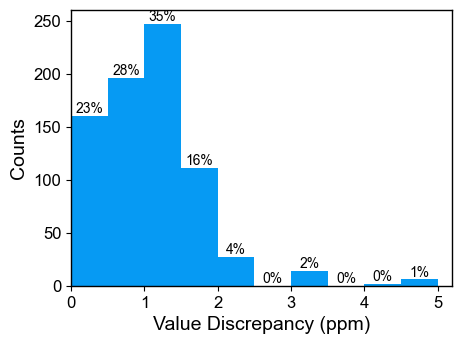

In [25]:
"""Plot the histogram of the errors"""
# Create the figure and axes with specified size
cm = 1 / 2.54  # centimeters in inches
plt.rcParams['font.family'] = 'Arial'
fig, ax = plt.subplots(figsize=(12 * cm, 9 * cm))  # 8 cm x 8 cm

# Plot the histogram
counts, edges, bars = ax.hist(all_errors, bins=10, color="#069AF3")

# Set border (edge) line width
ax.spines["top"].set_linewidth(1)  # Top border
ax.spines["right"].set_linewidth(1)  # Right border
ax.spines["bottom"].set_linewidth(1)  # Bottom border
ax.spines["left"].set_linewidth(1)  # Left border

# Set axis titles and tick label font sizes
ax.set_xlabel("Value Discrepancy (ppm)", fontsize=14)  # Replace with your label
ax.set_ylabel("Counts", fontsize=14)  # Replace with your label
ax.tick_params(axis="x", labelsize=12)  # X-axis numbers font size
ax.tick_params(axis="y", labelsize=12)  # Y-axis numbers font size

# Add bar labels
for b in ax.containers:
    ax.bar_label(b, labels=[f'{v/704*100:.0f}%' for v in b.datavalues])

ax.set_xticks([0, 1, 2, 3, 4, 5])
ax.set_ylim([0, 260])
ax.set_xlim([0, 5.2])

# Show the plot
plt.tight_layout()
plt.show()

Figure: Error Distribution in 19F NMR Data of the Same Fluorinated Compound from Different Sources

We examined the fluorinated compounds data with deviations exceeding 2.5 ppm and found that these deviations primarily arise from reporting errors rather than specific solvent differences. Therefore, the influence of solvents on 19F NMR appears to be negligible.

In [13]:
# Get the range of 19F NMR shift values in our dataset
temp_fluorinated_compounds = All_fluorinated_compounds.drop(
    [
        "IsPFAS(haveCF2)",
        "Compound name",
        "Code",
        "Solvent_used_for_NMR",
        "SMILES",
        "FluorineInConjSystem",
        "Group",
        # "CAS",
        # "Source",
        # "Note",
        "Internal Standard",
    ],
    axis=1,
)

for col in temp_fluorinated_compounds.columns:
    temp_fluorinated_compounds[col] = pd.to_numeric(
        temp_fluorinated_compounds[col], errors="coerce"
    )

max_values = temp_fluorinated_compounds.max()
min_values = temp_fluorinated_compounds.min()

temp_df = pd.DataFrame()
temp_df["max"] = max_values
temp_df["min"] = min_values

upper_range_of_chemical_shift = temp_df.max().max()
lower_range_of_chemical_shift = temp_df.min().min()

print(
    f"The range of 19F NMR shift values in our dataset is from {lower_range_of_chemical_shift} to {upper_range_of_chemical_shift}"
)

The range of 19F NMR shift values in our dataset is from -268.0 to -5.1


## Data distribution in our dataset

In [14]:
#
# Get 2D atomic descriptors, including mass, hybridization, aromaticity, degree, valence, explicit valence, and ring membership, for each atom.
#

# Self-defined module for 2D atomic feature generation
get_2d_descriptors = atomic_features_2D.getAtomicDescriptorsFrom2DNeighbors() 
all_fluorinated_compounds_temp = get_2d_descriptors.getDescriptorsFromDataset(
    dataset = All_fluorinated_compounds, 
    num_spheres = 2
)
all_fluorinated_compounds_temp.head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,NMR_Peaks
4_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,-122.45
5_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,-122.45
7_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,-83.4


In [15]:
all_fluorinated_compounds_temp["NMR_Peaks"] = all_fluorinated_compounds_temp["NMR_Peaks"].apply(pd.to_numeric, errors="coerce")
num_datapoints = ~all_fluorinated_compounds_temp["NMR_Peaks"].isna()
num_datapoints = num_datapoints.sum()
print(f"Number of datapoints with NMR peaks: {num_datapoints}")

Number of datapoints with NMR peaks: 3500


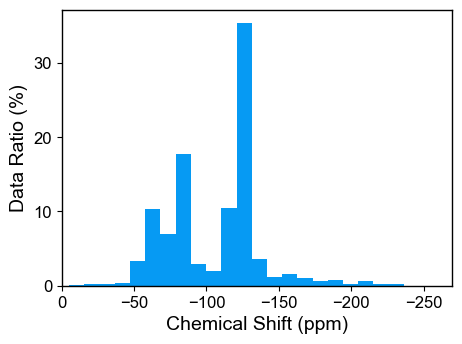

In [26]:
#
# Show the chemical shifts of fluorinated compounds in our dataset
#

# Single fluorine chemical shifts, which encompass vinylic, aryl, and saturated aliphatic fluorine substituents
# From literature the typical chemical shifts range for CF, CF2, and CF3 groups are:
# CF_range = [-70, -238]
# CF2_range = [-80, -130]
# CF3_range = [-52, -87]

# My dataset shows the following ranges:
CF_range = [-63, -232]
CF2_range = [-61, -159]
CF3_range = [-52, -87]

cm = 1 / 2.54  # centimeters in inches
# Create the figure and axes with specified size
plt.rcParams['font.family'] = 'Arial'
fig, ax = plt.subplots(figsize=(12 * cm, 9 * cm))  # 8 cm x 8 cm

color1 = "C2"
color2 = "C4"
color3 = "C9"

# Plot the typical chemical shifts range for CF, CF2, and CF3 groups
# ax.fill_betweenx(y=[0, 1200], x1=CF_range[0], x2=CF_range[1], color=color1, alpha=0.1)
# ax.fill_betweenx(y=[0, 1120], x1=CF2_range[0], x2=CF2_range[1], color=color2, alpha=0.1)
# ax.fill_betweenx(y=[0, 1040], x1=CF3_range[0], x2=CF3_range[1], color=color3, alpha=0.1)

# ax.hlines(y=1200, xmin=CF_range[1], xmax=CF_range[0], color=color1, linestyle='-', linewidth=2)
# ax.hlines(y=1120, xmin=CF2_range[1], xmax=CF2_range[0], color=color2, linestyle='-', linewidth=2)
# ax.hlines(y=1040, xmin=CF3_range[1], xmax=CF3_range[0], color=color3, linestyle='-', linewidth=2)

# ax.text((CF_range[0] + CF_range[1]) / 2, 1200 + 12, 'CF', color=color1, ha='center', fontweight = 'bold')
# ax.text((CF2_range[0] + CF2_range[1]) / 2, 1120 + 12, 'CF$_2$', color=color2, ha='center', fontweight = 'bold')
# ax.text((CF3_range[0] + CF3_range[1]) / 2, 1040 + 12, 'CF$_3$', color=color3, ha='center', fontweight = 'bold')


# Plot the histogram
counts, edges, bars = ax.hist(
    all_fluorinated_compounds_temp["NMR_Peaks"], bins=25, color="#069AF3"
)

# Set border (edge) line width
ax.spines["top"].set_linewidth(1)  # Top border
ax.spines["right"].set_linewidth(1)  # Right border
ax.spines["bottom"].set_linewidth(1)  # Bottom border
ax.spines["left"].set_linewidth(1)  # Left border

# Set axis titles and tick label font sizes
ax.set_xlabel("Chemical Shift (ppm)", fontsize=14)  # Replace with your label
ax.set_ylabel("Data Ratio (%)", fontsize=14)  # Replace with your label
ax.tick_params(axis="x", labelsize=12)  # X-axis numbers font size
ax.tick_params(axis="y", labelsize=12)  # Y-axis numbers font size

y_ticks_label = list(map(lambda x: x * 3497, [0, 0.1, 0.2, 0.3]))
ax.set_yticks(y_ticks_label)
y_vals = ax.get_yticks()
ax.set_yticklabels([f"{100*y/3497:.0f}" for y in y_vals])

ax.set_xticks([0, -50, -100, -150, -200, -250])
ax.set_ylim([0, 1300])
ax.set_xlim([0, -270])

# Show the plot
plt.tight_layout()
plt.show()

In [16]:
#
# Get the molecular weight and number of C atoms in the whole dataset
#

# This function uses RDKit to create a molecule object from the SMILES string
# and then calculates the molecular weight.
def get_MW_from_SMILES(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        return Chem.rdMolDescriptors.CalcExactMolWt(mol)
    else:
        return None

# Function to count the number of carbon atoms in a molecule from its SMILES representation
def get_num_C_atoms_from_SMILES(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        return len(mol.GetSubstructMatches(Chem.MolFromSmarts("C")))
    else:
        return None
    
# Function to return the list of elements in the molecule
def get_elements_from_SMILES(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        return [atom.GetSymbol() for atom in mol.GetAtoms()]
    else:
        return None

All_fluorinated_compounds['MW'] = All_fluorinated_compounds['SMILES'].apply(get_MW_from_SMILES)
All_fluorinated_compounds['num_C_atoms'] = All_fluorinated_compounds['SMILES'].apply(get_num_C_atoms_from_SMILES)
All_fluorinated_compounds[['MW', 'num_C_atoms']].describe()

,MW,num_C_atoms
count,647.000000,647.000000
mean,221.730041,4.769706
std,144.499611,3.428772
min,34.021878,0.000000
25%,128.026135,2.000000
50%,176.044900,4.000000
75%,264.980037,6.000000
max,1189.956781,24.000000


In [17]:
#
# Get the elements involved in the whole dataset
#
All_fluorinated_compounds['elements'] = All_fluorinated_compounds['SMILES'].apply(get_elements_from_SMILES)
elements = All_fluorinated_compounds['elements'].explode().unique()
elements

array(['O', 'C', 'F', 'N', 'S', 'I', 'Cl', 'P', 'Si', 'Br'], dtype=object)

In [18]:
#
# Create the supporting information for the paper
#

# Generate a PDF file with the images of the fluorinated compounds
import os
from PIL import Image
from reportlab.pdfgen import canvas
from reportlab.lib.pagesizes import A4
import math
from reportlab.pdfbase import pdfmetrics
from reportlab.pdfbase.ttfonts import TTFont

def create_pdf_from_images(image_folder, output_pdf_path, images_per_page=16):
    """
    Create a PDF file from PNG images in the specified folder.
    Each page will contain up to 10 images arranged in a grid.
    Each image will have its filename displayed underneath.
    
    Args:
        image_folder (str): Path to the folder containing PNG images
        output_pdf_path (str): Path to save the output PDF
        images_per_page (int): Number of images per page
    """
    # Get list of PNG files
    png_files = [f for f in os.listdir(image_folder) if f.lower().endswith('.png')]
    png_files.sort()  # Sort files alphabetically
    
    # Set up the PDF with A4 size
    c = canvas.Canvas(output_pdf_path, pagesize=A4)
    width, height = A4  # Width and height of A4 page in points (1/72 inch)
    
    # Register default font (optional, you can use other fonts)
    try:
        pdfmetrics.registerFont(TTFont('DejaVuSans', 'DejaVuSans.ttf'))
        font_name = 'DejaVuSans'
    except:
        font_name = 'Helvetica'  # Fallback to built-in font
    
    # Calculate layout
    # Assuming a 2x5 grid (2 columns, 5 rows)
    cols = 2
    rows = math.ceil(images_per_page / cols)
    
    # Calculate margins and image size
    margin = 50  # points
    img_width = (width - 2 * margin) / cols
    img_height = ((height - 2 * margin) / rows) * 0.9  # Reserve 10% for the filename text
    text_height = ((height - 2 * margin) / rows) * 0.1
    
    # Process images
    for i, png_file in enumerate(png_files):
        # Calculate position in the grid
        page_index = i % images_per_page
        row = page_index // cols
        col = page_index % cols
        
        # Calculate position on the page
        x = margin + col * img_width
        y = height - margin - row * (img_height + text_height) - img_height  # PDF coordinate system starts from bottom
        
        # Open image and calculate scaling
        img_path = os.path.join(image_folder, png_file)
        img = Image.open(img_path)
        img_aspect = img.width / img.height
        
        # Adjust dimensions to maintain aspect ratio within allocated space
        if img_width / img_height > img_aspect:
            # Width is the limiting factor
            draw_width = img_height * img_aspect
            draw_height = img_height
            x_offset = (img_width - draw_width) / 2
            y_offset = 0
        else:
            # Height is the limiting factor
            draw_width = img_width
            draw_height = img_width / img_aspect
            x_offset = 0
            y_offset = (img_height - draw_height) / 2
        
        # Draw the image
        c.drawImage(img_path, x + x_offset, y + y_offset, width=draw_width, height=draw_height)
        
        # Add the filename below the image
        c.setFont(font_name, 8)  # Set font and size
        text_width = c.stringWidth(png_file, font_name, 8)
        text_x = x + (img_width - text_width) / 2  # Center the text
        text_y = y - text_height * 0.7  # Position text below image
        c.drawString(text_x, text_y, f'Code: {os.path.splitext(png_file)[0]}')
        
        # If this is the last image on the page or the last image overall, move to next page
        if (page_index == images_per_page - 1) or (i == len(png_files) - 1):
            c.showPage()
    
    # Save the PDF
    c.save()
    print(f"PDF created successfully: {output_pdf_path}")
    print(f"Total images: {len(png_files)}")
    print(f"Total pages: {math.ceil(len(png_files) / images_per_page)}")


image_folder = os.path.join("..", "dataset", "pictures")
output_pdf = "output.pdf"

if os.path.exists(output_pdf):
    print(f"Output PDF '{output_pdf}' already exists.")
else:
    create_pdf_from_images(image_folder, output_pdf)

Output PDF 'output.pdf' already exists.


# IV. 3D feature set <a class="anchor" id="4"></a>
Obtain Atomic Descriptors from Neighboring Atoms in 3D Space 

**Value range for each atomic descriptors in our dataset**

In [19]:
# All fluorinated compounds
all_fluorinated_compounds_w_Desc = atomic_features_3D.Combine_descriptors(
    All_fluorinated_compounds, num_neighbors=5, with_additional_info=False
)
all_fluorinated_compounds_w_Desc

descriptor_list = [
    "AtomDegreeDescriptor",
    "AtomHybridizationDescriptor",
    "AtomHybridizationVSEPRDescriptor",
    "AtomValenceDescriptor",
    "BondsToAtomDescriptor",
    "CovalentRadiusDescriptor",
    "DistanceToAtomDescriptor",
    "EffectiveAtomPolarizabilityDescriptor",
    "IPAtomicHOSEDescriptor",
    "InductiveAtomicHardnessDescriptor",
    "InductiveAtomicSoftnessDescriptor",
    "PartialPiChargeDescriptor",
    "PartialSigmaChargeDescriptor",
    "PartialTChargeMMFF94Descriptor",
    "PartialTChargePEOEDescriptor",
    "PeriodicTablePositionDescriptor",
    "PiElectronegativityDescriptor",
]
for descriptor in descriptor_list:
    AtomDescriptor = all_fluorinated_compounds_w_Desc[
        [col for col in all_fluorinated_compounds_w_Desc.columns if descriptor in col]
    ]
    print(
        f"Value range of  [{descriptor}] in our dataset is {AtomDescriptor.min().min()} - {AtomDescriptor.max().max()}; "
    )

Value range of  [AtomDegreeDescriptor] in our dataset is 0.0 - 4.0; 
Value range of  [AtomHybridizationDescriptor] in our dataset is 0.0 - 4.0; 
Value range of  [AtomHybridizationVSEPRDescriptor] in our dataset is 0.0 - 4.0; 
Value range of  [AtomValenceDescriptor] in our dataset is 1.0 - 7.0; 
Value range of  [BondsToAtomDescriptor] in our dataset is 0.0 - 16.0; 
Value range of  [CovalentRadiusDescriptor] in our dataset is 0.72 - 2.03; 
Value range of  [DistanceToAtomDescriptor] in our dataset is 0.0 - 16.157713831170547; 
Value range of  [EffectiveAtomPolarizabilityDescriptor] in our dataset is 1.804 - 74.55199999999996; 
Value range of  [IPAtomicHOSEDescriptor] in our dataset is 0.0 - 13.0; 
Value range of  [InductiveAtomicHardnessDescriptor] in our dataset is 0.1138288354617123 - 4.814551206527448; 
Value range of  [InductiveAtomicSoftnessDescriptor] in our dataset is 0.2077036793469399 - 8.785120184563088; 
Value range of  [PartialPiChargeDescriptor] in our dataset is -4.338243413

# V. 2D feature sets <a class="anchor" id="5"></a>
We decide to use 'atom_mass', 'atom_hybridization', 'atom_isAromatic', 'atom_degree', 'atom_valence', 'atom_explicit_valence', 'atom_isInRing' as atomic features in the 2D feature set.

**Value range for each atomic descriptors in our dataset**

In [20]:
get_2d_descriptors = atomic_features_2D.getAtomicDescriptorsFrom2DNeighbors()
all_fluorinated_compounds_w_2D_feature_set = (
    get_2d_descriptors.getDescriptorsFromDataset(
        All_fluorinated_compounds, num_spheres=5
    )
)
all_fluorinated_compounds_w_2D_feature_set.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,...,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,NMR_Peaks
4_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,15.999,2.0,0.0,1.0,2.0,2.0,0.0,15.999,2.0,0.0,1.0,2.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-122.45
5_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,15.999,2.0,0.0,1.0,2.0,2.0,0.0,15.999,2.0,0.0,1.0,2.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-122.45
7_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-83.4
8_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-83.4
9_COOH_1,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-83.4
4_COOH_2,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,15.999,2.0,0.0,1.0,2.0,2.0,0.0,15.999,2.0,0.0,1.0,2.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.78
5_COOH_2,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,15.999,2.0,0.0,1.0,2.0,2.0,0.0,15.999,2.0,0.0,1.0,2.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.78
7_COOH_2,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,2.0,0.0,3.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,18.998,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-127.39
8_COOH_2,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,18.998,3.0,0.0,1.0,1.0,1.0,0.0,12.011,3.0,0.0,4.0,4.0,4.0,0.0,12.

In [21]:
feature_set = all_fluorinated_compounds_w_2D_feature_set.drop(["NMR_Peaks"], axis=1)

descriptor_list = [
    "mass",
    "hybridization",
    "isAromatic",
    "degree",
    "valence",
    "explicit_valence",
    "isInRing",
]
nums = [1, 2, 3, 4, 5, 6, 0]

for num, descriptor in zip(nums, descriptor_list):
    AtomDescriptor = feature_set[
        [col for col in feature_set.columns if (int(col) + 1) % 7 == num]
    ]
    print(
        f"Value range of  [{descriptor}] in our dataset is {AtomDescriptor.min().min()} - {AtomDescriptor.max().max()}; "
    )

Value range of  [mass] in our dataset is 12.011 - 126.904; 
Value range of  [hybridization] in our dataset is 2.0 - 3.0; 
Value range of  [isAromatic] in our dataset is 0.0 - 1.0; 
Value range of  [degree] in our dataset is 1.0 - 4.0; 
Value range of  [valence] in our dataset is 1.0 - 6.0; 
Value range of  [explicit_valence] in our dataset is 1.0 - 6.0; 
Value range of  [isInRing] in our dataset is 0.0 - 1.0; 


# VI. Train Test Split<a class="anchor" id="6"></a>

Since our goal is to build a machine learning model that can accurately predict the <sup>19</sup>F NMR shifts of PFAS compounds, we split the dataset such that only a portion of the PFAS compounds are included in the test set, while both PFAS and non-PFAS compounds are used for training.

In [102]:
def split_datasets(dataset, test_ratio = 0.15, RANDOM_STATE=1, set_name = 'test', verbose = False):
    """
    Split the dataset into train, validation, and test datasets.
    Only PFAS compounds are included in the test and validation datasets, the left compounds are used for training.
    
    Args:
        dataset: pandas DataFrame containing the dataset with fluorinated compounds.
        test_ratio (float): Ratio of the test dataset relative to the whole dataset.
        RANDOM_STATE (int): Random state for reproducibility.
        set_name: Name of the dataset generated, default is 'validation'.
    Returns:
        tuple: Train and test datasets as pandas DataFrames.
    """
    # Load the dataset
    

    # Transform the column names of the DataFrame to integers where possible and keep them as strings otherwise
    dataset.columns = [
        common.convert_column_name(name) for name in dataset.columns
    ]

    # Split the dataset into PFAS and non-PFAS compounds
    duplicated_pfas = dataset[
        dataset["SMILES"].duplicated()
    ]
    non_duplicated = dataset.drop(duplicated_pfas.index) 
    pfas_df = non_duplicated[
        non_duplicated["IsPFAS(haveCF2)"] == True
    ]
    non_pfas_df = non_duplicated[
        non_duplicated["IsPFAS(haveCF2)"] == False
    ]

    # Decide the size of the train, validation, and test datasets
    test_ratio_pfas = test_ratio * len(dataset) / len(pfas_df)

    # Get test dataset
    train_fluorinated_compounds, test_fluorinated_compounds = train_test_split(
        pfas_df, test_size=test_ratio_pfas, random_state=RANDOM_STATE, shuffle=True
    )

    # Get train dataset
    train_fluorinated_compounds = pd.concat([non_pfas_df, duplicated_pfas, train_fluorinated_compounds])

    # Shuffle datasets
    test_fluorinated_compounds = test_fluorinated_compounds.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)
    train_fluorinated_compounds = train_fluorinated_compounds.sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)
    if verbose:
        print(
            f"Number of fluorinated compounds in the train and {set_name} datasets are {train_fluorinated_compounds.shape[0]} and {test_fluorinated_compounds.shape[0]} respectively."
        )
        ratio_PFAS_in_train = train_fluorinated_compounds['IsPFAS(haveCF2)'].sum() / train_fluorinated_compounds.shape[0]
        ratio_PFAS_in_test = test_fluorinated_compounds['IsPFAS(haveCF2)'].sum() / test_fluorinated_compounds.shape[0]
        print(f"Ratio of PFAS in the train and {set_name} datasets are {ratio_PFAS_in_train:.2f} and {ratio_PFAS_in_test:.2f} respectively.")
    return train_fluorinated_compounds, test_fluorinated_compounds

#
# Get the train, validation, and test datasets
#
data_path = os.path.join("..", "dataset", "Processed_PFAS_19F_NMR_spectra_data.csv")
All_fluorinated_compounds = pd.read_csv(data_path)
train_dataset, test_fluorinated_compounds = split_datasets(All_fluorinated_compounds, RANDOM_STATE=RANDOM_STATE, verbose = True)

Number of fluorinated compounds in the train and test datasets are 549 and 98 respectively.
Ratio of PFAS in the train and test datasets are 0.61 and 1.00 respectively.


The dataset was split into training (85%) and test (15%) sets at the beginning of the study. The test set was held out and used only once for final model evaluation. All model development, including hyperparameter tuning and model selection, was performed using 5-fold cross-validation on the training set only.

# VII. Ridge model with 3D feature set <a class="anchor" id="7"></a>

## 7.1 Spatially Neighboring atoms = n (Step by Step) <a class="anchor" id="7.1"></a>
**Combine fluorinated_compounds data with Descriptors**

In [23]:
# Each F atom in the dataset were extracted as a separate row, then we get the descriptors for each fluorinated atom with 3d atomic descriptors of spatially 3 neighboring atoms
# This will generate a table with the descriptors for each fluorinated atom in the train dataset
# Column 'NMR_Peaks' contains the 19F NMR chemical shifts, which is the target variable for the model training

# Split the train dataset into train and validation datasets. 
train_fluorinated_compounds, vali_fluorinated_compounds = split_datasets(train_dataset, test_ratio = 0.15, RANDOM_STATE=RANDOM_STATE, set_name = 'validation')

# Get the descriptors for each fluorinated atom in the train dataset
train_fluorinated_compounds_w_Desc = atomic_features_3D.Combine_descriptors(
    train_fluorinated_compounds, num_neighbors=3, with_additional_info=True
)
print(f"Shape of the train_fluorinated_compounds_w_Desc: {train_fluorinated_compounds_w_Desc.shape}")
train_fluorinated_compounds_w_Desc.rename_axis("atomCode_fluorinated_compoundsCode", inplace=True)

# Save the table to a csv file
# file_path = os.path.join("..", "artifacts", "temp", f"train_dataset_3D_neighbors3.csv")
# train_fluorinated_compounds_w_Desc.to_csv(file_path, encoding="UTF-8")
train_fluorinated_compounds_w_Desc.head(5)

Shape of the train_fluorinated_compounds_w_Desc: (2357, 82)


,NMR_Peaks,SMILES_self,AtomDegreeDescriptor-aNeg_self,AtomHybridizationDescriptor-aHyb_self,AtomHybridizationVSEPRDescriptor-hybr_self,AtomValenceDescriptor-val_self,BondsToAtomDescriptor-bondsToAtom_self,CovalentRadiusDescriptor-covalentRadius_self,DistanceToAtomDescriptor-distanceToAtom_self,EffectiveAtomPolarizabilityDescriptor-effAtomPol_self,IPAtomicHOSEDescriptor-ipAtomicHOSE_self,InductiveAtomicHardnessDescriptor-indAtomHardnesss_self,InductiveAtomicSoftnessDescriptor-indAtomSoftness_self,PartialPiChargeDescriptor-pepe_self,PartialSigmaChargeDescriptor-partialSigmaCharge_self,PartialTChargeMMFF94Descriptor-partialTCMMFF94_self,PartialTChargePEOEDescriptor-pepeT_self,PeriodicTablePositionDescriptor-periodicTablePosition_self,PiElectronegativityDescriptor-elecPiA_self,level_0_neighbor1,index_neighbor1,SMILES_neighbor1,AtomDegreeDescriptor-aNeg_neighbor1,AtomHybridizationDescriptor-aHyb_neighbor1,AtomHybridizationVSEPRDescriptor-hybr_neighbor1,AtomValenceDescriptor-val_neighbor1,BondsToAtomDescriptor-bondsToAtom_neighbor1,CovalentRadiusDescriptor-covalentRadius_neighbor1,DistanceToAtomDescriptor-distanceToAtom_neighbor1,EffectiveAtomPolarizabilityDescriptor-effAtomPol_neighbor1,IPAtomicHOSEDescriptor-ipAtomicHOSE_neighbor1,InductiveAtomicHardnessDescriptor-indAtomHardnesss_neighbor1,InductiveAtomicSoftnessDescriptor-indAtomSoftness_neighbor1,PartialPiChargeDescriptor-pepe_neighbor1,PartialSigmaChargeDescriptor-partialSigmaCharge_neighbor1,PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor1,PartialTChargePEOEDescriptor-pepeT_neighbor1,PeriodicTablePositionDescriptor-periodicTablePosition_neighbor1,PiElectronegativityDescriptor-elecPiA_neighbor1,level_0_neighbor2,index_neighbor2,SMILES_neighbor2,AtomDegreeDescriptor-aNeg_neighbor2,AtomHybridizationDescriptor-aHyb_neighbor2,AtomHybridizationVSEPRDescriptor-hybr_neighbor2,AtomValenceDescriptor-val_neighbor2,BondsToAtomDescriptor-bondsToAtom_neighbor2,CovalentRadiusDescriptor-covalentRadius_neighbor2,DistanceToAtomDescriptor-distanceToAtom_neighbor2,EffectiveAtomPolarizabilityDescriptor-effAtomPol_neighbor2,IPAtomicHOSEDescriptor-ipAtomicHOSE_neighbor2,InductiveAtomicHardnessDescriptor-indAtomHardnesss_neighbor2,InductiveAtomicSoftnessDescriptor-indAtomSoftness_neighbor2,PartialPiChargeDescriptor-pepe_neighbor2,PartialSigmaChargeDescriptor-partialSigmaCharge_neighbor2,PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor2,PartialTChargePEOEDescriptor-pepeT_neighbor2,PeriodicTablePositionDescriptor-periodicTablePosition_neighbor2,PiElectronegativityDescriptor-elecPiA_neighbor2,level_0_neighbor3,index_neighbor3,SMILES_neighbor3,AtomDegreeDescriptor-aNeg_neighbor3,AtomHybridizationDescriptor-aHyb_neighbor3,AtomHybridizationVSEPRDescriptor-hybr_neighbor3,AtomValenceDescriptor-val_neighbor3,BondsToAtomDescriptor-bondsToAtom_neighbor3,CovalentRadiusDescriptor-covalentRadius_neighbor3,DistanceToAtomDescriptor-distanceToAtom_neighbor3,EffectiveAtomPolarizabilityDescriptor-effAtomPol_neighbor3,IPAtomicHOSEDescriptor-ipAtomicHOSE_neighbor3,InductiveAtomicHardnessDescriptor-indAtomHardnesss_neighbor3,InductiveAtomicSoftnessDescriptor-indAtomSoftness_neighbor3,PartialPiChargeDescriptor-pepe_neighbor3,PartialSigmaChargeDescriptor-partialSigmaCharge_neighbor3,PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor3,PartialTChargePEOEDescriptor-pepeT_neighbor3,PeriodicTablePositionDescriptor-periodicTablePosition_neighbor3,PiElectronegativityDescriptor-elecPiA_neighbor3,SMILES,Compound name,Solvent_used_for_NMR
atomCode_fluorinated_compoundsCode,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3_From_Review_217,-84.5,F,1.0,3.0,3.0,7.0,2.0,0.72,2.340636,3.152500,0.0,2.367307,0.422421,0.0,-0.204886,-0.317,-0.204886,2.0,4.538718,0,1,C,4.0,3.0,3.0,4.0,1.0,0.77,1.512872,4.945,0.0,1.295893,0.771669,0.0,0.263886,0.634,0.263886,2.0,0.0,1,4,F,1.0,3.0,3.0,7.0,2.0,0.72,2.340622,3.1525,0.0,2.367261,0.422429,0.0,-0.204886,-0.317,-0.204886,2.0,4.538718,2.0,0,C,1.0,3.

### Data Processing<a class="anchor" id="2.2.2"></a>

We defined several data preprocessing functions in the utils.py file. These functions were used to preprocess the data before applying the Ridge and FFNN models.  

The preprocessing steps include:  

* Dropping columns with constant values.

* Dropping columns with a high proportion of NaN values.

* Dropping rows that contain NaN values in the NMR_Peaks column.

* Converting all columns in the DataFrame to numeric types where possible, and dropping the remaining categorical columns.


In [24]:
dataset = train_fluorinated_compounds_w_Desc.copy()

dataset = common.drop_constant_col(dataset)
print(
    f"Shape of the training dataset after dropping out columns with constant values: {dataset.shape}"
)

dataset_dropNaN = common.drop_high_ratio_NaN_cols(dataset)
print(
    f"\nShape of the training dataset after dropping out columns with more than 80% values being NaN: {dataset_dropNaN.shape}"
)

# drop rows with NaN values in the 'NMR_Peaks' column
dataset_dropNaN = dataset_dropNaN.dropna(subset=["NMR_Peaks"])
print(f"\n-----Shape of the dataset after drop rows with NaN NMR peak values------")
print(dataset_dropNaN.shape)

# Convert all columns in df to numeric where possible, keeping non-numeric values unchanged
dataset_dropNaN = dataset_dropNaN.apply(pd.to_numeric, errors="ignore")

print(common.count_non_numeric_values(dataset_dropNaN))

# Drop categorical columns
dataset_dropCat = common.drop_categorical_columns(dataset_dropNaN)

dataset_dropCat, imputer = common.fill_NaN(dataset_dropCat)

file_path = os.path.join("..", "artifacts", "models", "imputer_neighbor3_RidgeCV.pkl")
with open(file_path, "wb") as file:
    pickle.dump(imputer, file)

columns = dataset_dropCat.columns.tolist()
file_path = os.path.join(
    "..", "artifacts", "models", "column_names_neighbor3_RidgeCV.pkl"
)
with open(file_path, "wb") as f:
    pickle.dump(columns, f)

print(f"\n-----Shape of the dataset after pre-processing------")
print(dataset_dropCat.shape)

Shape of the training dataset after dropping out columns with constant values: (2357, 70)

Shape of the training dataset after dropping out columns with more than 80% values being NaN: (2357, 70)

-----Shape of the dataset after drop rows with NaN NMR peak values------
(2288, 70)
Columns with Non-Numeric Values:
SMILES_neighbor1        2288
SMILES_neighbor2        2288
SMILES_neighbor3        2287
SMILES                  2288
Compound name           2288
Solvent_used_for_NMR    2288
dtype: int64
None

-----Shape of the dataset after pre-processing------
(2288, 64)


We examined the fluorinated compounds with NaN values in the 'NMR_Peaks' column. All of these instances were from articles that report the NMR shift for only some of the F atoms in a fluorinated compound.

We remove the rows with NaN values in the 'NMR_Peaks' column.

### X_train and y_train <a class="anchor" id="2.2.4"></a>

In [25]:
y_train = dataset_dropCat["NMR_Peaks"]
X_train = dataset_dropCat.drop(["NMR_Peaks"], axis=1)

### Scaler <a class="anchor" id="2.2.5"></a>

In [26]:
# Scale the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Save the scaler to a file for later use
file_path = os.path.join(
    "..", "artifacts", "models", f"scaler_3d_neighbor3_RidgeCV.pkl"
)
with open(file_path, "wb") as file:
    pickle.dump(scaler, file)

In [27]:
X_train_scaled = pd.DataFrame(X_train_scaled)
X_train_scaled.columns = X_train.columns
X_train_scaled.index = X_train.index

X_train_scaled

,BondsToAtomDescriptor-bondsToAtom_self,DistanceToAtomDescriptor-distanceToAtom_self,EffectiveAtomPolarizabilityDescriptor-effAtomPol_self,IPAtomicHOSEDescriptor-ipAtomicHOSE_self,InductiveAtomicHardnessDescriptor-indAtomHardnesss_self,InductiveAtomicSoftnessDescriptor-indAtomSoftness_self,PartialPiChargeDescriptor-pepe_self,PartialSigmaChargeDescriptor-partialSigmaCharge_self,PartialTChargeMMFF94Descriptor-partialTCMMFF94_self,PartialTChargePEOEDescriptor-pepeT_self,PiElectronegativityDescriptor-elecPiA_self,index_neighbor1,AtomDegreeDescriptor-aNeg_neighbor1,AtomHybridizationDescriptor-aHyb_neighbor1,AtomHybridizationVSEPRDescriptor-hybr_neighbor1,BondsToAtomDescriptor-bondsToAtom_neighbor1,CovalentRadiusDescriptor-covalentRadius_neighbor1,DistanceToAtomDescriptor-distanceToAtom_neighbor1,EffectiveAtomPolarizabilityDescriptor-effAtomPol_neighbor1,InductiveAtomicHardnessDescriptor-indAtomHardnesss_neighbor1,InductiveAtomicSoftnessDescriptor-indAtomSoftness_neighbor1,PartialPiChargeDescriptor-pepe_neighbor1,PartialSigmaChargeDescriptor-partialSigmaCharge_neighbor1,PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor1,PartialTChargePEOEDescriptor-pepeT_neighbor1,PeriodicTablePositionDescriptor-periodicTablePosition_neighbor1,PiElectronegativityDescriptor-elecPiA_neighbor1,index_neighbor2,AtomDegreeDescriptor-aNeg_neighbor2,AtomHybridizationDescriptor-aHyb_neighbor2,AtomHybridizationVSEPRDescriptor-hybr_neighbor2,AtomValenceDescriptor-val_neighbor2,BondsToAtomDescriptor-bondsToAtom_neighbor2,CovalentRadiusDescriptor-covalentRadius_neighbor2,DistanceToAtomDescriptor-distanceToAtom_neighbor2,EffectiveAtomPolarizabilityDescriptor-effAtomPol_neighbor2,IPAtomicHOSEDescriptor-ipAtomicHOSE_neighbor2,InductiveAtomicHardnessDescriptor-indAtomHardnesss_neighbor2,InductiveAtomicSoftnessDescriptor-indAtomSoftness_neighbor2,PartialPiChargeDescriptor-pepe_neighbor2,PartialSigmaChargeDescriptor-partialSigmaCharge_neighbor2,PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor2,PartialTChargePEOEDescriptor-pepeT_neighbor2,PeriodicTablePositionDescriptor-periodicTablePosition_neighbor2,PiElectronegativityDescriptor-elecPiA_neighbor2,index_neighbor3,AtomDegreeDescriptor-aNeg_neighbor3,AtomHybridizationDescriptor-aHyb_neighbor3,AtomHybridizationVSEPRDescriptor-hybr_neighbor3,AtomValenceDescriptor-val_neighbor3,BondsToAtomDescriptor-bondsToAtom_neighbor3,CovalentRadiusDescriptor-covalentRadius_neighbor3,DistanceToAtomDescriptor-distanceToAtom_neighbor3,EffectiveAtomPolarizabilityDescriptor-effAtomPol_neighbor3,IPAtomicHOSEDescriptor-ipAtomicHOSE_neighbor3,InductiveAtomicHardnessDescriptor-indAtomHardnesss_neighbor3,InductiveAtomicSoftnessDescriptor-indAtomSoftness_neighbor3,PartialPiChargeDescriptor-pepe_neighbor3,PartialSigmaChargeDescriptor-partialSigmaCharge_neighbor3,PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor3,PartialTChargePEOEDescriptor-pepeT_neighbor3,PeriodicTablePositionDescriptor-periodicTablePosition_neighbor3,PiElectronegativityDescriptor-elecPiA_neighbor3
atomCode_fluorinated_compoundsCode,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3_From_Review_217,-1.111483,-0.977466,-1.017328,-0.078187,1.961693,-1.540133,-0.174698,-1.212283,-0.390747,-0.392483,-1.211938,-0.992209,0.449702,0.371898,0.371898,-1.224073,-0.020911,-1.184199,-0.999504,1.549931,-1.577635,0.141049,-1.303634,-0.156944,-0.752817,-0.020911,-0.371276,-0.795748,-0.399553,0.368417,0.368417,0.446506,-1.070930,-0.201459,-0.971795,-0.402090,-0.078187,2.697337,-1.169814,0.018988,-0.597233,-0.437066,-0.186844,-0.071524,-0.378185,-1.152032,-0.961094,0.350697,0.350697,-0.957140,-1.594020,0.294852,-1.729256,-0.320759,-0.072365,2.927325,-1.442467,-0.000583,0.013750,-0.175012,0.007977,-0.114566,-1.165041
4_From_Review_217,-1.111483,-0.977471,-1.017328,-0.078187,1.961599,-1.540098,-0.174698,-1.212283,-0.390747,-0.392483,-1.211938,-0.992209,0.449702,0.371898,0.371898,-1.224073,-0.020911,-1.184199,-0.999504,1.549931,-1.577635,0.141049,-1.303634,-0.156944,

###  Build and Train  RidgeCV model <a class="anchor" id="2.2.6"></a>

In [28]:
# Define a custom RMSE scoring function
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))


# Use the custom RMSE function with make_scorer
scoring = {
    "mae": "neg_mean_absolute_error",
    "rmse": make_scorer(rmse),  # Custom RMSE scorer
    "r2": "r2",
}

param_grid = {"alpha": [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]}

# Create the Ridge model
ridge = Ridge(fit_intercept=True)

# Initialize GridSearchCV with multiple scoring metrics
grid_search = GridSearchCV(
    estimator=ridge, param_grid=param_grid, cv = 5, scoring=scoring, refit="mae"
)
grid_search.fit(X_train_scaled, y_train)

# Retrieve the best alpha and results for each metric
best_alpha = grid_search.best_params_["alpha"]
best_scores = grid_search.cv_results_

# Output the best alpha and performance on chosen metric
print(f"Best Alpha: {best_alpha}")

# Print out scoring metrics for the best model
print(f'MAE Score: {np.mean(-best_scores["mean_test_mae"]):.2f} ± {np.std(-best_scores["std_test_mae"]):.2f}')
print(f'Root Mean Squared Error (RMSE): {np.mean(best_scores["mean_test_rmse"]):.2f} ± {np.std(best_scores["std_test_rmse"]):.2f}')
print(f'R^2 Score: {np.mean(best_scores["mean_test_r2"]):.2f} ± {np.std(best_scores["std_test_r2"]):.2f}')

Best Alpha: 9
MAE Score: 5.71 ± 0.15
Root Mean Squared Error (RMSE): 11.82 ± 1.69
R^2 Score: 0.86 ± 0.05


In [29]:
best_model = grid_search.best_estimator_
file_path = os.path.join("..", "artifacts", "models", f"RidgeCV_model_neighbor3.pkl")
with open(file_path, "wb") as file:
    pickle.dump(best_model, file)

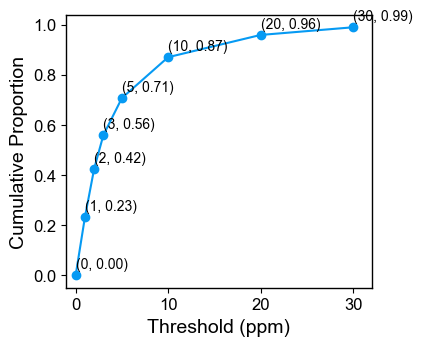

R2 = 0.95
RMSE = 7.95
MAE = 4.769379934927344


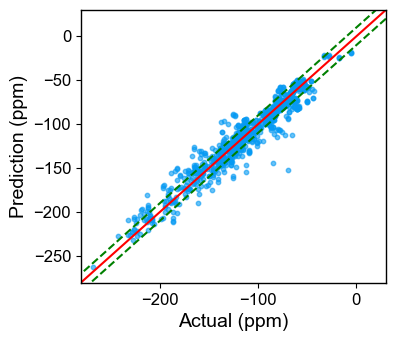

(4.769379934927344, 7.9526765250398475, 0.9462422298639729)

In [30]:
results_table = common.get_results_table(best_model, X_train_scaled, y_train)
common.plot_prediction_performance(results_table)
common.show_results_scatter(results_table)

## 7.2 Streamline the data processing and model training process

Next, we combined all the above preprocessing steps, data transformation, and Ridge model training into a single module (class Define_and_Train_Ridge_Model) to streamline the entire workflow for model development.

In [180]:
class Define_and_Train_Ridge_Model():
    def __init__(self, num_neighbors, fluorinated_compounds):
        self.num_neighbors = num_neighbors
        self.fluorinated_compounds = fluorinated_compounds
        fluorinated_compounds_w_Desc = self.step1_generated_dataset()
        dataset_dropCat = self.step2_data_preprocessing(fluorinated_compounds_w_Desc)
        self.X_scaled, self.y = self.step3_get_X_and_y(dataset_dropCat)
        return 

    def step1_generated_dataset(self, verbose = False):
        fluorinated_compounds_w_Desc = atomic_features_3D.Combine_descriptors(
            self.fluorinated_compounds, num_neighbors = self.num_neighbors, with_additional_info=True
            )
        if verbose:
            print(
                f"Shape of the train_fluorinated_compounds_w_Desc: {fluorinated_compounds_w_Desc.shape}"
            )
        fluorinated_compounds_w_Desc.rename_axis("atomCode_fluorinated_compoundsCode", inplace=True)

        # Save the table to a csv file
        file_path = os.path.join("..", "artifacts", "temp", f"train_dataset_3D_neighbors{self.num_neighbors}.csv")
        fluorinated_compounds_w_Desc.to_csv(file_path, encoding="utf-8")
        return fluorinated_compounds_w_Desc
    
    def step2_data_preprocessing(self, dataset, verbose = False):
        dataset = common.drop_constant_col(dataset)
        if verbose:
            print(
                f"Shape of the training dataset after dropping out columns with constant values: {dataset.shape}"
            )

        dataset_dropNaN = common.drop_high_ratio_NaN_cols(dataset)
        if verbose:
            print(
                f"Shape of the training dataset after dropping out columns with more than 80% values being NaN: {dataset_dropNaN.shape}"
            )

        # drop rows with NaN values in the 'NMR_Peaks' column
        dataset_dropNaN = dataset_dropNaN.dropna(subset=["NMR_Peaks"])
        if verbose:
            print(f"-----Shape of the dataset after drop rows with NaN NMR peak values------")
            print(dataset_dropNaN.shape)

        # Convert all columns in df to numeric where possible, keeping non-numeric values unchanged
        dataset_dropNaN = dataset_dropNaN.apply(pd.to_numeric, errors="ignore")
        if verbose:
            print(common.count_non_numeric_values(dataset_dropNaN))

        # Drop categorical columns
        dataset_dropCat = common.drop_categorical_columns(dataset_dropNaN)
        dataset_dropCat, imputer = common.fill_NaN(dataset_dropCat)

        # Save the imputer to a file
        file_path = os.path.join("..", "artifacts", "models", f"imputer_neighbor{self.num_neighbors}_RidgeCV.pkl")
        with open(file_path, "wb") as file:
            pickle.dump(imputer, file)
        if verbose:
            print(f'\n>>>> Imputer saved to {file_path}')

        # Save the column names to a file
        columns = dataset_dropCat.columns.tolist()
        file_path = os.path.join(
            "..", "artifacts", "models", f"column_names_neighbor{self.num_neighbors}_RidgeCV.pkl"
        )
        with open(file_path, "wb") as f:
            pickle.dump(columns, f)
        if verbose: 
            print(f'>>>> Column names saved to {file_path}')
            # Print the shape of the dataset after pre-processing
            print(f"\n-----Shape of the dataset after pre-processing------")
            print(dataset_dropCat.shape)

        return dataset_dropCat
    
    def step3_get_X_and_y(self, dataset, verbose = False):
        y = dataset["NMR_Peaks"]
        X = dataset.drop(["NMR_Peaks"], axis=1)

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Save the scaler to a file
        file_path = os.path.join(
            "..", "artifacts", "models", f"scaler_3d_neighbor{self.num_neighbors}_RidgeCV.pkl"
        )
        with open(file_path, "wb") as file:
            pickle.dump(scaler, file)
        if verbose: print(f'\n>>>> Scaler saved to {file_path}')

        X_scaled = pd.DataFrame(X_scaled)
        X_scaled.columns = X.columns
        X_scaled.index = X.index
        return X_scaled, y
       
    def step4_optimize_alpha(self, X_scaled, y, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]):
         # Define a custom RMSE scoring function
        def rmse(y_true, y_pred):
            return np.sqrt(mean_squared_error(y_true, y_pred))

        # Use the custom RMSE function with make_scorer
        scoring = {
            "mae": "neg_mean_absolute_error",
            "rmse": make_scorer(rmse),  # Custom RMSE scorer
            "r2": "r2",
        }

        # Create the Ridge model
        ridge = Ridge(fit_intercept=True)
        param_grid = {"alpha": alpha_list}

        # Initialize GridSearchCV with multiple scoring metrics
        grid_search = GridSearchCV(
            estimator=ridge, param_grid=param_grid, cv=5, scoring=scoring, refit="mae"
        )
        grid_search.fit(X_scaled, y)

        # Retrieve the best alpha and results for each metric
        best_alpha = grid_search.best_params_["alpha"]
        best_scores = grid_search.cv_results_

        # Output the best alpha and performance on chosen metric
        print(f'---------Searched alphas: {alpha_list}---------')
        print(f"Best Alpha: {best_alpha}")

        # Print out scoring metrics for the best model
        print(f'\n-----Scoring metrics for the best model on training dataset------')
        print(f'MAE Score: {np.mean(-best_scores["mean_test_mae"]):.2f} ± {np.std(-best_scores["std_test_mae"]):.2f}')
        print(f'Root Mean Squared Error (RMSE): {np.mean(best_scores["mean_test_rmse"]):.2f} ± {np.std(best_scores["std_test_rmse"]):.2f}')
        print(f'R^2 Score: {np.mean(best_scores["mean_test_r2"]):.2f} ± {np.std(best_scores["std_test_r2"]):.2f}')
        return grid_search, best_alpha
    
    def step5_save_model(self, grid_search, verbose = False):
        best_model = grid_search.best_estimator_

        file_path = os.path.join("..", "artifacts", "models", f"RidgeCV_model_neighbor{self.num_neighbors}.pkl")
        with open(file_path, "wb") as file:
            pickle.dump(best_model, file)
        if verbose: print(f"\n>>>> Best model saved to {file_path}")
        return best_model

    def step6_plot_results(self, best_model, X_scaled, y):
        results_table = common.get_results_table(best_model, X_scaled, y)
        common.plot_prediction_performance(results_table)
        common.show_results_scatter(results_table)

In [181]:
#
# Define function to apply the trained model on the validation dataset and return the results table
#
def test_3D_Ridge_model_performance(num_neighbors, dataset, show_plot = True):
    base_file_path = os.path.join("..", "artifacts", "models")
    restuls_table, (mae, rmse, r2) = common.testRidgeCVPerformance(
        dataset=dataset,
        num_neighbors=num_neighbors,
        RidgeCVmodel_path=os.path.join(base_file_path, f"RidgeCV_model_neighbor{num_neighbors}.pkl"),
        scaler_path=os.path.join(base_file_path, f"scaler_3d_neighbor{num_neighbors}_RidgeCV.pkl"),
        imputer_path=os.path.join(base_file_path, f"imputer_neighbor{num_neighbors}_RidgeCV.pkl"),
        columns_path=os.path.join(base_file_path, f"column_names_neighbor{num_neighbors}_RidgeCV.pkl"),
        show_plot = show_plot
    )
    return restuls_table, (mae, rmse, r2)

In [182]:
def train_and_validate_ridge_3d_model(num_neighbors, train_dataset, random_seeds=[1, 2, 3, 4, 5], alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], verbose = False):
    vali_results = {}
    train_results = {}
    vali_results_tables = pd.DataFrame()
    train_results_tables = pd.DataFrame()
    for random_seed in random_seeds:
        print(f"\n\n>>>>>Random seed: {random_seed}<<<<<\n")
        train_fluorinated_compounds, vali_fluorinated_compounds = split_datasets(
            train_dataset, RANDOM_STATE=random_seed
        )
        # Data processing and get X, y
        Ridge_3D = Define_and_Train_Ridge_Model(num_neighbors=num_neighbors, fluorinated_compounds = train_fluorinated_compounds)

        # Grid search for the best alpha value
        grid_search, best_alpha = Ridge_3D.step4_optimize_alpha(Ridge_3D.X_scaled, Ridge_3D.y, alpha_list = alpha_list)
 
        # Save the best model and plot the results
        _ = Ridge_3D.step5_save_model(grid_search, verbose = verbose)

        # Apply the trained model on the validation dataset and return the results table
        train_results_table, (train_mae, train_rmse, train_r2) = test_3D_Ridge_model_performance(num_neighbors=num_neighbors, dataset=train_fluorinated_compounds, show_plot = False)
        vali_results_table, (mae, rmse, r2) = test_3D_Ridge_model_performance(num_neighbors=num_neighbors, dataset=vali_fluorinated_compounds, show_plot = False)

        vali_results[f"random_seed_{random_seed}"] = {'mae': mae, 'rmse': rmse, 'r2': r2}
        train_results[f"random_seed_{random_seed}"] = {'mae': train_mae, 'rmse': train_rmse, 'r2': train_r2}

        vali_results_tables = pd.concat([vali_results_tables, vali_results_table], axis=0)
        # print(f'>>>>>>Shape of the validation results table: {vali_results_tables.shape}')
        train_results_tables = pd.concat([train_results_tables, train_results_table], axis=0)
        # print(f'>>>>>>Shape of the training results table: {train_results_tables.shape}')

    vali_results_df = pd.DataFrame(vali_results).T
    train_results_df = pd.DataFrame(train_results).T
    print('--------Training results DataFrame--------')
    display(train_results_df)
    print('--------Validation results DataFrame--------')
    display(vali_results_df)
    return train_results_tables, train_results_df, vali_results_tables, vali_results_df, best_alpha

## 7.3 Spatially Neighboring atoms = 3 <a class="anchor" id="7.3"></a>

In [183]:
_, _, _, _, best_alpha = train_and_validate_ridge_3d_model(num_neighbors = 3, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 6.17 ± 0.18
Root Mean Squared Error (RMSE): 14.71 ± 2.04
R^2 Score: 0.75 ± 0.10
>>>>>>Shape of the validation results table: (663, 3)
>>>>>>Shape of the training results table: (2217, 3)
--------Training results DataFrame--------


,mae,rmse,r2
random_seed_42,5.083283,8.44457,0.938614


--------Validation results DataFrame--------


,mae,rmse,r2
random_seed_42,3.543399,5.994973,0.951229


In [184]:
train_results_tables, train_results_df, vali_results_tables_n3, vali_results_df_n3, _ = train_and_validate_ridge_3d_model(num_neighbors = 3, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [10]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 6.10 ± 0.00
Root Mean Squared Error (RMSE): 14.59 ± 0.00
R^2 Score: 0.76 ± 0.00
>>>>>>Shape of the validation results table: (663, 3)
>>>>>>Shape of the training results table: (2217, 3)


>>>>>Random seed: 30<<<<<

---------Searched alphas: [10]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.88 ± 0.00
Root Mean Squared Error (RMSE): 12.96 ± 0.00
R^2 Score: 0.83 ± 0.00
>>>>>>Shape of the validation results table: (1284, 3)
>>>>>>Shape of the training results table: (4476, 3)


>>>>>Random seed: 512<<<<<

---------Searched alphas: [10]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.97 ± 0.00
Root Mean Squared Error (RMSE): 13.10 ± 0.00
R^2 Score: 0.80 ± 0.00
>>>>>>Shape of the validation results table: (1894, 3)
>>>

,mae,rmse,r2
random_seed_42,5.083283,8.444570,0.938614
random_seed_30,5.014160,8.447195,0.937416
random_seed_512,5.055310,8.437122,0.938965
random_seed_76,4.770230,8.147529,0.941127
random_seed_61,5.034442,8.238376,0.943167


--------Validation results DataFrame--------


,mae,rmse,r2
random_seed_42,3.543399,5.994973,0.951229
random_seed_30,3.843473,5.725448,0.958420
random_seed_512,3.461522,5.636073,0.955170
random_seed_76,4.097381,6.908662,0.937092
random_seed_61,4.031669,7.710752,0.916854



>>>>> Model information: Ridge 3D model with 3 neighbors, alpha = 10 <<<<<

Performance of the model on training dataset
mae: 4.99 ± 0.13
rmse: 8.34 ± 0.14
r2: 0.94 ± 0.00

Performance of model on validation dataset
mae: 3.80 ± 0.28
rmse: 6.40 ± 0.89
r2: 0.94 ± 0.02

--------Training results plot--------


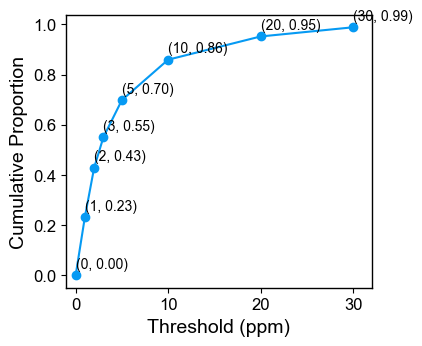


--------Validation results plot--------


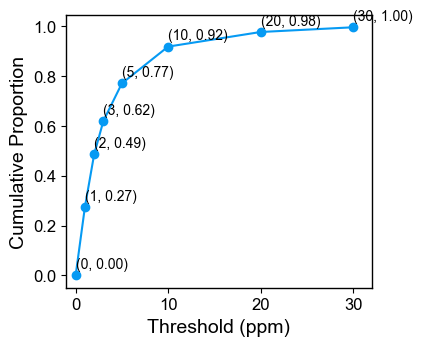


--------Training results scatter plot--------
R2 = 0.94
RMSE = 8.34
MAE = 4.989454796925668


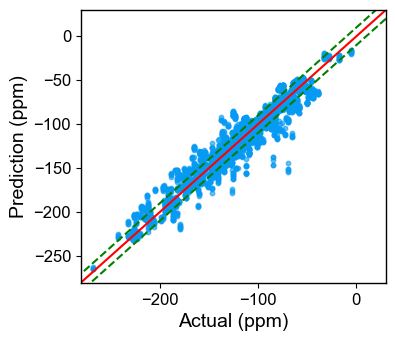


--------Validation results scatter plot--------
R2 = 0.94
RMSE = 6.48
MAE = 3.794335568570912


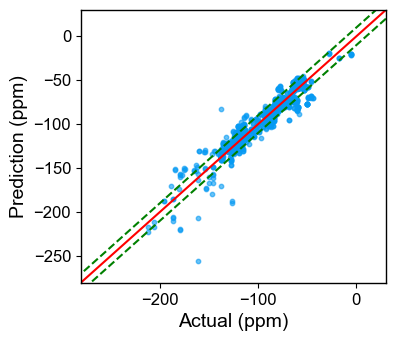

In [114]:
def show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables, vali_results_df, model_info = ''):
    """
    Show the performance of the model on both training and validation datasets.
    This function prints the mean and standard deviation of the performance metrics (MAE, RMSE, R2) for both datasets,
    plots the prediction performance, and shows the results scatter plots.

    These information help to evaluate the model's performance and generalization ability, identify potential overfitting or underfitting issues.
    
    Args:
        train_results_tables: DataFrame with results of the model on training dataset.
        train_results_df: DataFrame with performance metrics on training dataset.
        vali_results_tables: DataFrame with results of the model on validation dataset.
        vali_results_df: DataFrame with performance metrics on validation dataset.
        model_info: String with information about the model.
    """
    print(f'\n>>>>> Model information: {model_info} <<<<<\n')
    print('Performance of the model on training dataset')
    print(f'mae: {train_results_df["mae"].mean():.2f} ± {train_results_df["mae"].std():.2f}')
    print(f'rmse: {train_results_df["rmse"].mean():.2f} ± {train_results_df["rmse"].std():.2f}')
    print(f'r2: {train_results_df["r2"].mean():.2f} ± {train_results_df["r2"].std():.2f}')

    print('\nPerformance of model on validation dataset')
    print(f'mae: {vali_results_df["mae"].mean():.2f} ± {vali_results_df["mae"].std():.2f}')
    print(f'rmse: {vali_results_df["rmse"].mean():.2f} ± {vali_results_df["rmse"].std():.2f}')
    print(f'r2: {vali_results_df["r2"].mean():.2f} ± {vali_results_df["r2"].std():.2f}')

    print('\n--------Training results plot--------')
    common.plot_prediction_performance(train_results_tables)
    print('\n--------Validation results plot--------')
    common.plot_prediction_performance(vali_results_tables)
    print('\n--------Training results scatter plot--------')
    common.show_results_scatter(train_results_tables)
    print('\n--------Validation results scatter plot--------')
    common.show_results_scatter(vali_results_tables)

show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n3, vali_results_df_n3, 
                                              model_info = 'Ridge 3D model with 3 neighbors, alpha = ' + str(best_alpha))
# Delete large objects to free up memory
del vali_results_tables_n3, vali_results_df_n3, best_alpha, train_results_tables, train_results_df

## 7.3 Spatially Neighboring atoms = 4 <a class="anchor" id="7.3"></a>

In [37]:
_, _, _, _, best_alpha = train_and_validate_ridge_3d_model(num_neighbors = 4, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 7

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.94 ± 0.19
Root Mean Squared Error (RMSE): 14.16 ± 1.91
R^2 Score: 0.77 ± 0.09


-----Validation results-----
--------Training results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,4.737482,8.052307,0.944184


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.249087,5.612477,0.957254


In [ ]:
train_results_tables, train_results_df, vali_results_tables_n4, vali_results_df_n4, _ = train_and_validate_ridge_3d_model(num_neighbors = 4, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])

# Save vali results table to csv
vali_results_tables_n4.to_csv(os.path.join("..", "artifacts", "results", "Ridge 3D Results On Validation Dataset with 5 Random Seeds.csv"), index=False)



>>>>>Random seed: 42<<<<<

---------Searched alphas: [7]---------
Best Alpha: 7

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.88 ± 0.00
Root Mean Squared Error (RMSE): 14.68 ± 0.00
R^2 Score: 0.75 ± 0.00


>>>>>Random seed: 30<<<<<

---------Searched alphas: [7]---------
Best Alpha: 7

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.57 ± 0.00
Root Mean Squared Error (RMSE): 12.74 ± 0.00
R^2 Score: 0.84 ± 0.00


>>>>>Random seed: 512<<<<<

---------Searched alphas: [7]---------
Best Alpha: 7

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.74 ± 0.00
Root Mean Squared Error (RMSE): 12.55 ± 0.00
R^2 Score: 0.82 ± 0.00


>>>>>Random seed: 76<<<<<

---------Searched alphas: [7]---------
Best Alpha: 7

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.10 ± 0.00
Root Mean Squared Error (RMSE): 9.82 ± 0.00
R^2 Score: 0.91 ± 0.00


>>>>>Random seed: 61<<<<<

---------Se

,mae,rmse,r2
Random Seed,,,
random_seed_42,4.737482,8.052307,0.944184
random_seed_30,4.579305,8.002319,0.943834
random_seed_512,4.735054,8.038818,0.944592
random_seed_76,4.483621,7.807883,0.945933
random_seed_61,4.679362,7.855451,0.948327


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.249087,5.612477,0.957254
random_seed_30,3.636614,5.760029,0.957916
random_seed_512,3.236870,5.409911,0.958695
random_seed_76,3.694174,6.317906,0.947390
random_seed_61,3.725476,7.261712,0.926256



>>>>> Model information: Ridge 3D model with 4 neighbors, alpha = 7 <<<<<

Performance of the model on training dataset
mae: 4.64 ± 0.11
rmse: 7.95 ± 0.11
r2: 0.95 ± 0.00

Performance of model on validation dataset
mae: 3.51 ± 0.24
rmse: 6.07 ± 0.75
r2: 0.95 ± 0.01

--------Training results plot--------


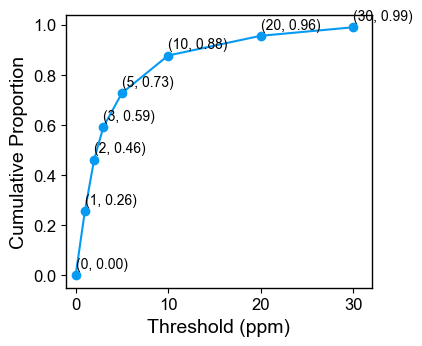


--------Validation results plot--------


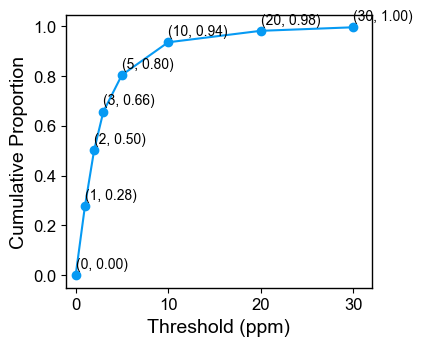


--------Training results scatter plot--------
R2 = 0.95
RMSE = 7.95
MAE = 4.641392244683084


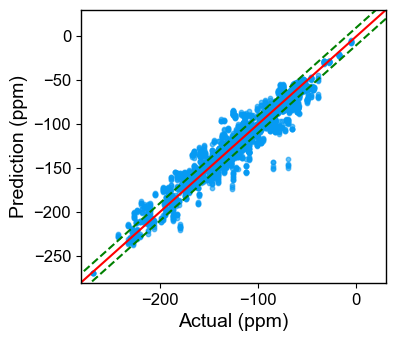


--------Validation results scatter plot--------
R2 = 0.95
RMSE = 6.14
MAE = 3.5088911399137026


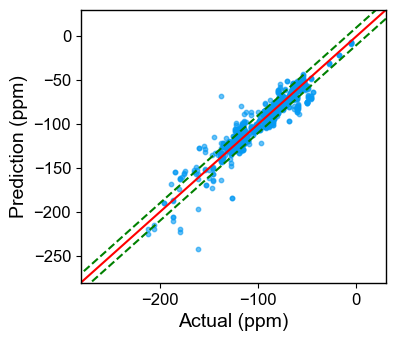

In [39]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n4, vali_results_df_n4, 
                                              model_info= 'Ridge 3D model with 4 neighbors, alpha = ' + str(best_alpha))

# Delete large objects to free up memory
del vali_results_tables_n4, vali_results_df_n4, best_alpha, train_results_tables, train_results_df

## 7.4 Spatially Neighboring atoms = 5 <a class="anchor" id="7.4"></a>

In [40]:
_, _, _, _, best_alpha = train_and_validate_ridge_3d_model(num_neighbors = 5, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.86 ± 0.16
Root Mean Squared Error (RMSE): 13.81 ± 2.02
R^2 Score: 0.78 ± 0.09


-----Validation results-----
--------Training results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,4.682265,7.829749,0.947227


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.421886,5.524665,0.958581


In [41]:
train_results_tables, train_results_df, vali_results_tables_n5, vali_results_df_n5, _ = train_and_validate_ridge_3d_model(num_neighbors = 5, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.84 ± 0.00
Root Mean Squared Error (RMSE): 13.48 ± 0.00
R^2 Score: 0.80 ± 0.00


>>>>>Random seed: 30<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.49 ± 0.00
Root Mean Squared Error (RMSE): 11.72 ± 0.00
R^2 Score: 0.87 ± 0.00


>>>>>Random seed: 512<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.70 ± 0.00
Root Mean Squared Error (RMSE): 11.72 ± 0.00
R^2 Score: 0.86 ± 0.00


>>>>>Random seed: 76<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.08 ± 0.00
Root Mean Squared Error (RMSE): 9.36 ± 0.00
R^2 Score: 0.92 ± 0.00


>>>>>Random seed: 61<<<<<

---

,mae,rmse,r2
Random Seed,,,
random_seed_42,4.682265,7.829749,0.947227
random_seed_30,4.578038,7.799083,0.946651
random_seed_512,4.700260,7.814053,0.947647
random_seed_76,4.443427,7.607618,0.948671
random_seed_61,4.599992,7.587701,0.951790


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.421886,5.524665,0.958581
random_seed_30,3.791912,5.712385,0.958610
random_seed_512,3.348858,5.406712,0.958744
random_seed_76,3.715128,6.106167,0.950858
random_seed_61,3.834988,7.872284,0.913334



>>>>> Model information: Ridge 3D model with 5 neighbors, alpha = 11 <<<<<

Performance of the model on training dataset
mae: 4.60 ± 0.10
rmse: 7.73 ± 0.12
r2: 0.95 ± 0.00

Performance of model on validation dataset
mae: 3.62 ± 0.22
rmse: 6.12 ± 1.01
r2: 0.95 ± 0.02

--------Training results plot--------


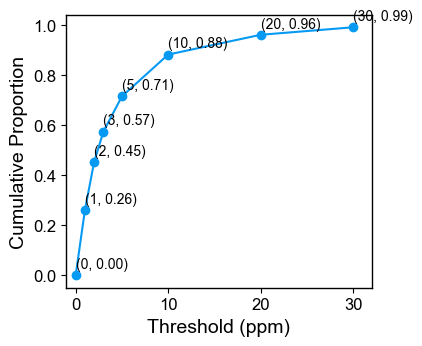


--------Validation results plot--------


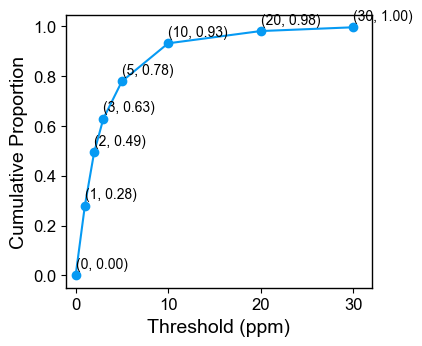


--------Training results scatter plot--------
R2 = 0.95
RMSE = 7.73
MAE = 4.599629769739308


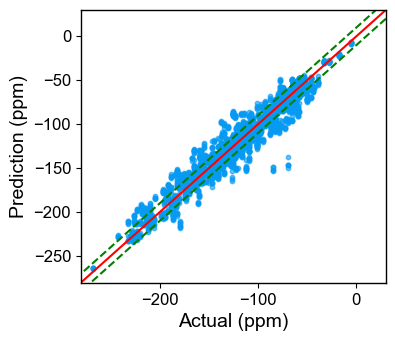


--------Validation results scatter plot--------
R2 = 0.95
RMSE = 6.25
MAE = 3.6256668545912483


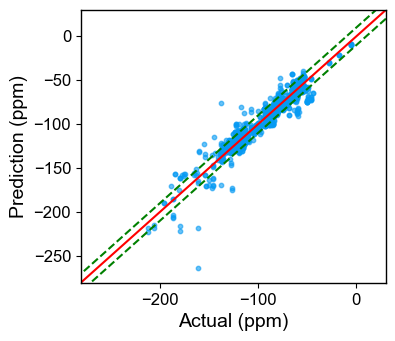

In [42]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n5, vali_results_df_n5,
                                              model_info= 'Ridge 3D model with 5 neighbors, alpha = ' + str(best_alpha))

# Delete large objects to free up memory
del vali_results_tables_n5, vali_results_df_n5, best_alpha, train_results_tables, train_results_df

## 7.5 Spatially Neighboring atoms = 6 <a class="anchor" id="7.5"></a>

In [43]:
_, _, _, _, best_alpha = train_and_validate_ridge_3d_model(num_neighbors = 6, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 15

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.93 ± 0.17
Root Mean Squared Error (RMSE): 13.82 ± 2.08
R^2 Score: 0.78 ± 0.10


-----Validation results-----
--------Training results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,4.7578,7.807931,0.947521


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.510574,5.555715,0.958115


In [44]:
train_results_tables, train_results_df, vali_results_tables_n6, vali_results_df_n6, _ = train_and_validate_ridge_3d_model(num_neighbors = 6, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [15]---------
Best Alpha: 15

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.91 ± 0.00
Root Mean Squared Error (RMSE): 12.82 ± 0.00
R^2 Score: 0.83 ± 0.00


>>>>>Random seed: 30<<<<<

---------Searched alphas: [15]---------
Best Alpha: 15

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.55 ± 0.00
Root Mean Squared Error (RMSE): 11.16 ± 0.00
R^2 Score: 0.88 ± 0.00


>>>>>Random seed: 512<<<<<

---------Searched alphas: [15]---------
Best Alpha: 15

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.77 ± 0.00
Root Mean Squared Error (RMSE): 11.33 ± 0.00
R^2 Score: 0.87 ± 0.00


>>>>>Random seed: 76<<<<<

---------Searched alphas: [15]---------
Best Alpha: 15

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.17 ± 0.00
Root Mean Squared Error (RMSE): 9.20 ± 0.00
R^2 Score: 0.92 ± 0.00


>>>>>Random seed: 61<<<<<

---

,mae,rmse,r2
Random Seed,,,
random_seed_42,4.757800,7.807931,0.947521
random_seed_30,4.613926,7.741555,0.947435
random_seed_512,4.736457,7.752935,0.948462
random_seed_76,4.501731,7.538980,0.949593
random_seed_61,4.618720,7.576321,0.951934


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.510574,5.555715,0.958115
random_seed_30,3.991787,5.963900,0.954885
random_seed_512,3.573588,5.634322,0.955198
random_seed_76,3.948192,6.256027,0.948416
random_seed_61,3.899371,7.952866,0.911551



>>>>> Model information: Ridge 3D model with 6 neighbors, alpha = 15 <<<<<

Performance of the model on training dataset
mae: 4.65 ± 0.10
rmse: 7.68 ± 0.12
r2: 0.95 ± 0.00

Performance of model on validation dataset
mae: 3.78 ± 0.22
rmse: 6.27 ± 0.98
r2: 0.95 ± 0.02

--------Training results plot--------


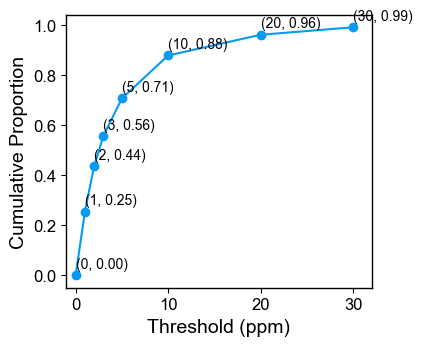


--------Validation results plot--------


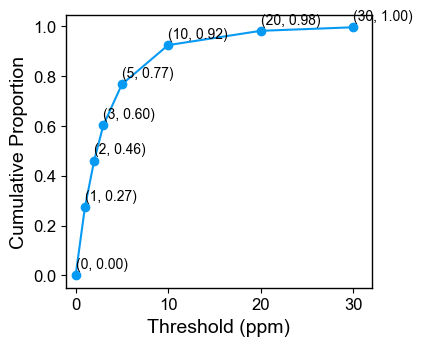


--------Training results scatter plot--------
R2 = 0.95
RMSE = 7.68
MAE = 4.644757068580035


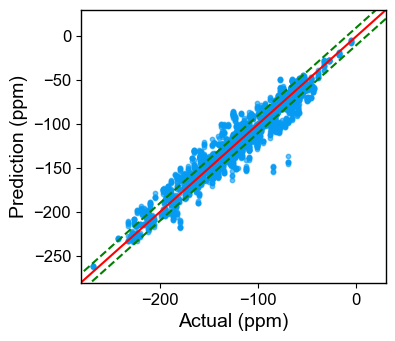


--------Validation results scatter plot--------
R2 = 0.95
RMSE = 6.39
MAE = 3.7819332714225924


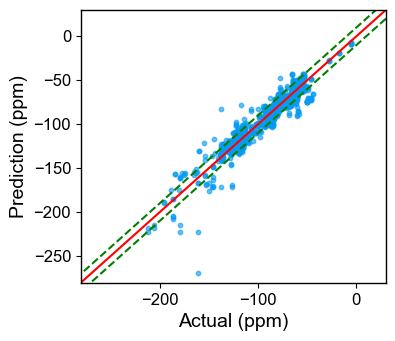

In [45]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n6, vali_results_df_n6,
                                              model_info= 'Ridge 3D model with 6 neighbors, alpha = ' + str(best_alpha))

del vali_results_tables_n6, vali_results_df_n6, best_alpha, train_results_tables, train_results_df

## 7.6 Spatially Neighboring atoms = 7 <a class="anchor" id="7.6"></a>

In [46]:
_, _, _, _, best_alpha = train_and_validate_ridge_3d_model(num_neighbors = 7, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 6.00 ± 0.15
Root Mean Squared Error (RMSE): 13.95 ± 1.67
R^2 Score: 0.79 ± 0.08


-----Validation results-----
--------Training results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,4.644491,7.519208,0.95133


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.674626,5.645896,0.956744


In [47]:
train_results_tables, train_results_df, vali_results_tables_n7, vali_results_df_n7, _ = train_and_validate_ridge_3d_model(num_neighbors = 7, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.98 ± 0.00
Root Mean Squared Error (RMSE): 13.69 ± 0.00
R^2 Score: 0.80 ± 0.00


>>>>>Random seed: 30<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.59 ± 0.00
Root Mean Squared Error (RMSE): 11.58 ± 0.00
R^2 Score: 0.87 ± 0.00


>>>>>Random seed: 512<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.89 ± 0.00
Root Mean Squared Error (RMSE): 12.04 ± 0.00
R^2 Score: 0.85 ± 0.00


>>>>>Random seed: 76<<<<<

---------Searched alphas: [11]---------
Best Alpha: 11

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.23 ± 0.00
Root Mean Squared Error (RMSE): 10.09 ± 0.00
R^2 Score: 0.91 ± 0.00


>>>>>Random seed: 61<<<<<

--

,mae,rmse,r2
Random Seed,,,
random_seed_42,4.644491,7.519208,0.951330
random_seed_30,4.534930,7.494093,0.950742
random_seed_512,4.625697,7.483789,0.951979
random_seed_76,4.375523,7.275138,0.953059
random_seed_61,4.524012,7.314704,0.955197


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.674626,5.645896,0.956744
random_seed_30,4.027512,5.805279,0.957253
random_seed_512,3.679970,5.543927,0.956624
random_seed_76,4.014547,6.231641,0.948817
random_seed_61,3.943132,8.310792,0.903410



>>>>> Model information: Ridge 3D model with 7 neighbors, alpha = 11 <<<<<

Performance of the model on training dataset
mae: 4.54 ± 0.11
rmse: 7.42 ± 0.11
r2: 0.95 ± 0.00

Performance of model on validation dataset
mae: 3.87 ± 0.18
rmse: 6.31 ± 1.15
r2: 0.94 ± 0.02

--------Training results plot--------


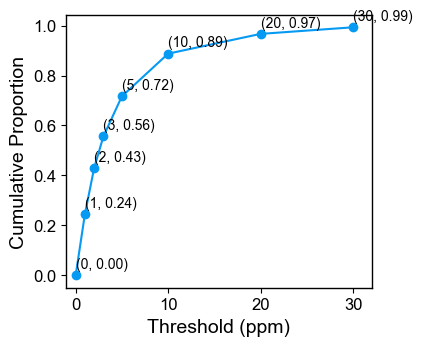


--------Validation results plot--------


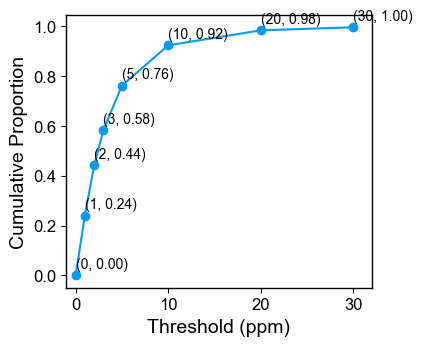


--------Training results scatter plot--------
R2 = 0.95
RMSE = 7.42
MAE = 4.539763830852325


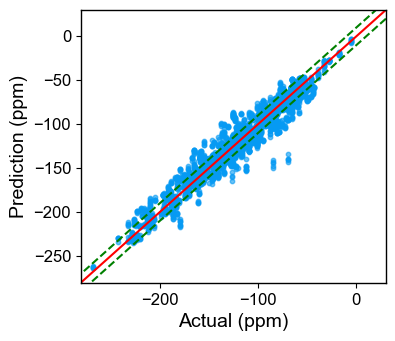


--------Validation results scatter plot--------
R2 = 0.94
RMSE = 6.46
MAE = 3.8652754542766026


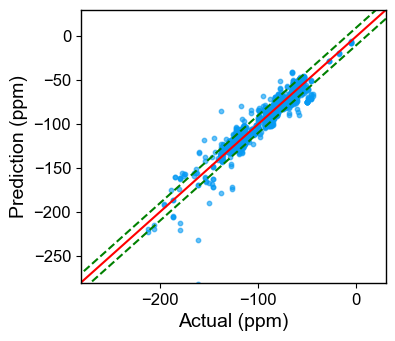

In [48]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n7, vali_results_df_n7,
                                                model_info= 'Ridge 3D model with 7 neighbors, alpha = ' + str(best_alpha))

del vali_results_tables_n7, vali_results_df_n7, best_alpha, train_results_tables, train_results_df

## 7.7 Spatially Neighboring atoms = 10 <a class="anchor" id="7.7"></a>

In [49]:
_, _, _, _, best_alpha = train_and_validate_ridge_3d_model(num_neighbors = 10, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 6.10 ± 0.15
Root Mean Squared Error (RMSE): 13.17 ± 1.40
R^2 Score: 0.82 ± 0.06


-----Validation results-----
--------Training results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,4.602962,7.262379,0.954598


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.721466,5.635725,0.956899


In [50]:
train_results_tables, train_results_df, vali_results_tables_n10, vali_results_df_n10, _ = train_and_validate_ridge_3d_model(num_neighbors = 10, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>>Random seed: 42<<<<<

---------Searched alphas: [10]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 6.08 ± 0.00
Root Mean Squared Error (RMSE): 13.06 ± 0.00
R^2 Score: 0.83 ± 0.00


>>>>>Random seed: 30<<<<<

---------Searched alphas: [10]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.85 ± 0.00
Root Mean Squared Error (RMSE): 11.74 ± 0.00
R^2 Score: 0.87 ± 0.00


>>>>>Random seed: 512<<<<<

---------Searched alphas: [10]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 6.06 ± 0.00
Root Mean Squared Error (RMSE): 12.17 ± 0.00
R^2 Score: 0.85 ± 0.00


>>>>>Random seed: 76<<<<<

---------Searched alphas: [10]---------
Best Alpha: 10

-----Scoring metrics for the best model on training dataset------
MAE Score: 5.34 ± 0.00
Root Mean Squared Error (RMSE): 10.16 ± 0.00
R^2 Score: 0.91 ± 0.00


>>>>>Random seed: 61<<<<<

--

,mae,rmse,r2
Random Seed,,,
random_seed_42,4.602962,7.262379,0.954598
random_seed_30,4.504610,7.270128,0.953642
random_seed_512,4.564497,7.220563,0.955297
random_seed_76,4.368456,7.060156,0.955793
random_seed_61,4.480528,7.121853,0.957528


--------Validation results DataFrame--------


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.721466,5.635725,0.956899
random_seed_30,4.128605,5.836890,0.956786
random_seed_512,3.846470,5.737744,0.953538
random_seed_76,4.036414,6.203114,0.949285
random_seed_61,4.098747,9.071026,0.884931



>>>>> Model information: Ridge 3D model with 10 neighbors, alpha = 10 <<<<<

Performance of the model on training dataset
mae: 4.50 ± 0.09
rmse: 7.19 ± 0.09
r2: 0.96 ± 0.00

Performance of model on validation dataset
mae: 3.97 ± 0.18
rmse: 6.50 ± 1.45
r2: 0.94 ± 0.03

--------Training results plot--------


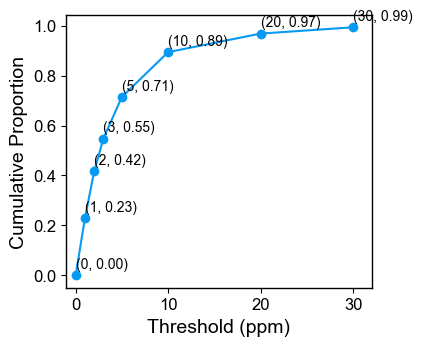


--------Validation results plot--------


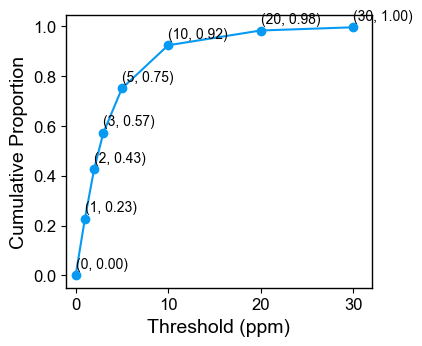


--------Training results scatter plot--------
R2 = 0.96
RMSE = 7.19
MAE = 4.503281278689037


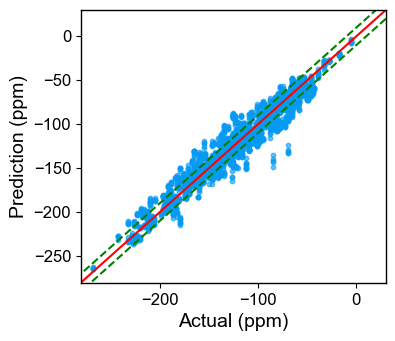


--------Validation results scatter plot--------
R2 = 0.94
RMSE = 6.72
MAE = 3.9662471217389013


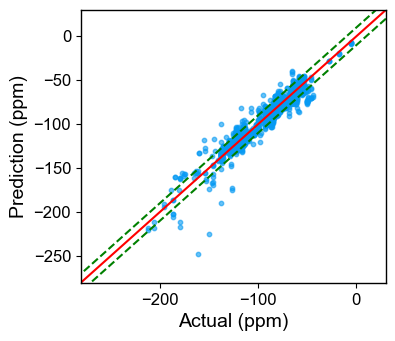

In [51]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n10, vali_results_df_n10,
                                                model_info= 'Ridge 3D model with 10 neighbors, alpha = ' + str(best_alpha))

del vali_results_tables_n10, vali_results_df_n10, best_alpha, train_results_tables, train_results_df

## 7.8 Save best Rdige 3D model results on validation dataset to CSV file

In [52]:
# # Save best RidgeCV model results to a CSV file
# file_path = os.path.join("..", "artifacts", "results")
# vali_results_df_n4.to_csv(
#     os.path.join(file_path, "Best_RidgeCV_3D_vali_results.csv")
# )

Use descriptors from 10 atoms near the target F atom seems to have the best modeling performance.

## 7.9 Feature Importance<a class="anchor" id="7.9"></a>
**Coorelation analysis**

**Pearson correlation coefficient:** Correlation coefficients whose magnitude are between `0.9 and 1.0` indicate variables which can be considered `very highly correlated`. Correlation coefficients whose magnitude are between `0.7 and 0.9` indicate variables which can be considered `highly correlated`. Correlation coefficients whose magnitude are between `0.5 and 0.7` indicate variables which can be considered `moderately correlated`. Correlation coefficients whose magnitude are between `0.3 and 0.5` indicate variables which have a `low correlation`. Correlation coefficients whose magnitude are `less than 0.3` have `little if any (linear) correlation`. 

In [53]:
file_path = os.path.join("..", "artifacts", "temp")
dataset = pd.read_csv(
    os.path.join(file_path, "train_dataset_3D_neighbors10.csv"), index_col=0
)

# convert values to numeric values when possible
dataset = dataset.apply(common.convert_to_numeric)

dataset = common.drop_constant_col(dataset)

dataset_dropNaN = common.drop_high_ratio_NaN_cols(dataset)

# drop rows with NaN values in the 'NMR_Peaks' column
dataset_dropNaN = dataset_dropNaN.dropna(subset=["NMR_Peaks"])


# Drop categorical columns
dataset_dropCat = common.drop_categorical_columns(dataset_dropNaN)

dataset_dropCat, imputer = common.fill_NaN(dataset_dropCat)

dataset_dropCat.shape

(2157, 185)

In [54]:
correlation_matrix = dataset.corr()

# Set a threshold for high correlation
threshold = 0.95

columns_to_drop = set()

# Find pairs of highly correlated columns
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            columns_to_drop.add(colname)  # Add one column of the pair to the set

# Drop one of each highly correlated pair
dataset_reduced = dataset.drop(columns=columns_to_drop)
dataset_reduced.shape

(2236, 151)

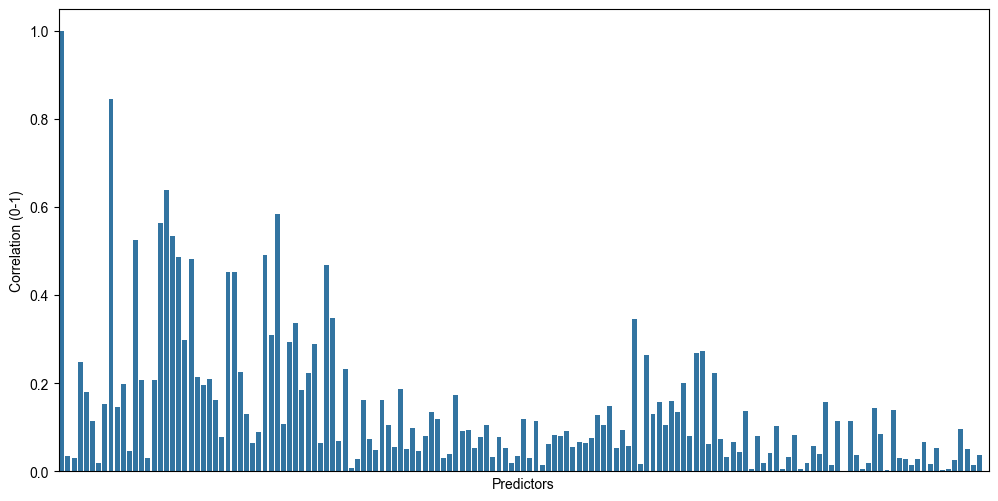

In [55]:
# Correlation between variables
data = dataset_reduced
data["NMR_Peaks"] = pd.to_numeric(data["NMR_Peaks"], errors="coerce")
corr = data.corr(numeric_only=True)["NMR_Peaks"].abs()

f, ax = plt.subplots(figsize=(12, 6))

sns.barplot(y=corr, x=corr.index, ax=ax)
ax.set_xlabel("Predictors")
ax.set_xticklabels("")
ax.set_xticks([])
ax.set_ylabel("Correlation (0-1)")
plt.show()

In [56]:
print(corr[corr > 0.6])
print(corr[corr > 0.6].index.values)

NMR_Peaks                                                   1.000000
PartialSigmaChargeDescriptor-partialSigmaCharge_self        0.847135
PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor1    0.640481
Name: NMR_Peaks, dtype: float64
['NMR_Peaks' 'PartialSigmaChargeDescriptor-partialSigmaCharge_self'
 'PartialTChargeMMFF94Descriptor-partialTCMMFF94_neighbor1']


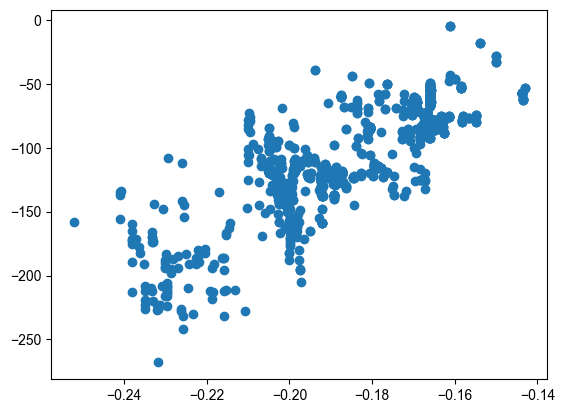

In [57]:
x = data["PartialSigmaChargeDescriptor-partialSigmaCharge_self"]
y = data["NMR_Peaks"]
plt.scatter(x, y)

# VIII. Ridge Model with 2D feature set<a class="anchor" id="8"></a>

The process are similar to that with 3D feature set. 

## 8.2 Streamline the data processing and model training process

In [58]:
class Data_Process_and_Train_2D_Ridge_Model():
    def __init__(self, num_spheres, dataset):
        self.num_spheres = num_spheres
        self.dataset = dataset
        self.X_train_scaled, self.y_train = self.step1_data_generation()
        
    def step1_data_generation(self, verbose = False):
        get_2d_descriptors = atomic_features_2D.getAtomicDescriptorsFrom2DNeighbors()
        dataset = get_2d_descriptors.getDescriptorsFromDataset(
            self.dataset, self.num_spheres
        )

        # Drop columns with constant values
        dataset = common.drop_constant_col(dataset)
        if verbose:
            print(
                f"Shape of the training dataset after dropping out columns with constant values: {dataset.shape}"
            )

        # Drop columns with >80% values being NaN
        dataset_dropNaN = common.drop_high_ratio_NaN_cols(dataset)
        if verbose:
            print(
                f"Shape of the training dataset after dropping out columns with more than 80% values being NaN: {dataset_dropNaN.shape}"
            )

        # drop rows with NaN values in the 'NMR_Peaks' column
        dataset_dropNaN = dataset_dropNaN.dropna(subset=["NMR_Peaks"])
        if verbose:
            print(f"\n-----Shape of the dataset after drop rows with NaN NMR peak values------")
            print(dataset_dropNaN.shape)

        # Convert all columns in df to numeric where possible, keeping non-numeric values unchanged
        dataset_dropNaN = dataset_dropNaN.apply(pd.to_numeric, errors="ignore")
        if verbose:
            print(common.count_non_numeric_values(dataset_dropNaN))

        # Drop categorical columns
        dataset_dropCat = common.drop_categorical_columns(dataset_dropNaN)

        # Conver column names to 'string'
        dataset_dropCat.columns = dataset_dropCat.columns.astype(str)
        dataset_dropCat, imputer = common.fill_NaN(dataset_dropCat)

        # Save imputer
        file_path = os.path.join("..", "artifacts", "models", f"imputer_2d_sphere{self.num_spheres}_Ridge.pkl")
        with open(file_path, "wb") as file:
            pickle.dump(imputer, file)
        if verbose:
            print(f'\n>>>> Imputer saved to {file_path}')

        columns = dataset_dropCat.columns.tolist()
        file_path = os.path.join(
            "..", "artifacts", "models", f"column_names_2d_sphere{self.num_spheres}_Ridge.pkl"
        )
        with open(file_path, "wb") as f:
            pickle.dump(columns, f)
        if verbose:
            print(f'>>>> Column names saved to {file_path}')

        # Print the shape of the dataset after pre-processing
        if verbose:
            print(f"\n-----Shape of the dataset after pre-processing------")
            print(dataset_dropCat.shape)

        dataset = dataset_dropCat.copy()
        y_train = dataset["NMR_Peaks"]
        X_train = dataset.drop(["NMR_Peaks"], axis=1)

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)

        # Save the scaler to a file
        file_path = os.path.join("..", "artifacts", "models", f"scaler_2d_sphere{self.num_spheres}_Ridge.pkl")
        with open(file_path, "wb") as file:
            pickle.dump(scaler, file)
        if verbose:
            print(f'\n>>>> Scaler saved to {file_path}')

        X_train_scaled = pd.DataFrame(X_train_scaled)
        X_train_scaled.columns = X_train.columns
        X_train_scaled.index = X_train.index
        return X_train_scaled, y_train

    def step2_train_model_and_optimzie_alpha(self, X_train_scaled, y_train, alpha_list = [10, 50, 80, 90, 100, 150, 200]):
        # Define a custom RMSE scoring function
        def rmse(y_true, y_pred):
            return np.sqrt(mean_squared_error(y_true, y_pred))

        # Use the custom RMSE function with make_scorer
        scoring = {
            "mae": "neg_mean_absolute_error",
            "rmse": make_scorer(rmse),  # Custom RMSE scorer
            "r2": "r2",
        }

        param_grid = {"alpha": alpha_list}

        # Create the Ridge model
        ridge = Ridge(fit_intercept=True)

        # Initialize GridSearchCV with multiple scoring metrics
        grid_search = GridSearchCV(
            estimator=ridge, param_grid=param_grid, cv=5, scoring=scoring, refit="mae"
        )
        grid_search.fit(X_train_scaled, y_train)

        # Retrieve the best alpha and results for each metric
        best_alpha = grid_search.best_params_["alpha"]
        best_scores = grid_search.cv_results_

        print(f'---------Searched alphas: {alpha_list}---------')
        # Output the best alpha and performance on chosen metric
        print(f"Best Alpha: {best_alpha}")

        # Print out scoring metrics for the best model
        print(f'MAE Score: {np.mean(-best_scores["mean_test_mae"]):.2f}')
        print(f"Root Mean Squared Error (RMSE): {np.mean(best_scores['mean_test_rmse']):.2f}")
        print(f'R^2 Score: {np.mean(best_scores["mean_test_r2"]):.2f}')
        return grid_search, best_alpha

    def step3_save_model_and_show_model_performance(self, grid_search, verbose = False):
        best_model = grid_search.best_estimator_

        file_path = os.path.join("..", "artifacts", "models", f"RidgeCV_model_2d_sphere{self.num_spheres}.pkl")
        with open(file_path, "wb") as file:
            pickle.dump(best_model, file)
        if verbose:
            print(f"\n>>>> Best model saved to {file_path}")

        results_table = common.get_results_table(best_model, self.X_train_scaled, self.y_train)
        if verbose:
            common.plot_prediction_performance(results_table)
            common.show_results_scatter(results_table)

In [59]:
def validate_Ridge_2D_model_performance(num_spheres, test_fluorinated_compounds, show_plot = False):
    base_file_path = os.path.join("..", "artifacts", "models")
    results_table, (mae, rmse, r2) = atomic_features_2D.testRidgePerformance2DFeatures(
        dataset=test_fluorinated_compounds,
        num_spheres=num_spheres,
        RidgeCVmodel_path=os.path.join(base_file_path, f"RidgeCV_model_2d_sphere{num_spheres}.pkl"),
        scaler_path=os.path.join(base_file_path, f"scaler_2d_sphere{num_spheres}_Ridge.pkl"),
        imputer_path=os.path.join(base_file_path, f"imputer_2d_sphere{num_spheres}_Ridge.pkl"),
        columns_path=os.path.join(base_file_path, f"column_names_2d_sphere{num_spheres}_Ridge.pkl"),
        show_plot = show_plot,
    )
    return results_table, (mae, rmse, r2)

In [60]:
def train_and_validate_ridge_2d_model(num_spheres, train_dataset, random_seeds=[1, 2, 3, 4, 5], alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], verbose = False):
    vali_results = {}
    vali_results_tables = pd.DataFrame()
    train_results = {}
    train_results_tables = pd.DataFrame()
    for random_seed in random_seeds:
        print(f"\n\n>>>>> Random seed: {random_seed} <<<<<\n")
        train_fluorinated_compounds, vali_fluorinated_compounds = split_datasets(
            train_dataset, RANDOM_STATE=random_seed
        )
        # Data processing and get X, y
        Ridge_2D = Data_Process_and_Train_2D_Ridge_Model(num_spheres=num_spheres, dataset = train_fluorinated_compounds)

        # Grid search for the best alpha value
        grid_search, best_alpha = Ridge_2D.step2_train_model_and_optimzie_alpha(Ridge_2D.X_train_scaled, Ridge_2D.y_train, alpha_list = alpha_list)
 
        # Save the best model and plot the results
        _ = Ridge_2D.step3_save_model_and_show_model_performance(grid_search)

        # Apply the trained model on the validation dataset and return the results table
        vali_results_table, (mae, rmse, r2) = validate_Ridge_2D_model_performance(num_spheres=num_spheres, test_fluorinated_compounds=vali_fluorinated_compounds, show_plot = False)
        train_results_table, (train_mae, train_rmse, train_r2) = validate_Ridge_2D_model_performance(num_spheres=num_spheres, test_fluorinated_compounds=train_fluorinated_compounds, show_plot = False)

        vali_results[f"random_seed_{random_seed}"] = {'mae': mae, 'rmse': rmse, 'r2': r2}
        vali_results_tables = pd.concat([vali_results_tables, vali_results_table], axis=0)

        train_results[f"random_seed_{random_seed}"] = {'mae': train_mae, 'rmse': train_rmse, 'r2': train_r2}
        train_results_tables = pd.concat([train_results_tables, train_results_table], axis=0)

        # Clear memory after each iteration
        # Delete large objects explicitly
        try:
            del train_fluorinated_compounds, vali_fluorinated_compounds
            del Ridge_3D, grid_search, vali_results_table
        except:
            pass

    print("\n\n-----Training results-----")
    train_results_df = pd.DataFrame(train_results).T
    train_results_df.index.name = 'Random Seed'
    display(train_results_df)

    print("\n\n-----Validation results-----")
    vali_results_df = pd.DataFrame(vali_results).T
    vali_results_df.index.name = 'Random Seed'
    display(vali_results_df)
    return train_results_table, train_results_df, vali_results_tables, vali_results_df, best_alpha

## 8.2 Neighboring Spheres = 2 <a class="anchor" id="8.2"></a>

In [81]:
_, _, _, _, best_alpha = train_and_validate_ridge_2d_model(num_spheres = 2, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 3
MAE Score: 5.74
Root Mean Squared Error (RMSE): 9.30
R^2 Score: 0.92


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,5.465052,8.719001,0.934612




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.531766,5.409976,0.960283


In [82]:
train_results_table, train_results_df, vali_results_table_s2, vali_results_df_s2, _ = train_and_validate_ridge_2d_model(num_spheres = 2, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [3]---------
Best Alpha: 3
MAE Score: 5.69
Root Mean Squared Error (RMSE): 9.17
R^2 Score: 0.93


>>>>> Random seed: 30 <<<<<

---------Searched alphas: [3]---------
Best Alpha: 3
MAE Score: 5.54
Root Mean Squared Error (RMSE): 9.09
R^2 Score: 0.92


>>>>> Random seed: 512 <<<<<

---------Searched alphas: [3]---------
Best Alpha: 3
MAE Score: 5.39
Root Mean Squared Error (RMSE): 9.03
R^2 Score: 0.93


>>>>> Random seed: 76 <<<<<

---------Searched alphas: [3]---------
Best Alpha: 3
MAE Score: 5.27
Root Mean Squared Error (RMSE): 8.63
R^2 Score: 0.93


>>>>> Random seed: 61 <<<<<

---------Searched alphas: [3]---------
Best Alpha: 3
MAE Score: 5.72
Root Mean Squared Error (RMSE): 9.35
R^2 Score: 0.92


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,5.465052,8.719001,0.934612
random_seed_30,5.217692,8.437111,0.937615
random_seed_512,5.110602,8.264765,0.941479
random_seed_76,5.072357,8.305978,0.938862
random_seed_61,5.443412,8.739568,0.936094




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.531766,5.409976,0.960283
random_seed_30,4.385920,6.979975,0.938203
random_seed_512,4.528992,7.429878,0.922092
random_seed_76,5.070858,8.180068,0.911807
random_seed_61,4.133532,6.644747,0.938255



>>>>> Model information: Ridge 2D model with 2 spheres, alpha = 3 <<<<<

Performance of the model on training dataset
mae: 5.26 ± 0.18
rmse: 8.49 ± 0.22
r2: 0.94 ± 0.00

Performance of model on validation dataset
mae: 4.33 ± 0.56
rmse: 6.93 ± 1.03
r2: 0.93 ± 0.02

--------Training results plot--------


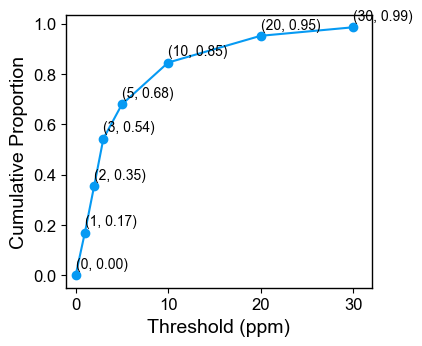


--------Validation results plot--------


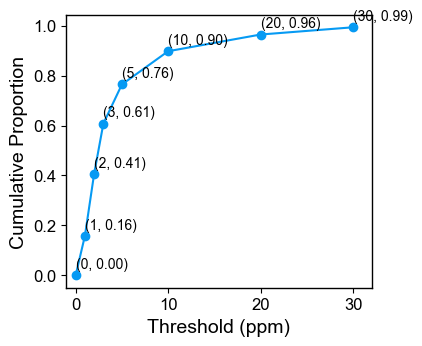


--------Training results scatter plot--------
R2 = 0.94
RMSE = 8.74
MAE = 5.443412253851939


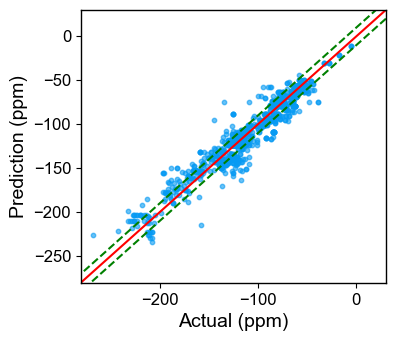


--------Validation results scatter plot--------
R2 = 0.94
RMSE = 6.93
MAE = 4.29648459784954


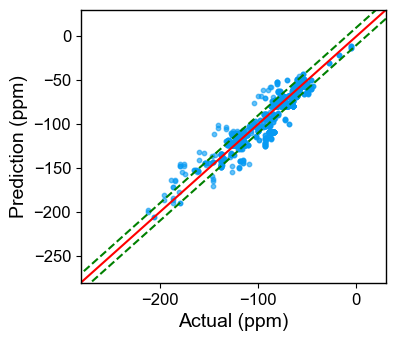

In [85]:
show_model_perfromance_on_both_train_and_vali(train_results_table, train_results_df, vali_results_table_s2, vali_results_df_s2,
                                              model_info = 'Ridge 2D model with 2 spheres, alpha = ' + str(best_alpha))

del train_results_table, train_results_df, vali_results_table_s2, vali_results_df_s2

## 8.3 Neighboring Spheres = 3 <a class="anchor" id="8.3"></a>

In [65]:
_, _, _, _, best_alpha = train_and_validate_ridge_2d_model(num_spheres = 3, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 6
MAE Score: 4.64
Root Mean Squared Error (RMSE): 7.58
R^2 Score: 0.95


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,4.273855,6.706013,0.96132




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.614339,5.744773,0.955215


In [66]:
train_results_table, train_results_df, vali_results_tables_s3, vali_results_df_s3, _ = train_and_validate_ridge_2d_model(num_spheres = 3, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [6]---------
Best Alpha: 6
MAE Score: 4.61
Root Mean Squared Error (RMSE): 7.52
R^2 Score: 0.95


>>>>> Random seed: 30 <<<<<

---------Searched alphas: [6]---------
Best Alpha: 6
MAE Score: 4.56
Root Mean Squared Error (RMSE): 7.52
R^2 Score: 0.95


>>>>> Random seed: 512 <<<<<

---------Searched alphas: [6]---------
Best Alpha: 6
MAE Score: 4.54
Root Mean Squared Error (RMSE): 7.70
R^2 Score: 0.95


>>>>> Random seed: 76 <<<<<

---------Searched alphas: [6]---------
Best Alpha: 6
MAE Score: 4.39
Root Mean Squared Error (RMSE): 7.24
R^2 Score: 0.95


>>>>> Random seed: 61 <<<<<

---------Searched alphas: [6]---------
Best Alpha: 6
MAE Score: 4.78
Root Mean Squared Error (RMSE): 7.93
R^2 Score: 0.95


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,4.273855,6.706013,0.961320
random_seed_30,4.100997,6.599694,0.961828
random_seed_512,4.027635,6.505624,0.963740
random_seed_76,3.925301,6.393406,0.963776
random_seed_61,4.243281,6.842658,0.960825




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.614339,5.744773,0.955215
random_seed_30,3.864179,6.201920,0.951212
random_seed_512,3.948964,6.646114,0.937662
random_seed_76,4.376270,7.197569,0.931720
random_seed_61,3.410929,5.623130,0.955782



>>>>> Model information: Ridge 2D model with 3 spheres, alpha = 6 <<<<<

Performance of the model on training dataset
mae: 4.11 ± 0.15
rmse: 6.61 ± 0.17
r2: 0.96 ± 0.00

Performance of model on validation dataset
mae: 3.84 ± 0.37
rmse: 6.28 ± 0.65
r2: 0.95 ± 0.01

--------Training results plot--------


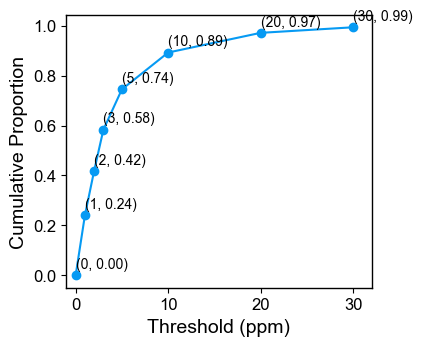


--------Validation results plot--------


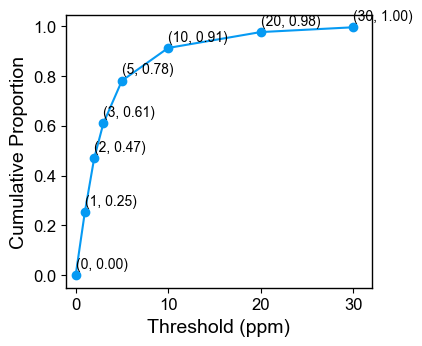


--------Training results scatter plot--------
R2 = 0.96
RMSE = 6.84
MAE = 4.243280772842389


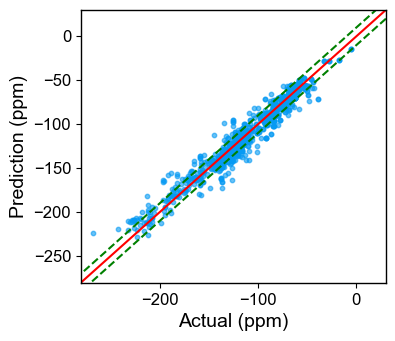


--------Validation results scatter plot--------
R2 = 0.95
RMSE = 6.26
MAE = 3.8140210533434713


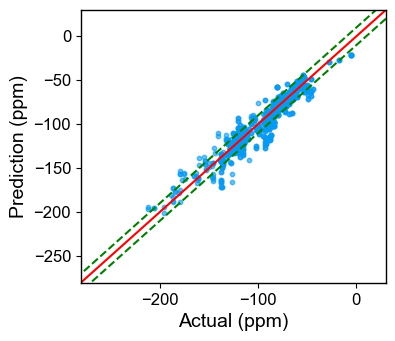

In [67]:
show_model_perfromance_on_both_train_and_vali(train_results_table, train_results_df, vali_results_tables_s3, vali_results_df_s3,
                                              model_info = 'Ridge 2D model with 3 spheres, alpha = ' + str(best_alpha))

del vali_results_tables_s3, vali_results_df_s3, best_alpha, train_results_table, train_results_df

## 8.4 Neighboring Spheres = 4 <a class="anchor" id="8.4"></a>

In [78]:
_, _, _, _, best_alpha = train_and_validate_ridge_2d_model(num_spheres = 4, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 7
MAE Score: 4.51
Root Mean Squared Error (RMSE): 7.23
R^2 Score: 0.95


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.917482,6.176339,0.967189




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.428726,5.674788,0.9563


In [ ]:
train_results_table, train_results_df, vali_results_tables_s4, vali_results_df_s4, _ = train_and_validate_ridge_2d_model(num_spheres = 4, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])

# Save vali results table to csv
vali_results_tables_s4.to_csv(os.path.join("..", "artifacts", "results", "Ridge 2D Results On Validation Dataset with 5 Random Seeds.csv"), index=False)



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [7]---------
Best Alpha: 7
MAE Score: 4.48
Root Mean Squared Error (RMSE): 7.18
R^2 Score: 0.95


>>>>> Random seed: 30 <<<<<

---------Searched alphas: [7]---------
Best Alpha: 7
MAE Score: 4.51
Root Mean Squared Error (RMSE): 7.54
R^2 Score: 0.95


>>>>> Random seed: 512 <<<<<

---------Searched alphas: [7]---------
Best Alpha: 7
MAE Score: 4.48
Root Mean Squared Error (RMSE): 7.82
R^2 Score: 0.95


>>>>> Random seed: 76 <<<<<

---------Searched alphas: [7]---------
Best Alpha: 7
MAE Score: 4.18
Root Mean Squared Error (RMSE): 7.00
R^2 Score: 0.96


>>>>> Random seed: 61 <<<<<

---------Searched alphas: [7]---------
Best Alpha: 7
MAE Score: 4.21
Root Mean Squared Error (RMSE): 7.11
R^2 Score: 0.96


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.917482,6.176339,0.967189
random_seed_30,3.894517,6.238637,0.965891
random_seed_512,3.820380,6.124221,0.967867
random_seed_76,3.629919,5.872977,0.969434
random_seed_61,3.551582,5.763188,0.972210




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.428726,5.674788,0.956300
random_seed_30,3.625083,5.803753,0.957275
random_seed_512,3.756995,6.285479,0.944244
random_seed_76,4.146398,6.626880,0.942119
random_seed_61,3.208148,5.279456,0.961021



>>>>> Model information: Ridge 2D model with 4 spheres, alpha = 7 <<<<<

Performance of the model on training dataset
mae: 3.76 ± 0.16
rmse: 6.04 ± 0.21
r2: 0.97 ± 0.00

Performance of model on validation dataset
mae: 3.63 ± 0.35
rmse: 5.93 ± 0.53
r2: 0.95 ± 0.01

--------Training results plot--------


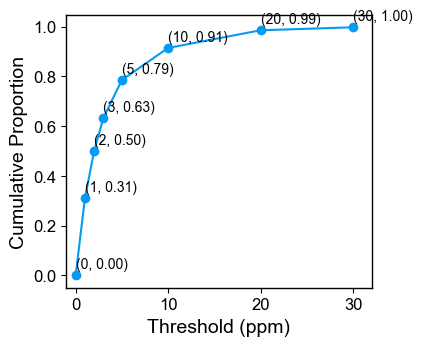


--------Validation results plot--------


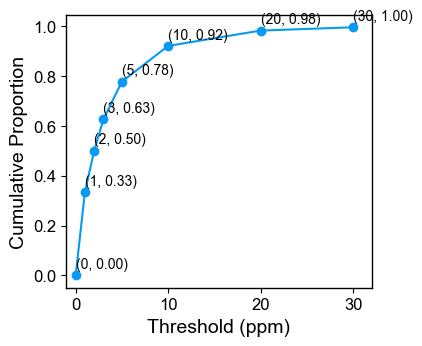


--------Training results scatter plot--------
R2 = 0.97
RMSE = 5.76
MAE = 3.551581719850455


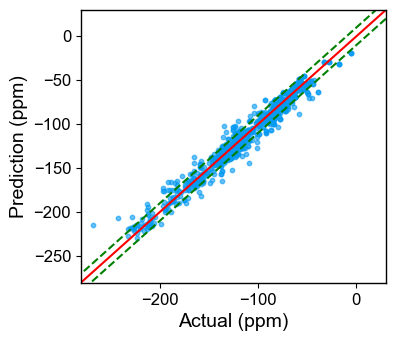


--------Validation results scatter plot--------
R2 = 0.95
RMSE = 5.91
MAE = 3.6050779248775373


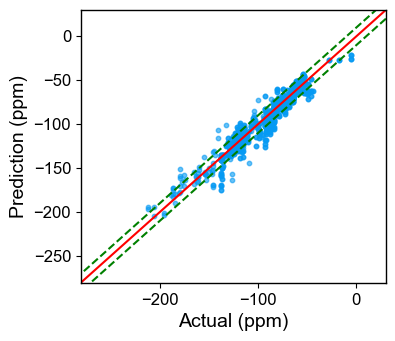

In [80]:
show_model_perfromance_on_both_train_and_vali(train_results_table, train_results_df, vali_results_tables_s4, vali_results_df_s4,
                                              model_info = 'Ridge 2D model with 4 spheres, alpha = ' + str(best_alpha))

del train_results_table, train_results_df, vali_results_tables_s4, vali_results_df_s4,

## 8.5 Neighboring Spheres = 5 <a class="anchor" id="8.5"></a>

In [90]:
_, _, _, _, best_alpha = train_and_validate_ridge_2d_model(num_spheres = 5, train_dataset = train_dataset, alpha_list = [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50], random_seeds=[42])



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [3, 5, 6, 7, 8, 9, 10, 11, 12, 15, 50]---------
Best Alpha: 8
MAE Score: 4.44
Root Mean Squared Error (RMSE): 7.14
R^2 Score: 0.96


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.749146,5.867478,0.970388




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.546507,5.769749,0.954825


In [91]:
train_results_table, train_results_df, vali_results_tables_s5, vali_results_df_s5, _ = train_and_validate_ridge_2d_model(num_spheres = 5, train_dataset = train_dataset, alpha_list = [best_alpha], random_seeds=[42, 30, 512, 76, 61])



>>>>> Random seed: 42 <<<<<

---------Searched alphas: [8]---------
Best Alpha: 8
MAE Score: 4.42
Root Mean Squared Error (RMSE): 7.10
R^2 Score: 0.96


>>>>> Random seed: 30 <<<<<

---------Searched alphas: [8]---------
Best Alpha: 8
MAE Score: 4.84
Root Mean Squared Error (RMSE): 8.49
R^2 Score: 0.93


>>>>> Random seed: 512 <<<<<

---------Searched alphas: [8]---------
Best Alpha: 8
MAE Score: 4.59
Root Mean Squared Error (RMSE): 7.75
R^2 Score: 0.95


>>>>> Random seed: 76 <<<<<

---------Searched alphas: [8]---------
Best Alpha: 8
MAE Score: 4.16
Root Mean Squared Error (RMSE): 6.92
R^2 Score: 0.96


>>>>> Random seed: 61 <<<<<

---------Searched alphas: [8]---------
Best Alpha: 8
MAE Score: 4.16
Root Mean Squared Error (RMSE): 7.00
R^2 Score: 0.96


-----Training results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.749146,5.867478,0.970388
random_seed_30,3.872012,5.991797,0.968537
random_seed_512,3.791023,5.953561,0.969633
random_seed_76,3.559782,5.710692,0.971100
random_seed_61,3.476128,5.650104,0.973290




-----Validation results-----


,mae,rmse,r2
Random Seed,,,
random_seed_42,3.546507,5.769749,0.954825
random_seed_30,3.657536,5.925047,0.955471
random_seed_512,3.833946,6.195035,0.945837
random_seed_76,4.188204,6.415374,0.945755
random_seed_61,3.266260,5.427407,0.958806



>>>>> Model information: Ridge 2D model with 5 spheres, alpha = 8 <<<<<

Performance of the model on training dataset
mae: 3.69 ± 0.17
rmse: 5.83 ± 0.15
r2: 0.97 ± 0.00

Performance of model on validation dataset
mae: 3.70 ± 0.34
rmse: 5.95 ± 0.38
r2: 0.95 ± 0.01

--------Training results plot--------


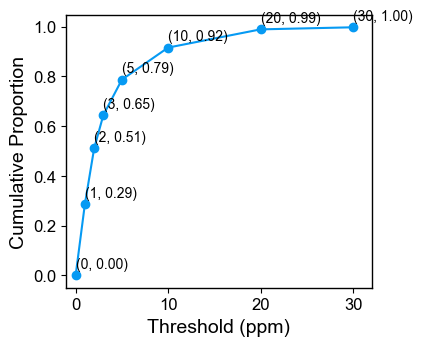


--------Validation results plot--------


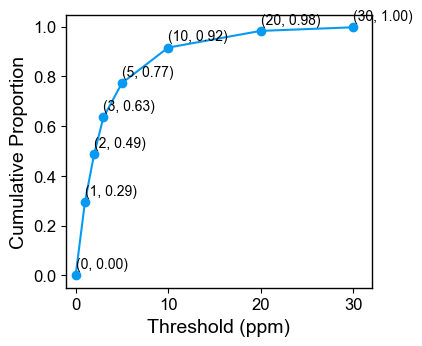


--------Training results scatter plot--------
R2 = 0.97
RMSE = 5.65
MAE = 3.476128090254735


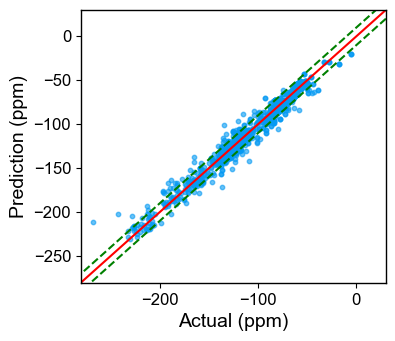


--------Validation results scatter plot--------
R2 = 0.95
RMSE = 5.93
MAE = 3.671431305673958


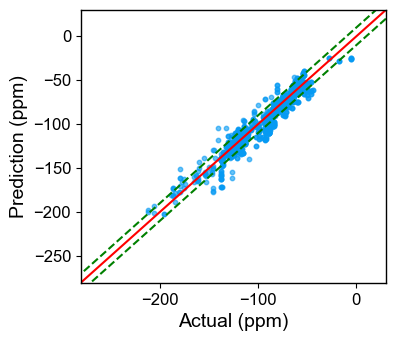

In [92]:
show_model_perfromance_on_both_train_and_vali(train_results_table, train_results_df, vali_results_tables_s5, vali_results_df_s5,
                                                model_info = 'Ridge 2D model with 5 spheres, alpha = ' + str(best_alpha))
del train_results_table, train_results_df, vali_results_tables_s5, vali_results_df_s5

# 8.5 Save best RidgeCV model results to a CSV file

In [93]:
# save results table
# file_path = os.path.join("..", "artifacts", "results")
# results_table.to_csv(
#     os.path.join(file_path, "RidgeCV_2DFeatureSet_sphere5_valiDataset.csv")
# )

Results: The best performing model used features of atoms from the nearest **five** spheres in 2D space.

## 8.6 Feature Importance Analysis <a class="anchor" id="8.6"></a>

In [94]:
get_2d_descriptors = atomic_features_2D.getAtomicDescriptorsFrom2DNeighbors()
dataset = get_2d_descriptors.getDescriptorsFromDataset(
    train_fluorinated_compounds, 5
)

dataset = common.drop_constant_col(dataset)
print(
    f"Shape of the training dataset after dropping out columns with constant values: {dataset.shape}"
)

dataset_dropNaN = common.drop_high_ratio_NaN_cols(dataset)
print(
    f"\nShape of the training dataset after dropping out columns with more than 80% values being NaN: {dataset_dropNaN.shape}"
)

# drop rows with NaN values in the 'NMR_Peaks' column
dataset_dropNaN = dataset_dropNaN.dropna(subset=["NMR_Peaks"])
print("\n")
print(f"-----Shape of the dataset after drop rows with NaN NMR peak values------")
print(dataset_dropNaN.shape)

# Convert all columns in df to numeric where possible, keeping non-numeric values unchanged
dataset_dropNaN = dataset_dropNaN.apply(pd.to_numeric, errors="ignore")

print(common.count_non_numeric_values(dataset_dropNaN))

# Drop categorical columns
dataset_dropCat = common.drop_categorical_columns(dataset_dropNaN)

# Conver column names to 'string'
dataset_dropCat.columns = dataset_dropCat.columns.astype(str)

dataset_dropCat, imputer = common.fill_NaN(dataset_dropCat)

Shape of the training dataset after dropping out columns with constant values: (2357, 199)

Shape of the training dataset after dropping out columns with more than 80% values being NaN: (2357, 145)


-----Shape of the dataset after drop rows with NaN NMR peak values------
(2286, 145)
Columns with Non-Numeric Values:
Series([], dtype: int64)
None


In [95]:
dataset = dataset_dropCat.copy()
correlation_matrix = dataset.corr()

# Set a threshold for high correlation
threshold = 0.95

columns_to_drop = set()

# Find pairs of highly correlated columns
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            columns_to_drop.add(colname)  # Add one column of the pair to the set

# Drop one of each highly correlated pair
dataset_reduced = dataset.drop(columns=columns_to_drop)
dataset_reduced.shape

(2286, 106)

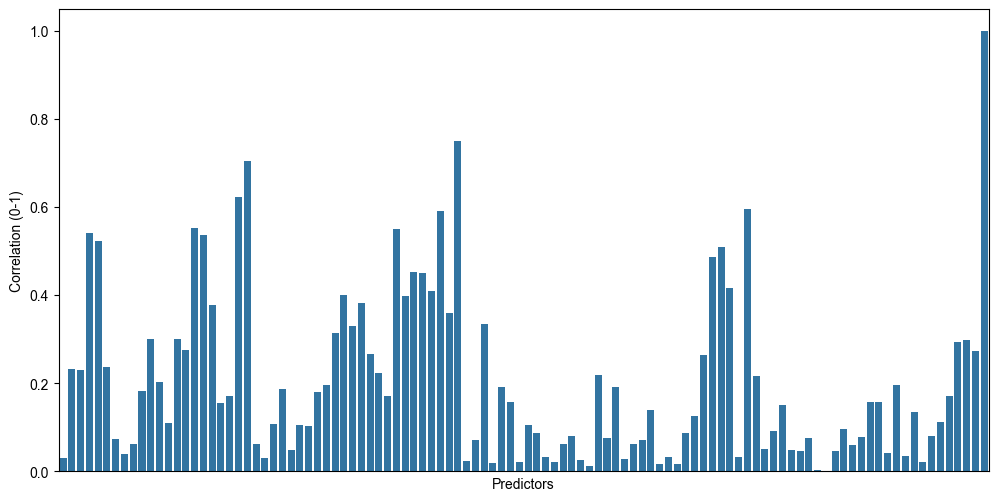

In [96]:
# Correlation between variables
data = dataset_reduced
data["NMR_Peaks"] = pd.to_numeric(data["NMR_Peaks"], errors="coerce")
corr = data.corr(numeric_only=True)["NMR_Peaks"].abs()

f, ax = plt.subplots(figsize=(12, 6))

sns.barplot(y=corr, x=corr.index, ax=ax)
ax.set_xlabel("Predictors")
ax.set_xticklabels("")
ax.set_xticks([])
ax.set_ylabel("Correlation (0-1)")
plt.show()

In [97]:
print(corr[corr > 0.6])
print(corr[corr > 0.6].index.values)

24           0.624455
25           0.705878
56           0.750898
NMR_Peaks    1.000000
Name: NMR_Peaks, dtype: float64
['24' '25' '56' 'NMR_Peaks']


# IX. Feed Forward Neural Network with 3D feature sets

## 9.1 Streamline the data processing and FFNN model training

Choose appropriate model structure:


* Number of Layers:
A deeper network can capture more complex features, but it also increases training complexity. Start with fewer layers and increase if needed.

Our training dataset have ~2000 rows and ~100 columns. This is not a big dataset. 3 layers may be a good start.

* Neurons per Layer:
The number of neurons in each layer determines the capacity of the network. More neurons can represent more complex patterns, but they also increase the number of parameters to train.

In [98]:
# Same data preprocessing as for the Ridge model. Therefore we don't have to save relevant imputer, scaler, and column names to files
class Define_and_Train_FFNN_Model():
    def __init__(self, num_neighbors, fluorinated_compounds):
        self.num_neighbors = num_neighbors
        self.fluorinated_compounds = fluorinated_compounds
        fluorinated_compounds_w_Desc = self.step1_generated_dataset()
        dataset_dropCat = self.step2_data_preprocessing(fluorinated_compounds_w_Desc)
        self.X_scaled, self.y = self.step3_get_X_and_y(dataset_dropCat)
        return 

    def step1_generated_dataset(self):
        fluorinated_compounds_w_Desc = atomic_features_3D.Combine_descriptors(
            self.fluorinated_compounds, num_neighbors = self.num_neighbors, with_additional_info=True
            )
        fluorinated_compounds_w_Desc.rename_axis(
            "atomCode_fluorinated_compoundsCode", inplace=True
        )

        # Save the table to a csv file
        file_path = os.path.join("..", "artifacts", "temp", f"train_dataset_3D_neighbors{self.num_neighbors}.csv")
        fluorinated_compounds_w_Desc.to_csv(file_path, encoding="utf-8")
        return fluorinated_compounds_w_Desc
    
    def step2_data_preprocessing(self, dataset):
        dataset = common.drop_constant_col(dataset)
        dataset_dropNaN = common.drop_high_ratio_NaN_cols(dataset)

        # Drop rows with NaN values in the 'NMR_Peaks' column
        dataset_dropNaN = dataset_dropNaN.dropna(subset=["NMR_Peaks"])

        # Convert all columns in df to numeric where possible, keeping non-numeric values unchanged
        dataset_dropNaN = dataset_dropNaN.apply(pd.to_numeric, errors="ignore")

        # Drop categorical columns
        dataset_dropCat = common.drop_categorical_columns(dataset_dropNaN)
        dataset_dropCat, imputer = common.fill_NaN(dataset_dropCat)

        return dataset_dropCat
    
    def step3_get_X_and_y(self, dataset):
        y = dataset["NMR_Peaks"]
        X = dataset.drop(["NMR_Peaks"], axis=1)
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        X_scaled = pd.DataFrame(X_scaled)
        X_scaled.columns = X.columns
        X_scaled.index = X.index
        return X_scaled, y
       
    # Define model architecture
    # Our training dataset have ~ 2000 samples, and ~100 features.
    def step4_create_model(self, X_scaled, y, config):
        model = Sequential([
            # Input layer
            Input(shape=(X_scaled.shape[1],)),
            Dense(config['layers'][0], activation='relu'),
            BatchNormalization(),
            Dropout(config['dropout'][0]),

            Dense(config['layers'][1], activation='relu'),
            BatchNormalization(),
            Dropout(config['dropout'][1]),

            # Hidden layers
            Dense(config['layers'][2], activation='relu'),
            BatchNormalization(),
            Dropout(config['dropout'][2]),
            
            # Output layer - for regression task
            Dense(1),
            Lambda(lambda x:-x) # all 19F NMR values are negative in our dataset
        ])
        
        lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10)
   
        # Early stopping to prevent overfitting
        early_stopping = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True
        )

        # Compile model
        # Use Huber loss for our task, which is less sensitive to outliers. 
        # For small errors ([error] < delta), it behaves like MSE, and for large errors, it behaves like MAE.
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss=tf.keras.losses.Huber(delta=7), 
            metrics=['mean_squared_error', 'mean_absolute_error']
        )

        # Split data into training and validation sets
        X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True)

        # Fit the model
        history = model.fit(
            X_train, y_train,
            epochs=200,
            batch_size=32,
            validation_data=(X_val, y_val),
            callbacks=[early_stopping, lr_scheduler],
            verbose=0
        )

        # Evaluate the model on validation data
        val_loss, val_mse, val_mae = model.evaluate(X_val, y_val, verbose=0)
        print(f"Validation Loss (Huber loss): {val_loss:.2f}")
        print(f"Validation MSE: {val_mse:.2f}")
        print(f"Validation MAE: {val_mae:.2f}")
        
        # Visualize training history
        plt.figure(figsize=(12, 4))
        
        # Plot training & validation loss
        plt.subplot(1, 2, 1)
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title('Model Loss')
        plt.ylabel('Huber Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper right')

        # Plot training & validation mean absolute error
        plt.subplot(1, 2, 2)
        plt.plot(history.history['mean_squared_error'])
        plt.plot(history.history['val_mean_squared_error'])
        plt.title('Mean Squared Error')
        plt.ylabel('MSE')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper right')
        plt.tight_layout()
        plt.show()

        # Save the model
        model_path = os.path.join("..", "artifacts", "models", f"FFNN_model_neighbor{self.num_neighbors}.h5")
        model.save(model_path)
        print(f">>>> Model saved to {model_path}")
    
        return model, history.history



In [99]:
#
# Function to test the performance of the trained FFNN model on a selected dataset
#

def test_3D_FFNN_model_on_validation_dataset(
    dataset, num_neighbors, FFNNmodel_path, scaler_path, imputer_path, columns_path, show_plot = True
):
    """
    Test the performance of Ridge model. Ouput the results table, plot the error distribution of the model, and plot the scatter plot of actual vs predicted values.
    """
    
    best_model = load_model(FFNNmodel_path)

    with open(scaler_path, "rb") as file:
        scaler = pickle.load(file)

    with open(imputer_path, "rb") as file:
        imputer = pickle.load(file)

    with open(columns_path, "rb") as file:
        train_columns = pickle.load(file)

    # convert values to numeric values when possible
    dataset = atomic_features_3D.Combine_descriptors(
        dataset, num_neighbors=num_neighbors, with_additional_info=True
    )
    dataset.apply(common.convert_to_numeric)

    # drop rows with NaN values in the 'NMR_Peaks' column
    dataset_dropNaN = dataset.dropna(subset=["NMR_Peaks"])

    dataset_dropNaN = dataset_dropNaN[train_columns]
    dataset_dropNaN_imputed = imputer.transform(dataset_dropNaN)

    dataset_dropNaN_imputed = pd.DataFrame(
        dataset_dropNaN_imputed,
        columns=dataset_dropNaN.columns,
        index=dataset_dropNaN.index,
    )

    y = dataset_dropNaN_imputed["NMR_Peaks"]
    X = dataset_dropNaN_imputed.drop(["NMR_Peaks"], axis=1)

    X_scaled = scaler.transform(X)

    X_scaled = pd.DataFrame(X_scaled)
    X_scaled.columns = X.columns
    X_scaled.index = X.index

    results_table = common.get_results_table(best_model=best_model, X=X_scaled, y=y)
    if show_plot:
        common.plot_prediction_performance(results_table, figure_title=None)
        common.show_results_scatter(results_table, figure_title=None)
    return results_table


def test_3D_FFNN_model_performance(num_neighbors, test_fluorinated_compounds):
    base_file_path = os.path.join("..", "artifacts", "models")
    restuls_table = test_3D_FFNN_model_on_validation_dataset(
        dataset=test_fluorinated_compounds,
        num_neighbors=num_neighbors,
        FFNNmodel_path=os.path.join(base_file_path, f"FFNN_model_neighbor{num_neighbors}.h5"),
        scaler_path=os.path.join(base_file_path, f"scaler_3d_neighbor{num_neighbors}_RidgeCV.pkl"),
        imputer_path=os.path.join(base_file_path, f"imputer_neighbor{num_neighbors}_RidgeCV.pkl"),
        columns_path=os.path.join(base_file_path, f"column_names_neighbor{num_neighbors}_RidgeCV.pkl"),
        show_plot = False
    )
    return restuls_table

In [132]:
def train_and_validate_FFNN_3d_model(num_neighbors, train_dataset, configs, random_seeds=[1, 2, 3, 4, 5], verbose = False):
    vali_results = {}
    train_results = {}
    vali_results_tables = pd.DataFrame()
    train_results_tables = pd.DataFrame()
    for random_seed in random_seeds:
        print(f"\n\n>>>>> Random seed: {random_seed} <<<<<\n")
        train_fluorinated_compounds, vali_fluorinated_compounds = split_datasets(
            train_dataset, RANDOM_STATE=random_seed
        )
        # Data processing and get X, y
        FFNN_3d_model = Define_and_Train_FFNN_Model(num_neighbors=num_neighbors, fluorinated_compounds = train_fluorinated_compounds)
        
        for config in configs:
            print(f"\n>>>>> Config: {config} <<<<<\n")
            # Create and train the model
            model, history = FFNN_3d_model.step4_create_model(FFNN_3d_model.X_scaled, FFNN_3d_model.y, config)

            vali_results_table = test_3D_FFNN_model_performance(num_neighbors = num_neighbors, test_fluorinated_compounds = vali_fluorinated_compounds)
            vali_results_tables = pd.concat([vali_results_tables, vali_results_table], axis=0)
            vali_mae = mean_absolute_error(vali_results_table['actual'], vali_results_table['prediction'])
            vali_mse = mean_squared_error(vali_results_table['actual'], vali_results_table['prediction'])
            vali_rmse = np.sqrt(vali_mse)
            vali_r2 = r2_score(vali_results_table['actual'], vali_results_table['prediction'])
            vali_results[f'random_seed = {random_seed}_config = {str(config)}'] = {'mae': vali_mae, 'rmse': vali_rmse, 'r2': vali_r2}

            train_results_table = test_3D_FFNN_model_performance(num_neighbors = num_neighbors, test_fluorinated_compounds = train_fluorinated_compounds)
            train_results_tables = pd.concat([train_results_tables, train_results_table], axis=0)
            train_mae = mean_absolute_error(train_results_table['actual'], train_results_table['prediction'])
            train_mse = mean_squared_error(train_results_table['actual'], train_results_table['prediction'])
            train_rmse = np.sqrt(train_mse)
            train_r2 = r2_score(train_results_table['actual'], train_results_table['prediction'])
            train_results[f'random_seed = {random_seed}_config = {str(config)}'] = {'mae': train_mae, 'rmse': train_rmse, 'r2': train_r2}

    train_results_df = pd.DataFrame(train_results).T
    vali_results_df = pd.DataFrame(vali_results).T
    print("\n\n-----Training results-----\n")
    display(train_results_df)

    print("\n\n-----Validation results-----\n")
    display(vali_results_df)

    try:
        del train_fluorinated_compounds, vali_fluorinated_compounds
        del FFNN_3d_model, model, history, vali_results_table
    except:
        pass
    
    return train_results_df, train_results_tables, vali_results_df, vali_results_tables

    


## 9.2 Spatially Neighboring atoms = 3



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 15.35
Validation MSE: 50.36
Validation MAE: 4.01


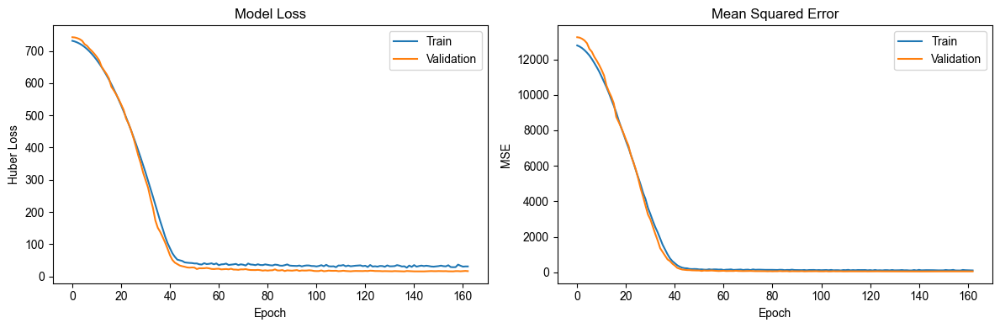

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 25.06
Validation MSE: 86.04
Validation MAE: 6.14


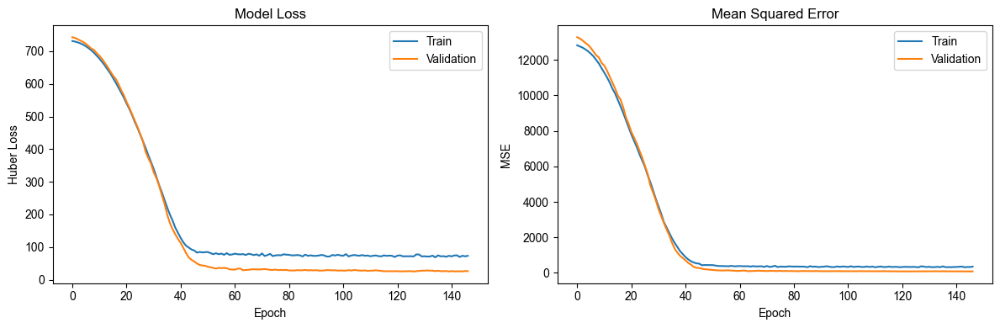

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 40.25
Validation MSE: 144.88
Validation MAE: 8.80


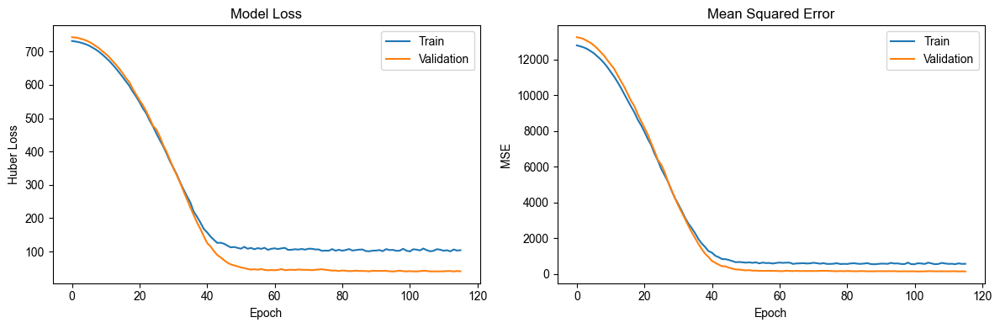

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.53
Validation MSE: 41.70
Validation MAE: 3.75


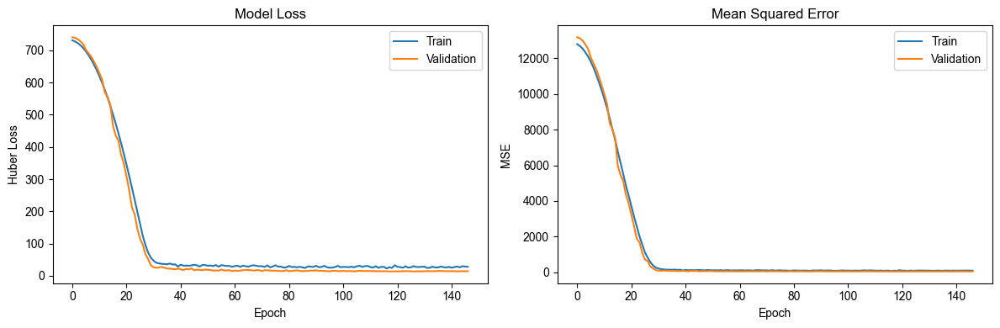

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 21.96
Validation MSE: 66.37
Validation MAE: 5.64


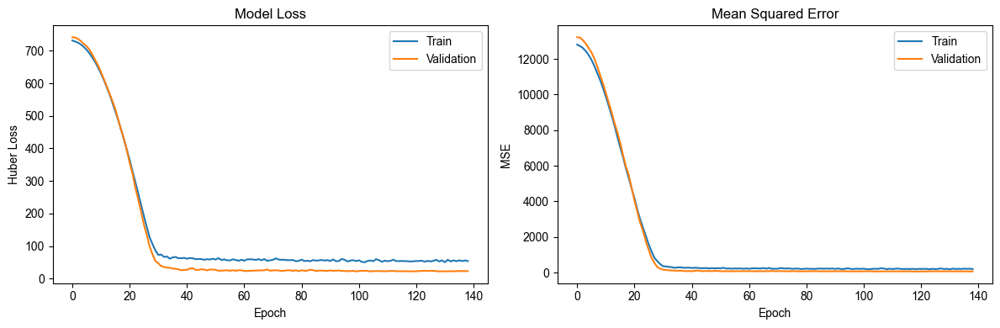

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 25.37
Validation MSE: 83.74
Validation MAE: 6.21


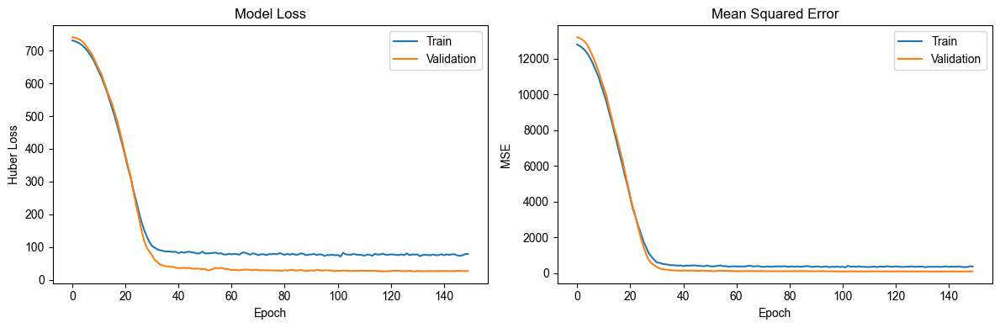

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.78
Validation MSE: 37.02
Validation MAE: 3.63


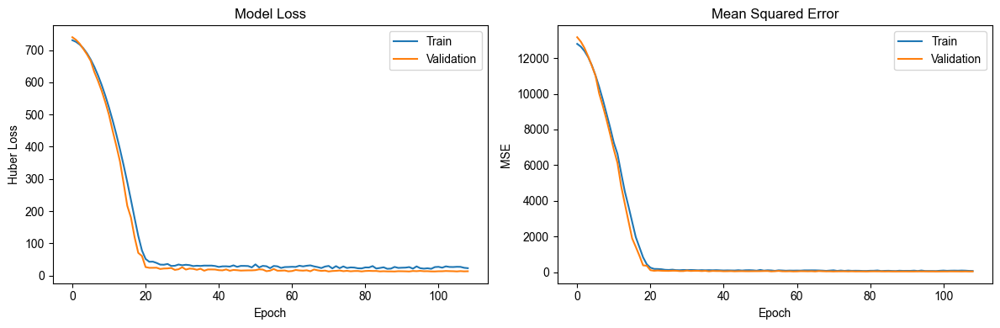

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 17.34
Validation MSE: 51.02
Validation MAE: 4.59


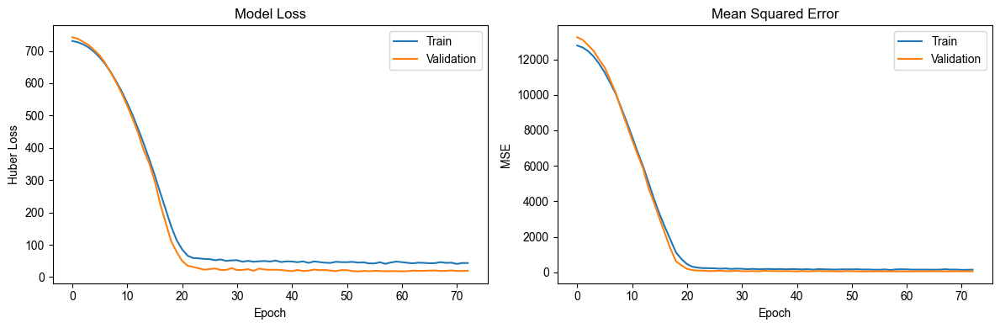

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 18.34
Validation MSE: 53.96
Validation MAE: 4.91


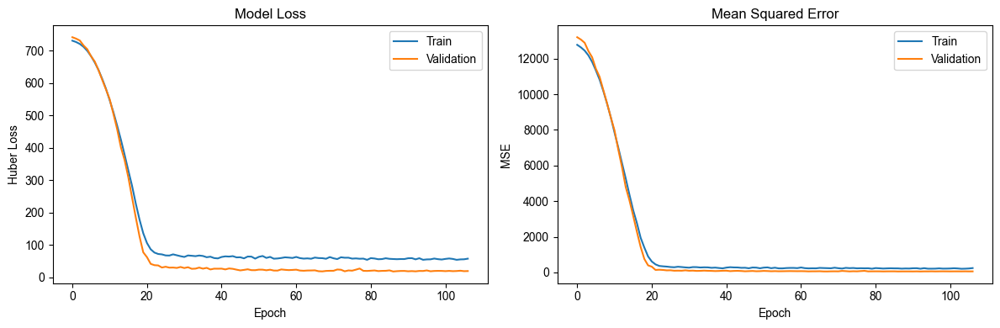

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.838951,7.534010,0.951138
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",5.868771,9.381503,0.924236
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]}",8.174735,11.462571,0.886895
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",3.835992,7.997769,0.944938
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",5.353357,8.569921,0.936778
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]}",5.676493,8.997647,0.930309
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.465747,6.418829,0.964533
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",4.557854,7.789110,0.947773
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",4.740945,8.008208,0.944794




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.732178,5.094875,0.964775
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.414630,6.393894,0.944523
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]}",6.483891,7.895615,0.915403
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.721503,4.536057,0.972078
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",4.267638,6.188756,0.948026
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]}",4.272234,6.130093,0.949006
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.843964,4.971061,0.966466
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.748633,6.048587,0.950353
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.928536,5.940536,0.952111


In [133]:
configs = [
    {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]},
    {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]},
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]},
]

_, _, _, _ = train_and_validate_FFNN_3d_model(num_neighbors = 3, train_dataset = train_dataset, configs = configs, random_seeds=[42])



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]} <<<<<

Validation Loss (Huber loss): 13.29
Validation MSE: 40.22
Validation MAE: 3.64


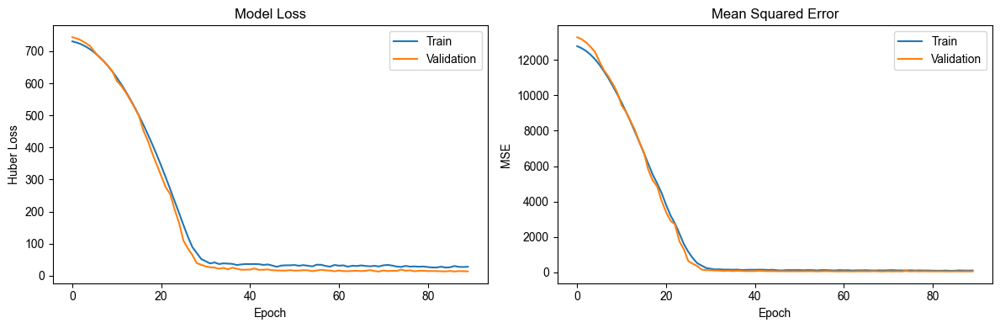

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]} <<<<<

Validation Loss (Huber loss): 16.46
Validation MSE: 134.69
Validation MAE: 3.95


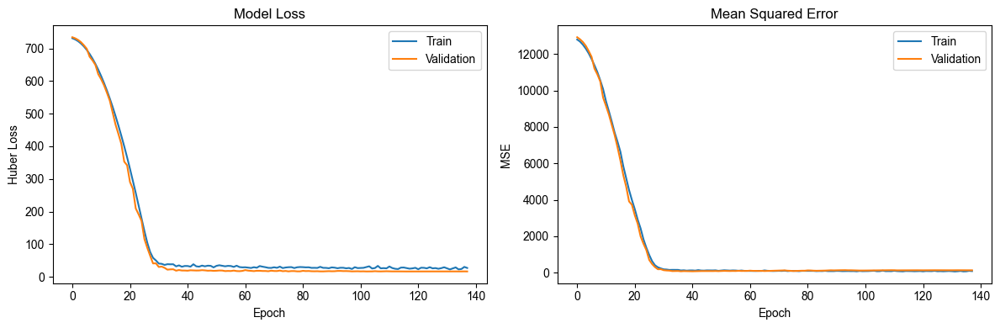

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]} <<<<<

Validation Loss (Huber loss): 25.22
Validation MSE: 356.05
Validation MAE: 5.68


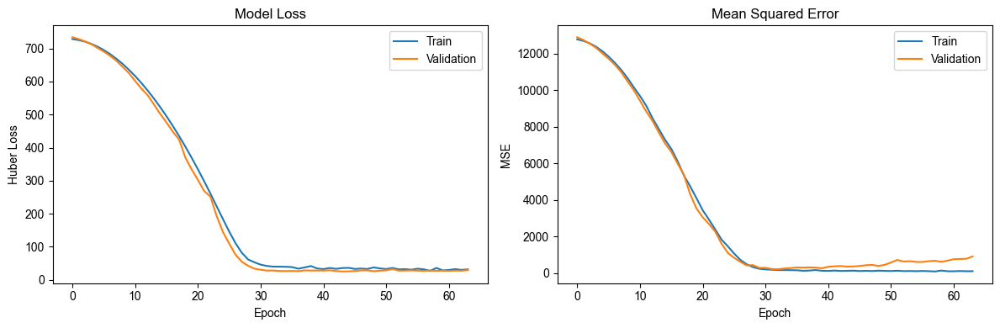

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]} <<<<<

Validation Loss (Huber loss): 21.19
Validation MSE: 214.64
Validation MAE: 4.72


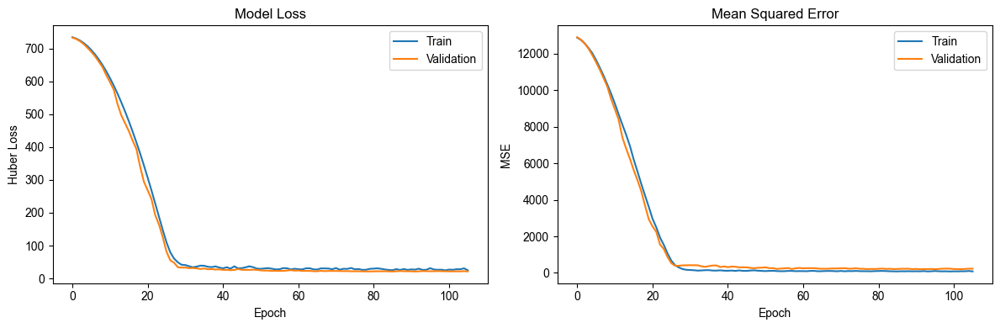

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]} <<<<<

Validation Loss (Huber loss): 17.10
Validation MSE: 63.55
Validation MAE: 4.27


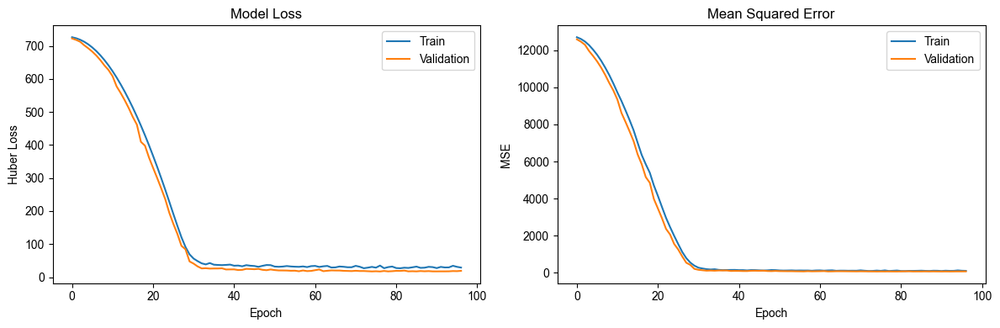

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor3.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",3.616744,7.700012,0.948961
"random_seed = 30_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",3.480321,7.796087,0.946692
"random_seed = 512_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",4.635433,10.865715,0.898770
"random_seed = 76_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",3.822302,9.325972,0.922865
"random_seed = 61_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",3.358003,5.906918,0.970783




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",2.447996,4.338699,0.974455
"random_seed = 30_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",2.800455,4.999599,0.968295
"random_seed = 512_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",3.491506,5.863167,0.951484
"random_seed = 76_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",3.277902,5.794494,0.955746
"random_seed = 61_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]}",2.689488,5.295701,0.960781


In [174]:
config = [
           {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0]},
           ]
train_results_df, train_results_tables, vali_results_df_n3, vali_results_tables_n3 = train_and_validate_FFNN_3d_model(num_neighbors = 3, train_dataset = train_dataset, 
                                                                              configs = config, 
                                                                              random_seeds=[42, 30, 512, 76, 61])


>>>>> Model information: FFNN 3D model with 3 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0] <<<<<

Performance of the model on training dataset
mae: 3.78 ± 0.51
rmse: 8.32 ± 1.87
r2: 0.94 ± 0.03

Performance of model on validation dataset
mae: 2.94 ± 0.43
rmse: 5.26 ± 0.63
r2: 0.96 ± 0.01

--------Training results plot--------


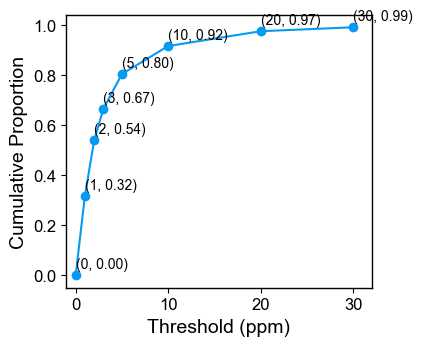


--------Validation results plot--------


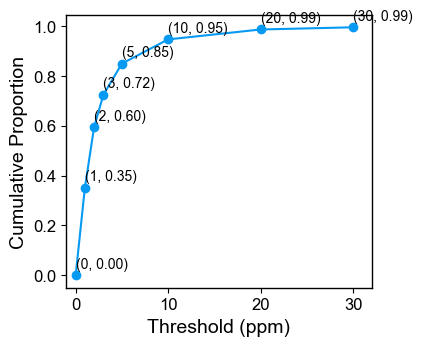


--------Training results scatter plot--------
R2 = 0.94
RMSE = 8.52
MAE = 3.7881159780180664


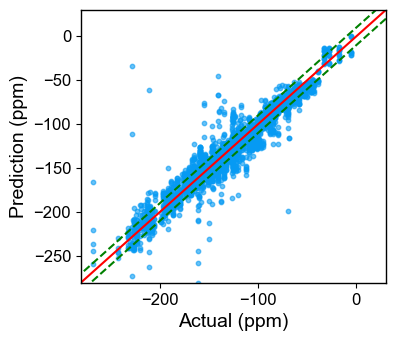


--------Validation results scatter plot--------
R2 = 0.96
RMSE = 5.26
MAE = 2.917584111895912


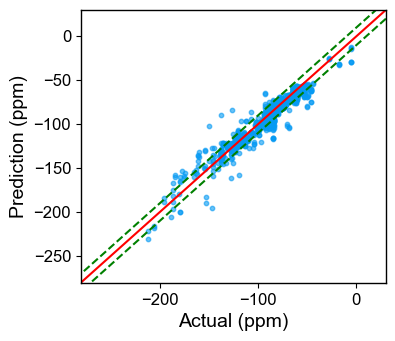

In [175]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n3, vali_results_df_n3,
                                              model_info= 'FFNN 3D model with 3 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0]')

del vali_results_tables_n3, vali_results_df_n3, train_results_tables, train_results_df

## 9.4 Spatially Neighboring atoms = 4



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 16.86
Validation MSE: 53.19
Validation MAE: 4.41


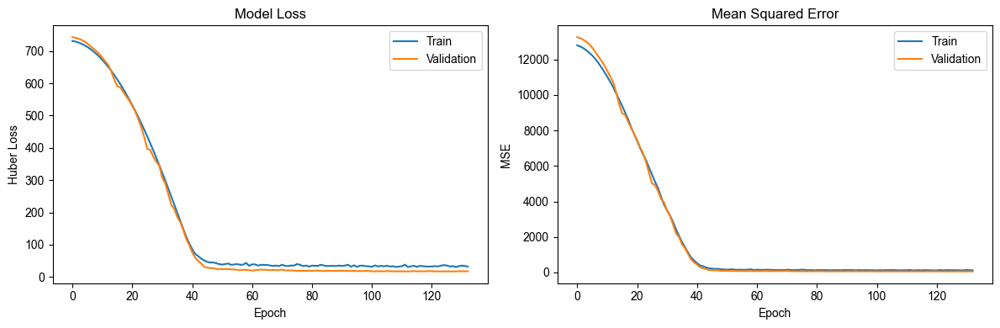

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 25.70
Validation MSE: 85.91
Validation MAE: 6.37


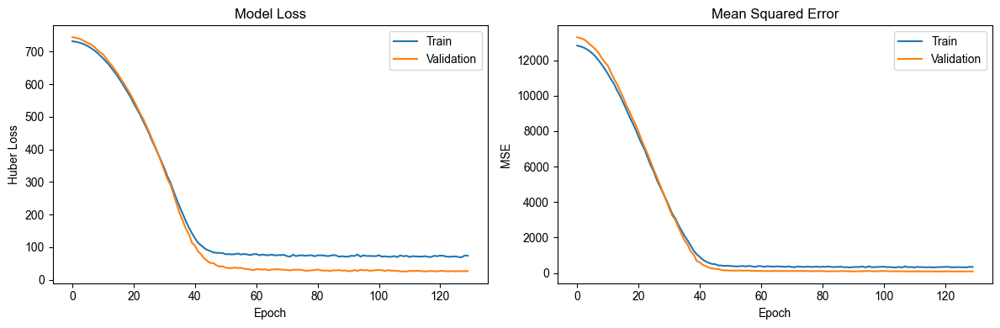

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 35.96
Validation MSE: 160.40
Validation MAE: 7.91


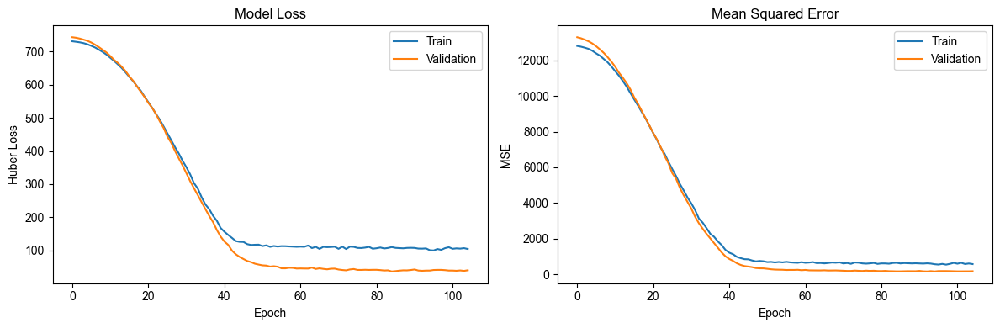

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.34
Validation MSE: 40.12
Validation MAE: 3.63


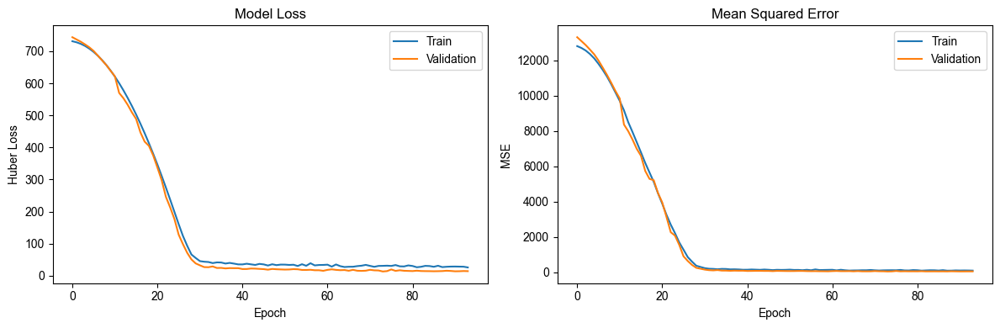

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 19.13
Validation MSE: 60.37
Validation MAE: 5.10


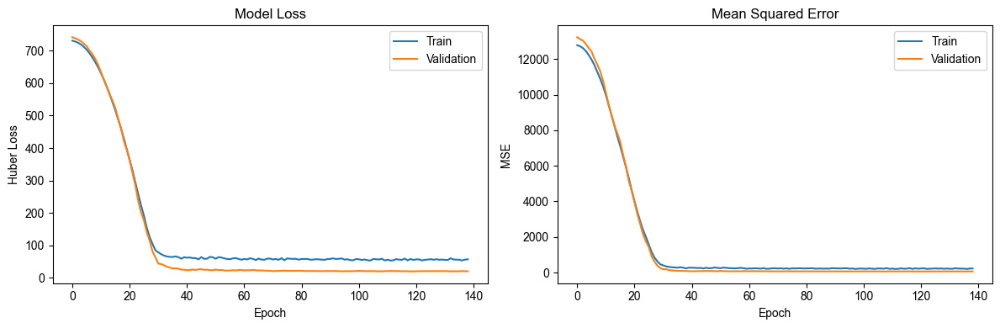

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 22.04
Validation MSE: 73.30
Validation MAE: 5.62


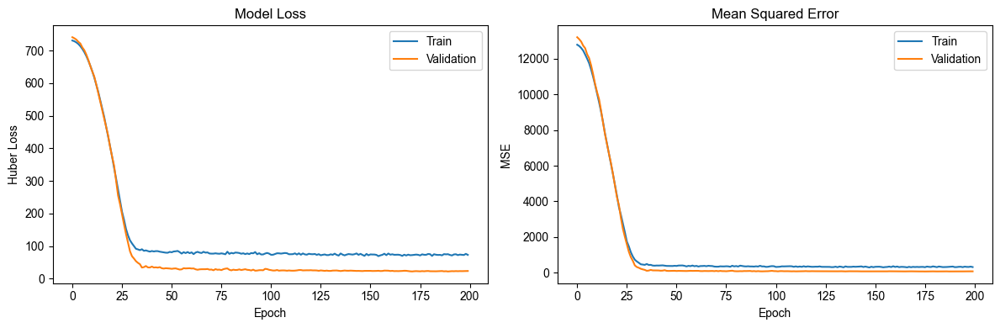

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 10.73
Validation MSE: 31.76
Validation MAE: 3.12


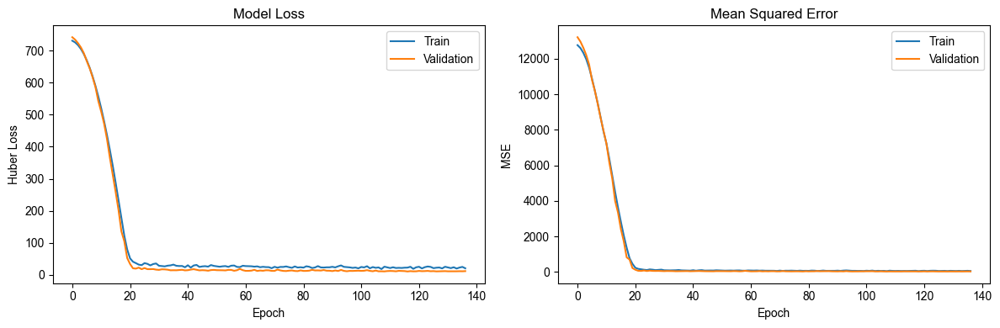

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 13.40
Validation MSE: 40.59
Validation MAE: 3.86


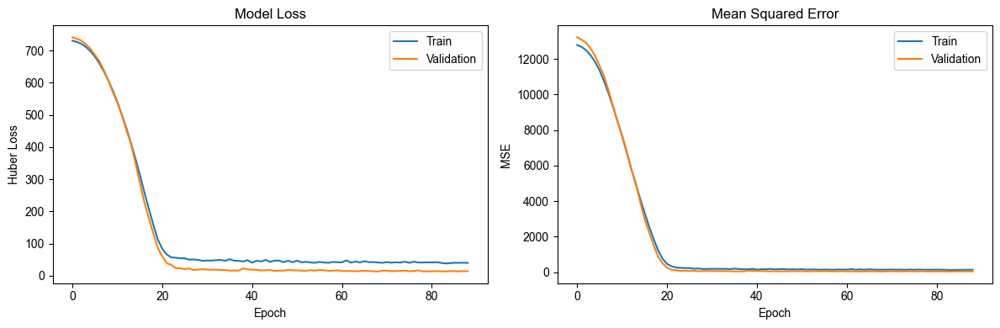

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 16.06
Validation MSE: 50.91
Validation MAE: 4.35


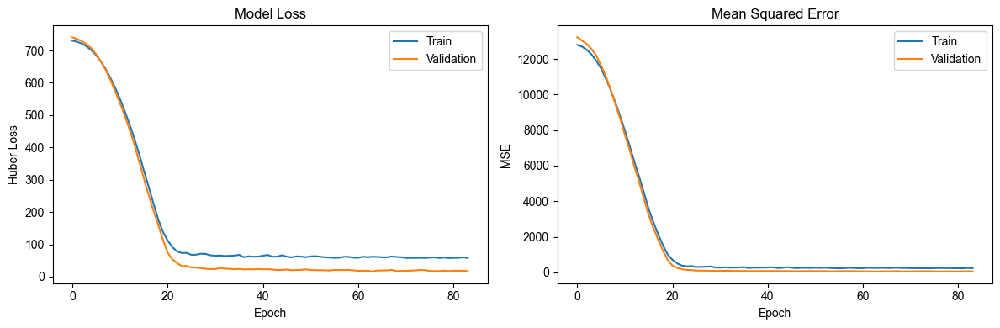

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.984785,6.948626,0.958436
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",5.736092,8.569853,0.936779
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]}",7.144716,11.592020,0.884326
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",3.523074,6.434442,0.964360
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",4.630267,7.423795,0.952557
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]}",4.991814,7.750169,0.948294
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.661608,5.455186,0.974383
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.709661,6.677732,0.961614
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",4.064883,6.889296,0.959143




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.897886,5.076638,0.965027
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.629579,6.054495,0.950256
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]}",4.923062,6.564019,0.941531
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.366363,4.207929,0.975972
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.506669,5.292093,0.961995
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]}",3.911616,5.630693,0.956976
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.242829,4.506404,0.972442
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.905830,5.198990,0.963321
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.030013,5.511554,0.958778


In [142]:
configs = [
    {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]},
    {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]},
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]},
]
_, _, _, _ = train_and_validate_FFNN_3d_model(num_neighbors = 4, train_dataset = train_dataset, configs = configs, random_seeds=[42])



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 12.88
Validation MSE: 38.54
Validation MAE: 3.72


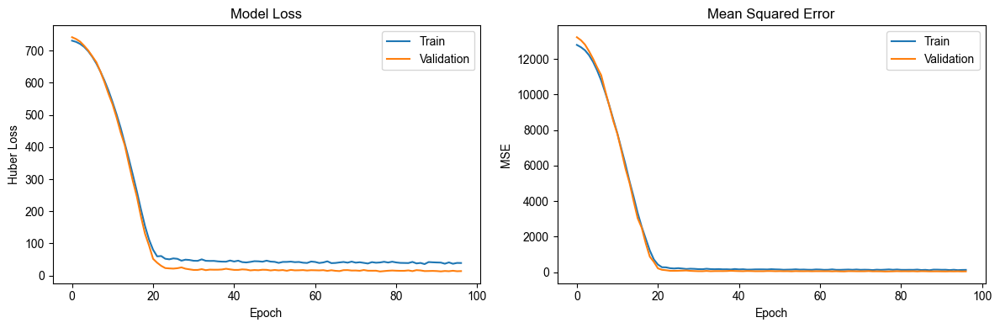

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 16.37
Validation MSE: 76.52
Validation MAE: 4.05


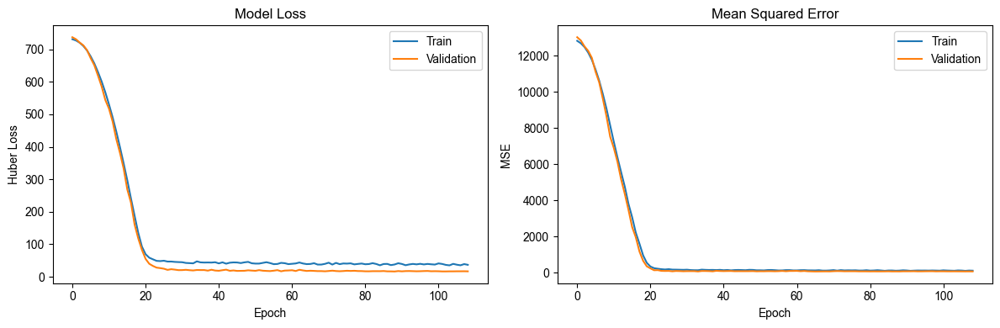

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 15.54
Validation MSE: 87.16
Validation MAE: 3.86


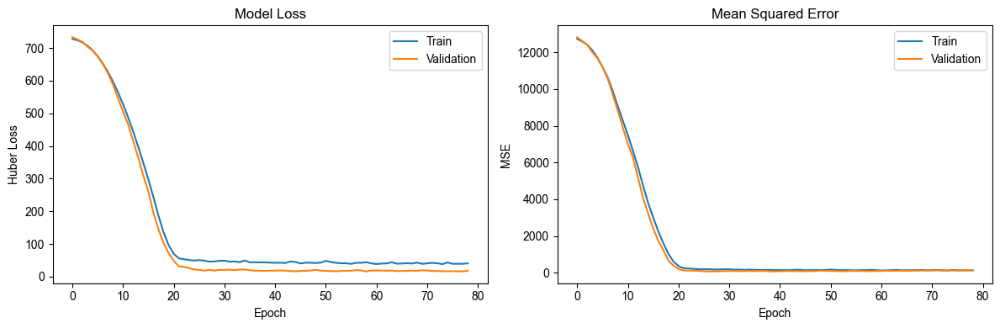

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 18.04
Validation MSE: 125.74
Validation MAE: 4.27


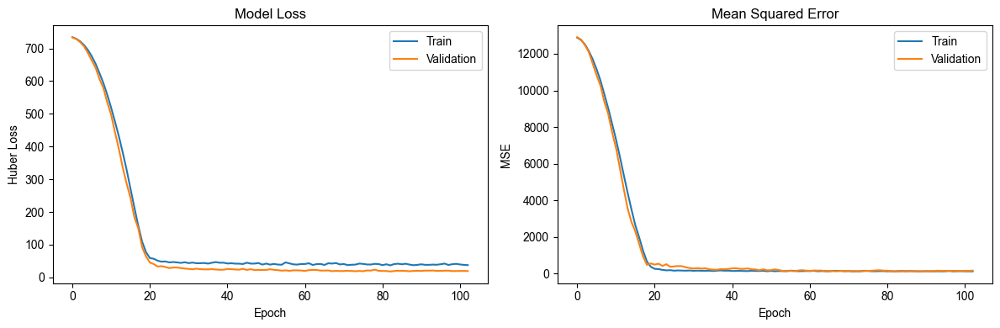

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 15.55
Validation MSE: 52.70
Validation MAE: 4.11


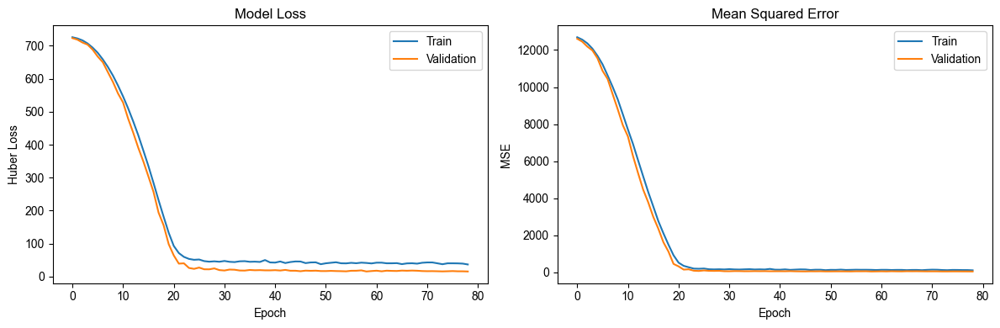

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor4.h5


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.657694,7.004740,0.957762
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.293944,6.450185,0.963509
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.240253,6.565793,0.963037
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.496164,7.641334,0.948215
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.426160,6.013782,0.969716




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",2.854671,5.124311,0.964367
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",2.745571,5.075896,0.967320
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.290449,6.688093,0.936872
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",2.986584,5.289863,0.963119
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",2.964621,5.556871,0.956818


In [ ]:
config = [
    {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]},
]

train_results_df, train_results_tables, vali_results_df_n4, vali_results_tables_n4 = train_and_validate_FFNN_3d_model(num_neighbors = 4, 
                                                                                                                      train_dataset = train_dataset, 
                                                                                                                      configs = config, 
                                                                                                                      random_seeds=[42, 30, 512, 76, 61])


>>>>> Model information: FFNN 3D model with 4 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.1] <<<<<

Performance of the model on training dataset
mae: 3.42 ± 0.17
rmse: 6.74 ± 0.62
r2: 0.96 ± 0.01

Performance of model on validation dataset
mae: 2.97 ± 0.20
rmse: 5.55 ± 0.67
r2: 0.96 ± 0.01

--------Training results plot--------


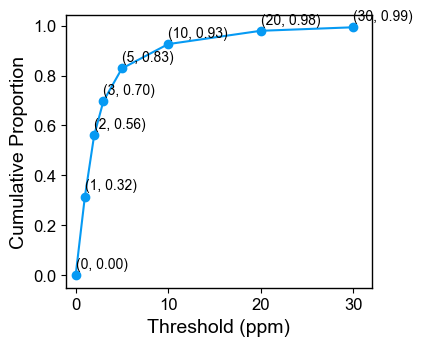


--------Validation results plot--------


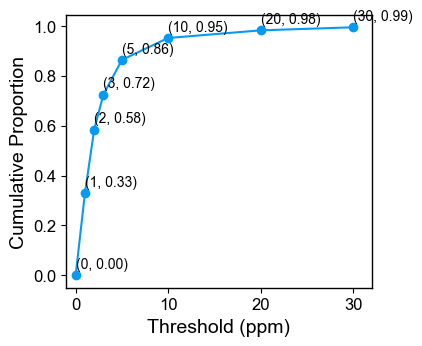


--------Training results scatter plot--------
R2 = 0.96
RMSE = 6.77
MAE = 3.4222060571058637


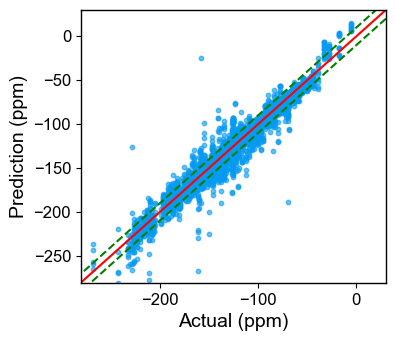


--------Validation results scatter plot--------
R2 = 0.96
RMSE = 5.57
MAE = 2.9652367231971497


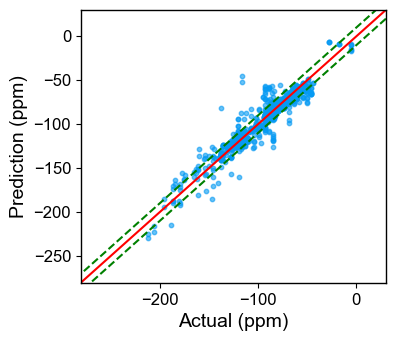

In [144]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n4, vali_results_df_n4,
                                                model_info= 'FFNN 3D model with 4 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.1]')

del vali_results_tables_n4, vali_results_df_n4, train_results_tables, train_results_df

## 9.5 Spatially Neighboring atoms = 5



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.82
Validation MSE: 41.25
Validation MAE: 3.79


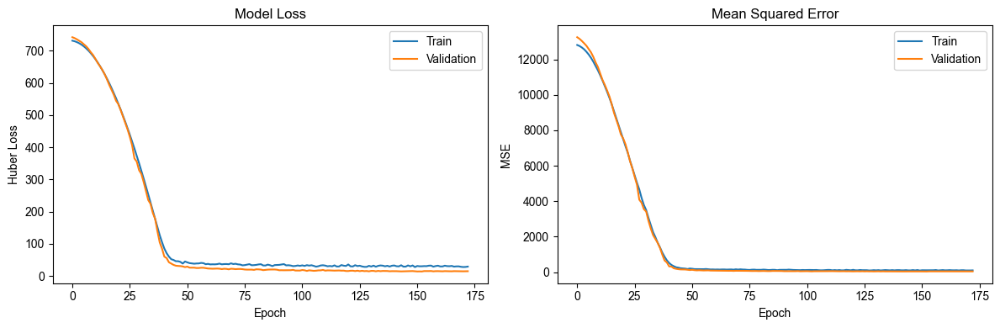

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 25.80
Validation MSE: 86.87
Validation MAE: 6.30


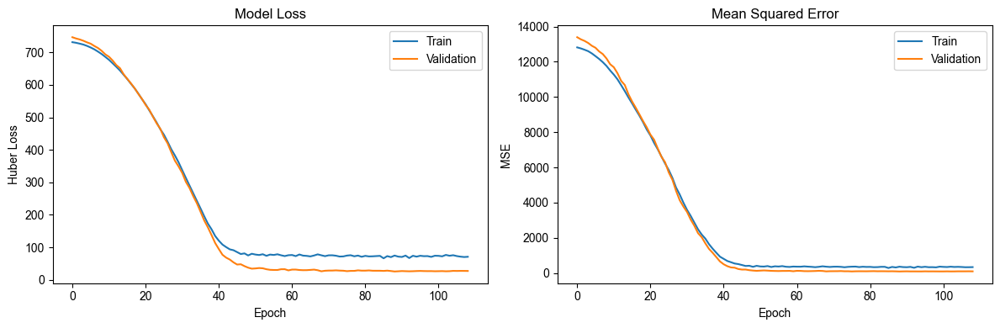

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 39.16
Validation MSE: 147.75
Validation MAE: 8.61


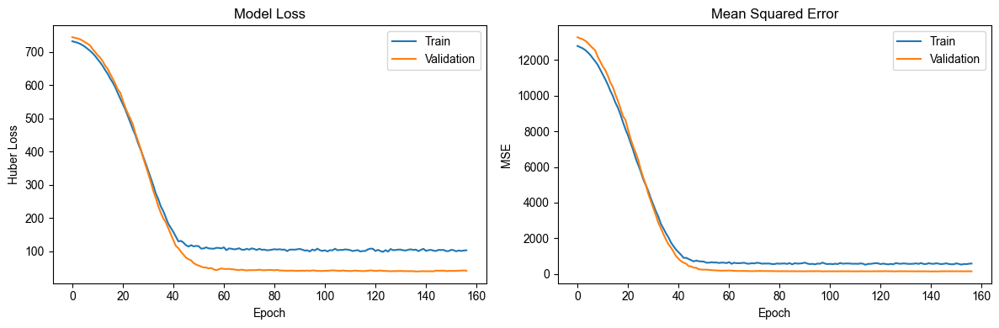

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.46
Validation MSE: 36.23
Validation MAE: 3.54


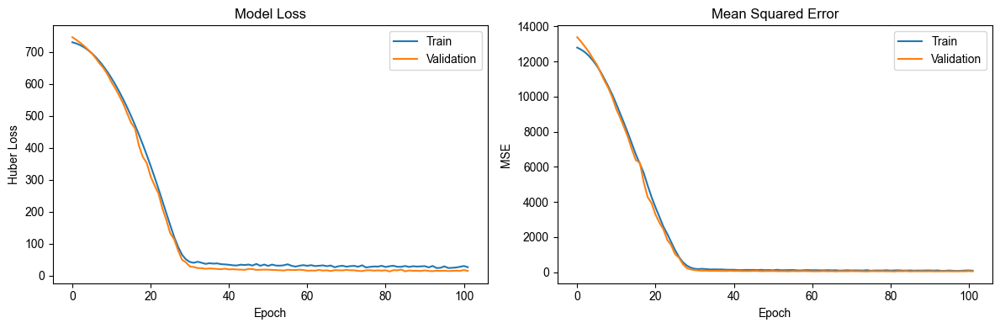

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 17.42
Validation MSE: 53.00
Validation MAE: 4.78


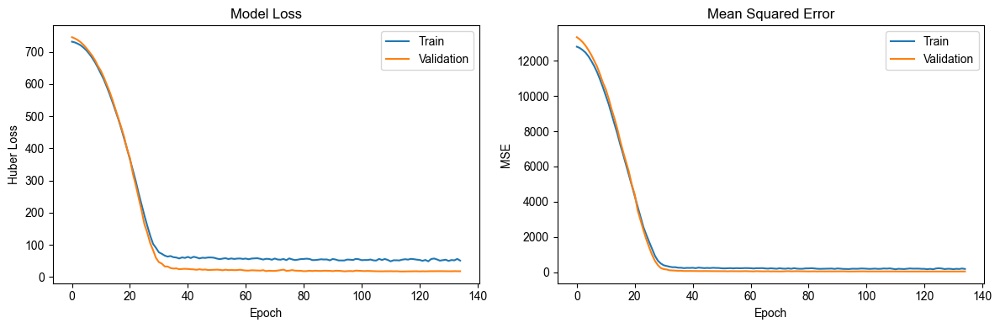

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 22.67
Validation MSE: 72.12
Validation MAE: 5.72


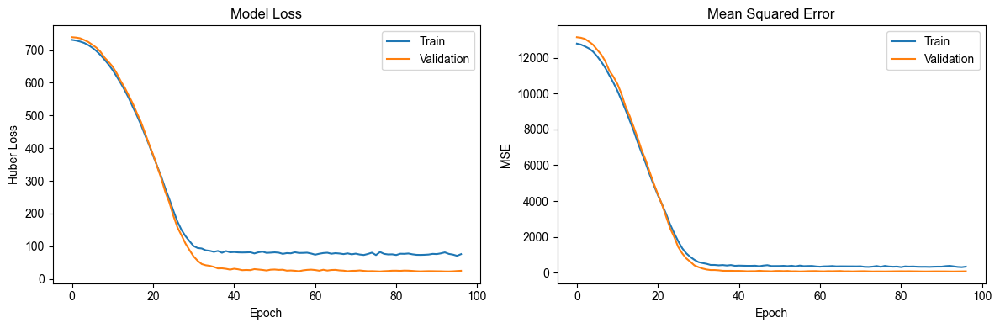

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 10.56
Validation MSE: 31.10
Validation MAE: 3.19


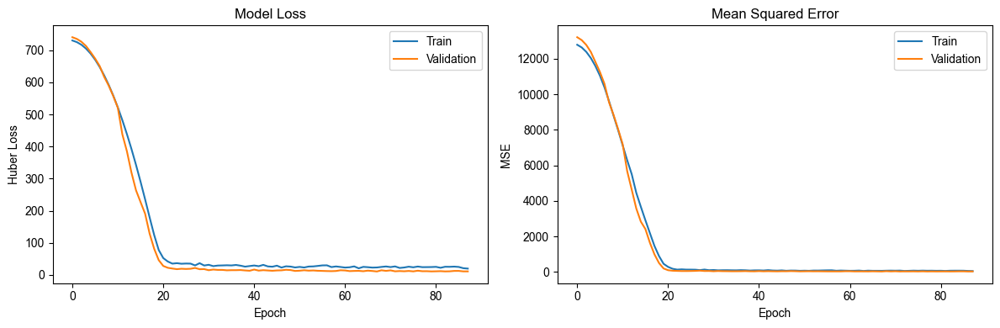

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 14.14
Validation MSE: 43.67
Validation MAE: 3.93


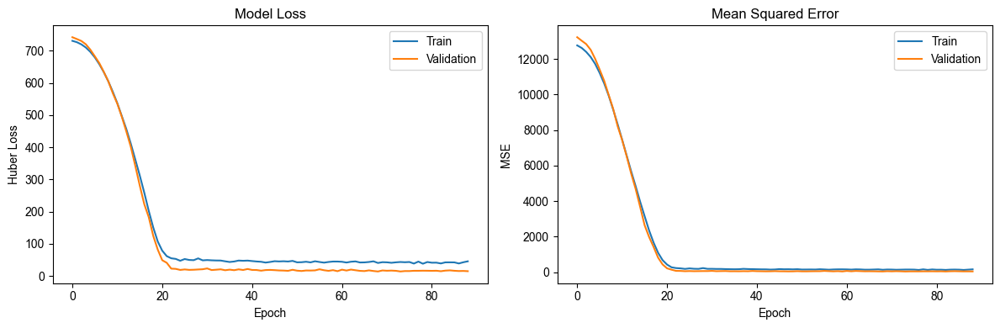

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 15.88
Validation MSE: 48.78
Validation MAE: 4.34


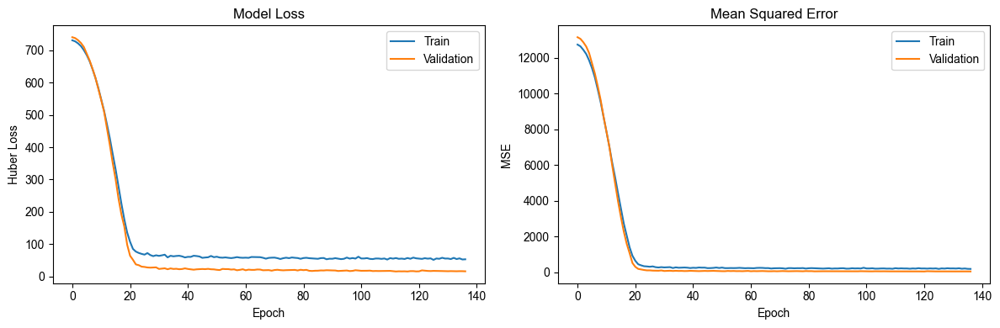

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step  


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.500374,6.360851,0.965171
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",5.495991,8.355668,0.939899
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]}",7.515354,10.779455,0.899975
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",3.298465,6.610184,0.962387
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",4.260767,7.003860,0.957773
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]}",5.034047,8.177697,0.942432
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.959509,5.851501,0.970525
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.624634,6.560306,0.962952
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.655028,6.277556,0.966077




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.694123,4.880425,0.967678
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.450470,6.600614,0.940878
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.4, 0.3, 0.2]}",5.998659,7.726402,0.918990
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.660785,4.833418,0.968298
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.609472,5.522852,0.958609
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.4, 0.3, 0.2]}",4.051831,6.065720,0.950072
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.397942,4.305053,0.974850
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.809508,4.833675,0.968294
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",2.844495,4.567048,0.971696


In [145]:
configs = [
    {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]},
]

_, _, _, _ = train_and_validate_FFNN_3d_model(num_neighbors = 5, train_dataset = train_dataset, configs = configs, random_seeds=[42])



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 11.29
Validation MSE: 32.97
Validation MAE: 3.30


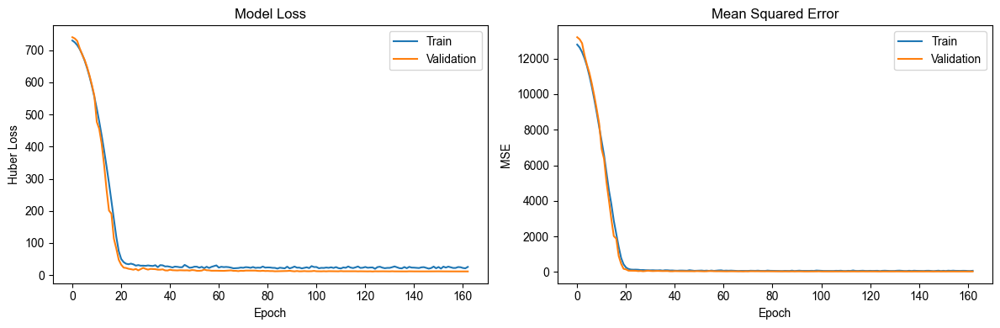

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 11.41
Validation MSE: 41.38
Validation MAE: 3.14


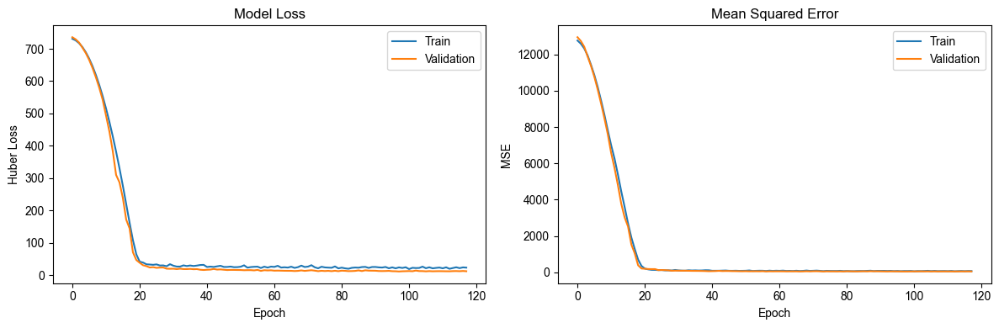

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.67
Validation MSE: 50.72
Validation MAE: 3.66


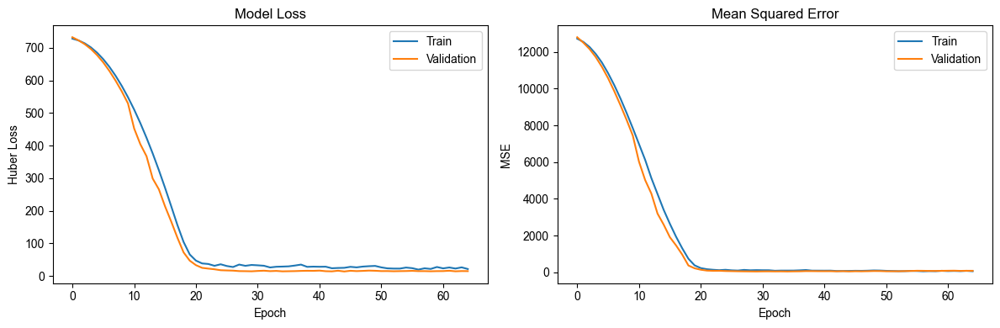

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 15.40
Validation MSE: 139.42
Validation MAE: 3.67


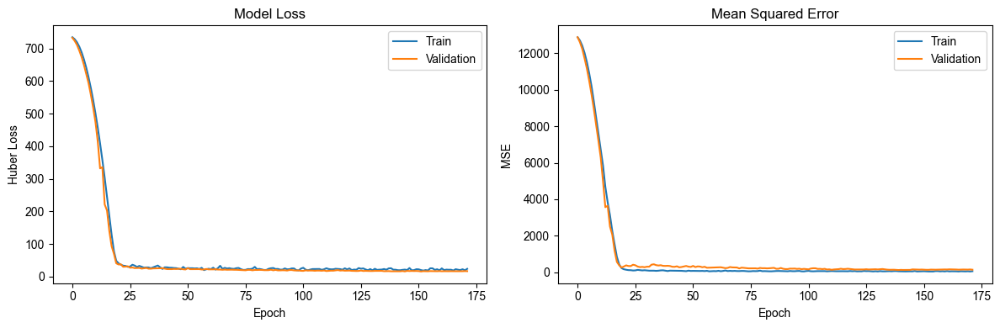

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.99
Validation MSE: 55.83
Validation MAE: 3.53


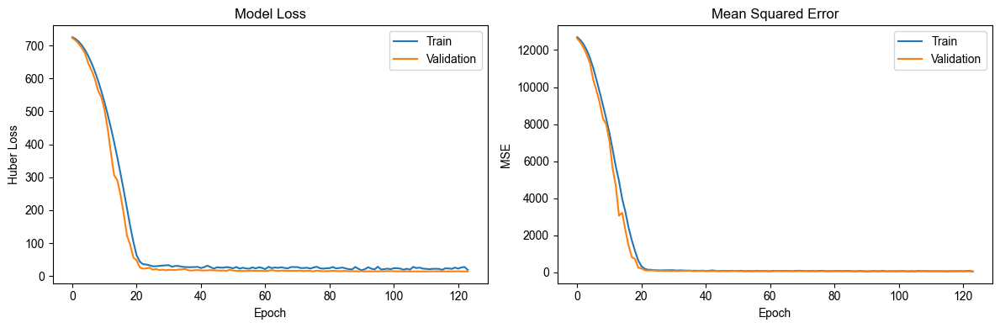

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor5.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.817016,5.387870,0.975011
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.620278,5.143765,0.976794
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.305345,6.131966,0.967760
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.503946,6.467092,0.962908
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.298565,4.510588,0.982963




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.480909,4.330348,0.974553
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.361667,4.121523,0.978453
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.056470,6.160183,0.946444
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.733447,5.095376,0.965781
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.627323,6.436608,0.942062


In [ ]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]

train_results_df, train_results_tables_n5, vali_results_df_n5, vali_results_tables_n5 = train_and_validate_FFNN_3d_model(num_neighbors = 5, 
                                                                                                                      train_dataset = train_dataset, 
                                                                                                                      configs = config, 
                                                                                                                      random_seeds=[42, 30, 512, 76, 61])


>>>>> Model information: FFNN 3D model with 5 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0] <<<<<

Performance of the model on training dataset
mae: 2.71 ± 0.38
rmse: 5.53 ± 0.78
r2: 0.97 ± 0.01

Performance of model on validation dataset
mae: 2.65 ± 0.27
rmse: 5.23 ± 1.05
r2: 0.96 ± 0.02

--------Training results plot--------


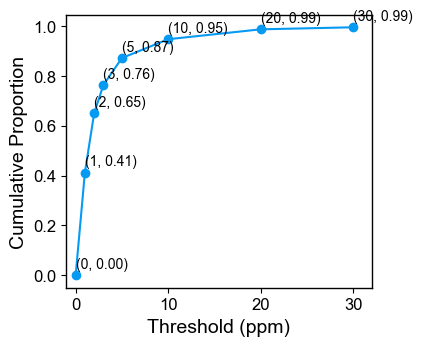


--------Validation results plot--------


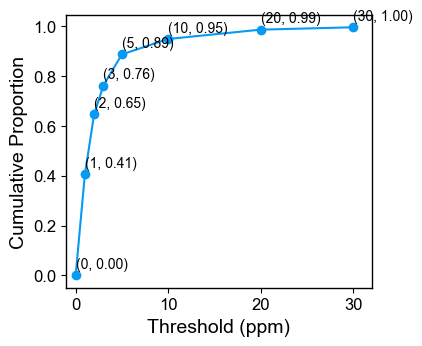


--------Training results scatter plot--------
R2 = 0.97
RMSE = 5.59
MAE = 2.711678267919224


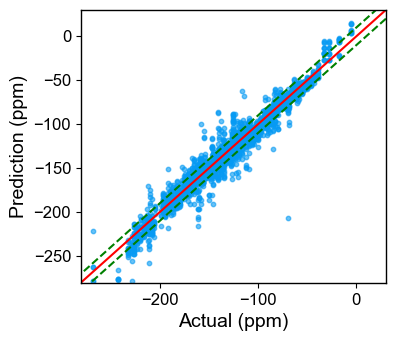


--------Validation results scatter plot--------
R2 = 0.96
RMSE = 5.34
MAE = 2.6457246188804455


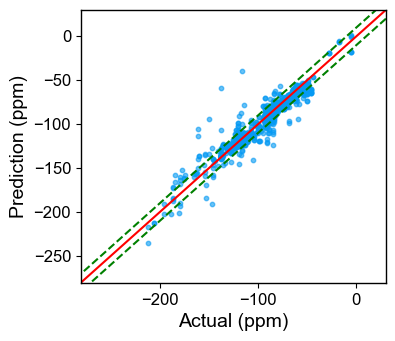

In [148]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n5, vali_results_df_n5,
                                                model_info= 'FFNN 3D model with 5 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0]')

del vali_results_tables_n5, vali_results_df_n5, train_results_tables_n5, train_results_df

## 9.6 Spatially Neighboring atoms = 6



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 17.48
Validation MSE: 57.85
Validation MAE: 4.41


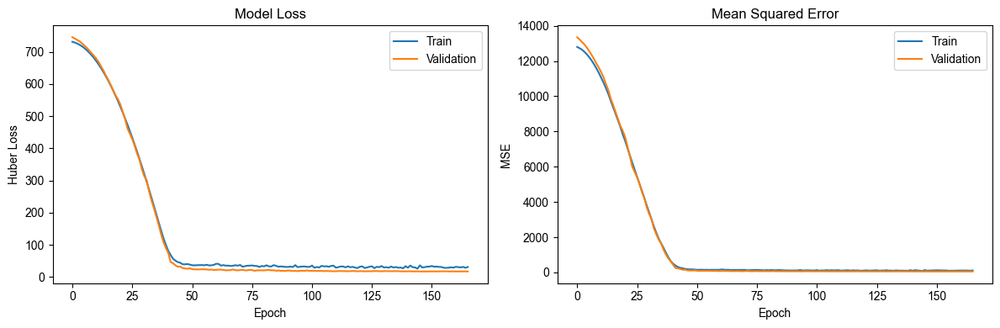

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 25.99
Validation MSE: 81.67
Validation MAE: 6.44


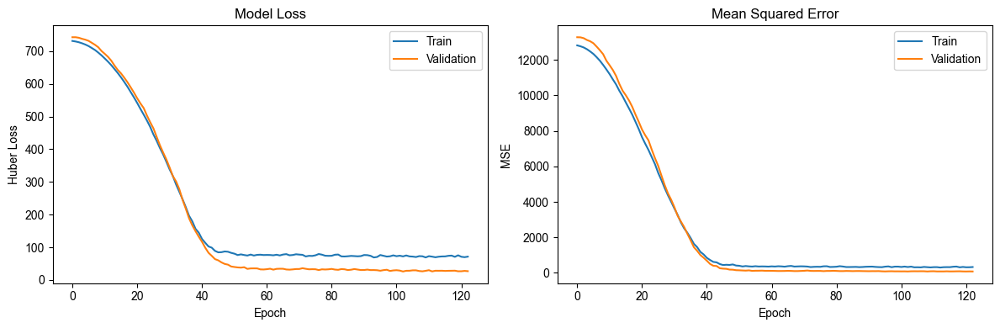

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 14.36
Validation MSE: 44.44
Validation MAE: 3.83


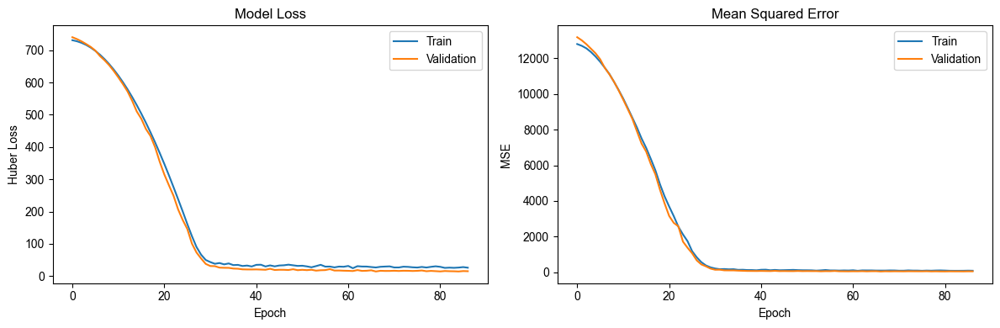

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 15.86
Validation MSE: 48.51
Validation MAE: 4.42


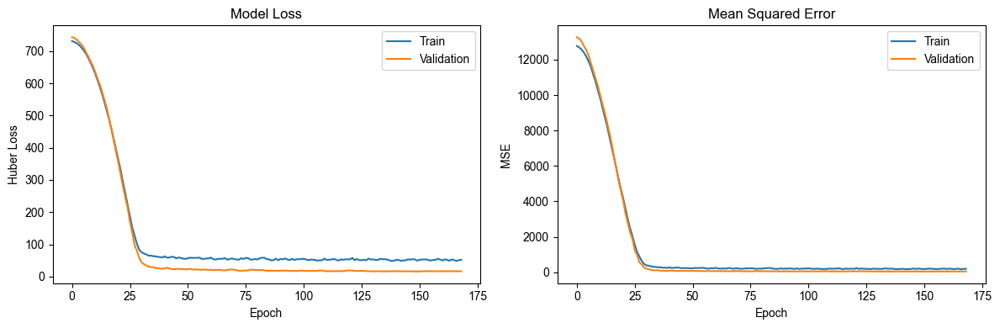

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 11.95
Validation MSE: 36.34
Validation MAE: 3.32


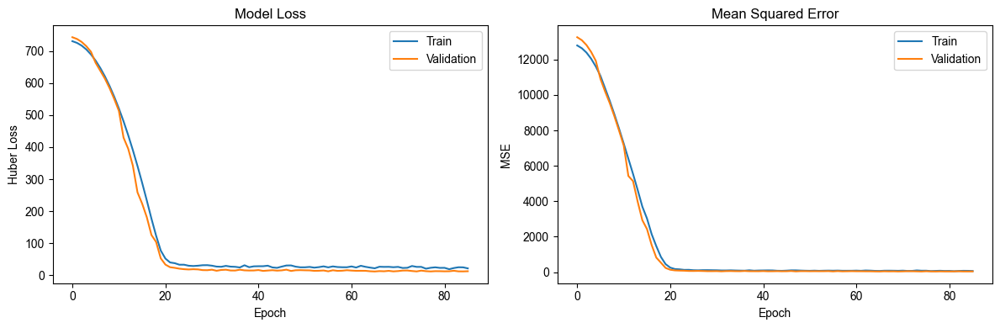

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 14.02
Validation MSE: 42.18
Validation MAE: 3.89


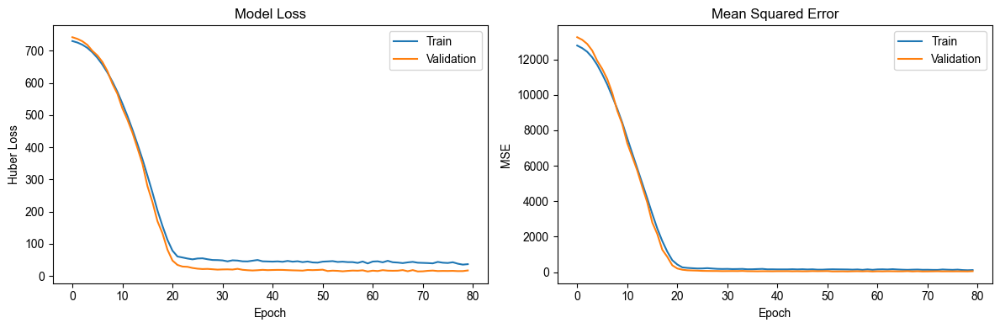

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 17.19
Validation MSE: 52.15
Validation MAE: 4.65


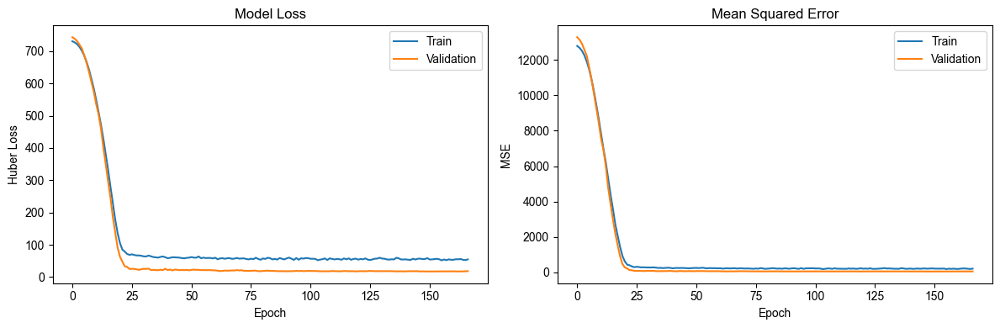

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.547749,6.225231,0.966640
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",5.648348,8.140743,0.942952
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",3.350544,5.963361,0.969388
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.668160,6.163747,0.967296
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.784290,5.323485,0.975605
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.528130,6.624770,0.962220
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.797464,6.297139,0.965865




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.902455,4.870829,0.967805
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",5.006578,6.829324,0.936709
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.780769,4.771754,0.969101
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.175318,5.285147,0.962095
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.387551,4.466209,0.972932
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.682170,4.344846,0.974383
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.221726,4.835622,0.968269


In [149]:
configs = [
    {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]},
]

_, _, _, _ = train_and_validate_FFNN_3d_model(num_neighbors = 6, train_dataset = train_dataset, configs = configs, random_seeds=[42])



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 14.29
Validation MSE: 44.16
Validation MAE: 3.92


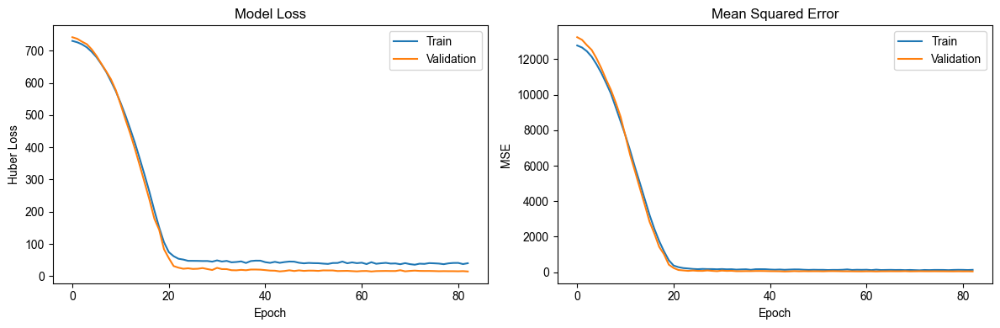

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 14.25
Validation MSE: 49.16
Validation MAE: 3.77


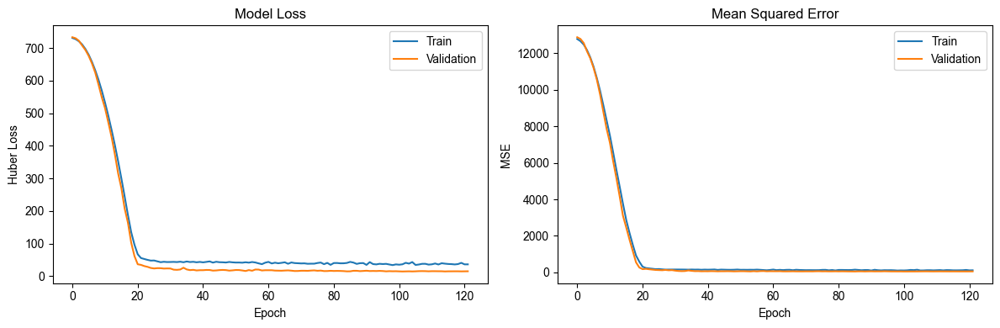

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 12.34
Validation MSE: 38.74
Validation MAE: 3.77


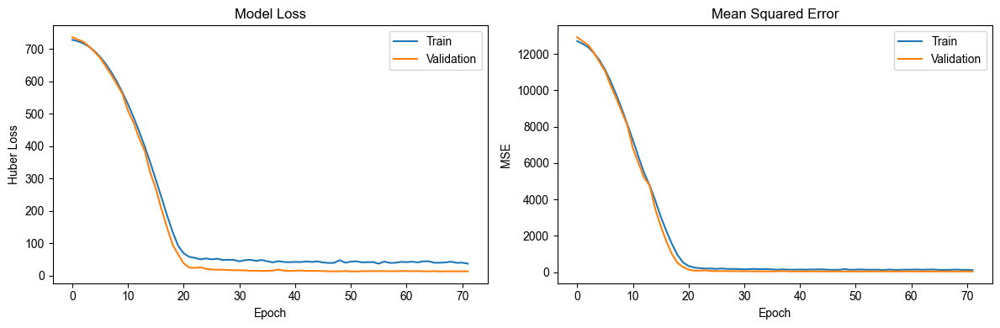

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 16.22
Validation MSE: 108.68
Validation MAE: 4.04


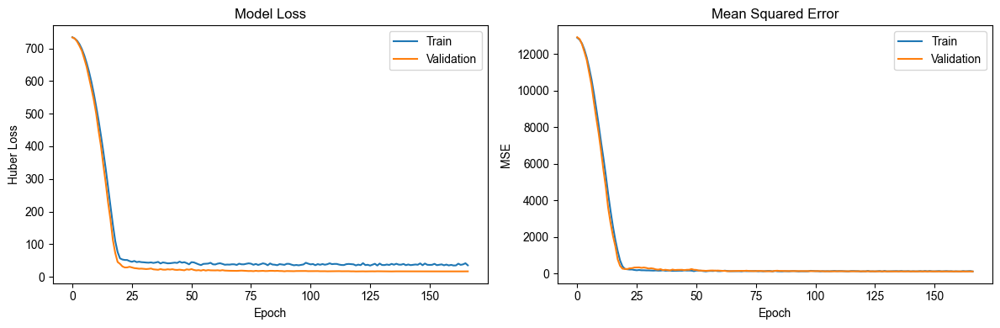

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]} <<<<<

Validation Loss (Huber loss): 13.05
Validation MSE: 45.80
Validation MAE: 3.57


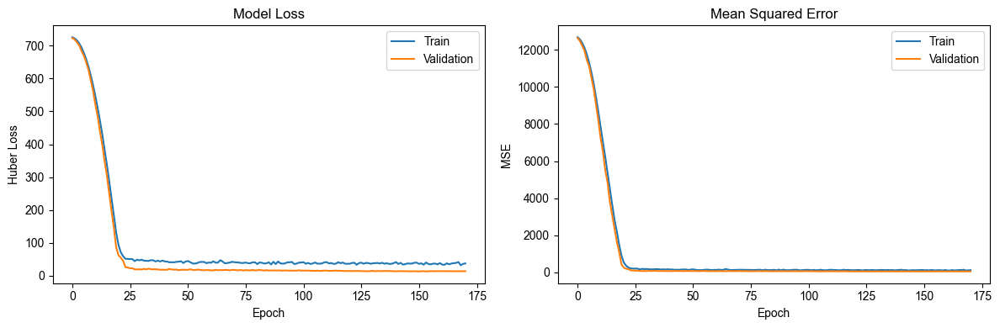

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor6.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


-----Training results-----



{"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}": {'mae': 3.25854167031446,
  'rmse': 5.602064485835883,
  'r2': 0.9729845457096605},
 "random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}": {'mae': 2.9730738983200733,
  'rmse': 5.879081028662252,
  'r2': 0.9696849635277865},
 "random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}": {'mae': 3.4321171798941323,
  'rmse': 5.9961926845247255,
  'r2': 0.9691722040642261},
 "random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}": {'mae': 2.855133611623774,
  'rmse': 6.441308049169494,
  'r2': 0.9632028938192612},
 "random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}": {'mae': 2.480074098831976,
  'rmse': 4.6215890088636655,
  'r2': 0.9821144988653755}}



-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",2.864859,4.636659,0.970826
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",2.688524,5.105066,0.966943
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.400436,5.948178,0.950067
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",3.032897,5.399288,0.961577
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.1]}",2.750702,5.543986,0.957018


In [ ]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]

train_results_df, train_results_tables, vali_results_df_n6, vali_results_tables_n6 = train_and_validate_FFNN_3d_model(num_neighbors = 6, 
                                                                                                                      train_dataset = train_dataset, 
                                                                                                                      configs = config, 
                                                                                                                      random_seeds=[42, 30, 512, 76, 61])


>>>>> Model information: FFNN 3D model with 6 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.1] <<<<<

Performance of the model on training dataset
mae: 3.00 ± 0.37
rmse: 5.71 ± 0.68
r2: 0.97 ± 0.01

Performance of model on validation dataset
mae: 2.95 ± 0.29
rmse: 5.33 ± 0.49
r2: 0.96 ± 0.01

--------Training results plot--------


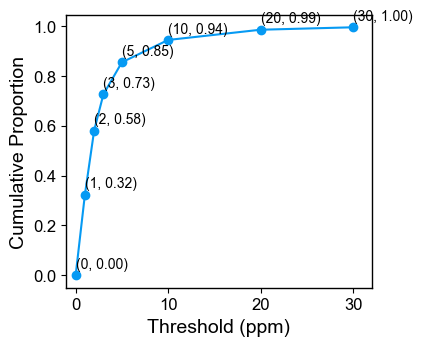


--------Validation results plot--------


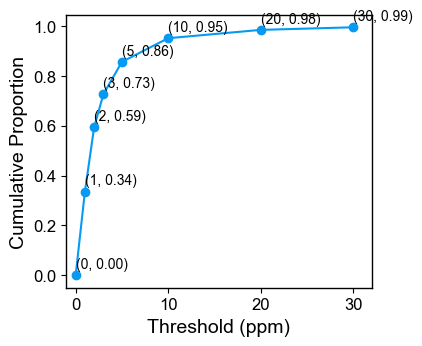


--------Training results scatter plot--------
R2 = 0.97
RMSE = 5.75
MAE = 3.0030752111826726


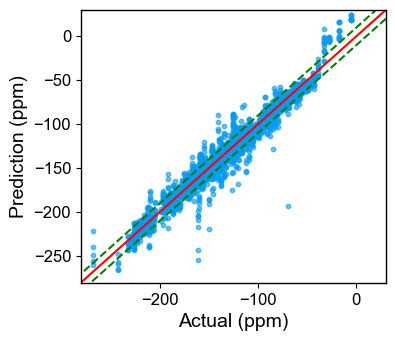


--------Validation results scatter plot--------
R2 = 0.96
RMSE = 5.34
MAE = 2.9366229619429136


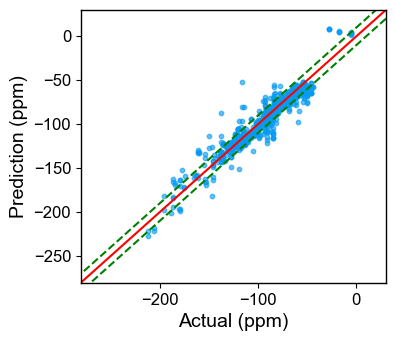

In [ ]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n6, vali_results_df_n6,
                                                model_info= 'FFNN 3D model with 6 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.1]')

del vali_results_tables_n6, vali_results_df_n6, train_results_tables, train_results_df

## 9.7 Spatially Neighboring atoms = 7



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 14.64
Validation MSE: 44.44
Validation MAE: 4.00


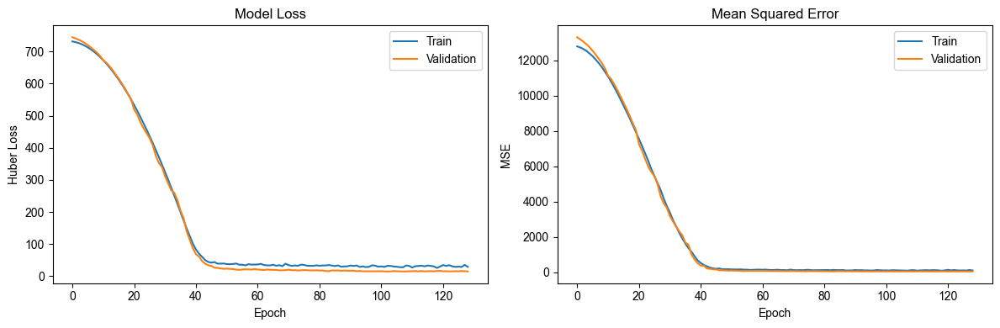

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 24.75
Validation MSE: 81.91
Validation MAE: 6.11


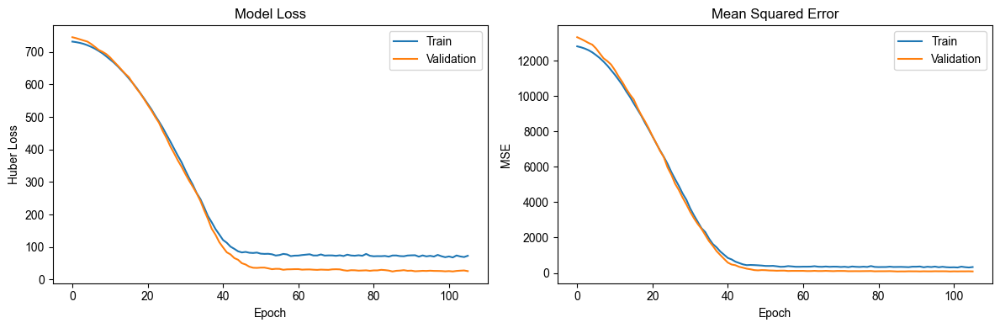

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.41
Validation MSE: 40.37
Validation MAE: 3.77


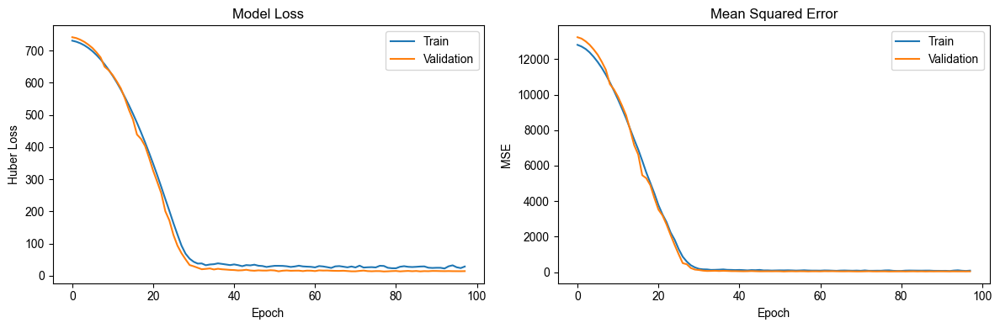

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 14.88
Validation MSE: 44.92
Validation MAE: 4.10


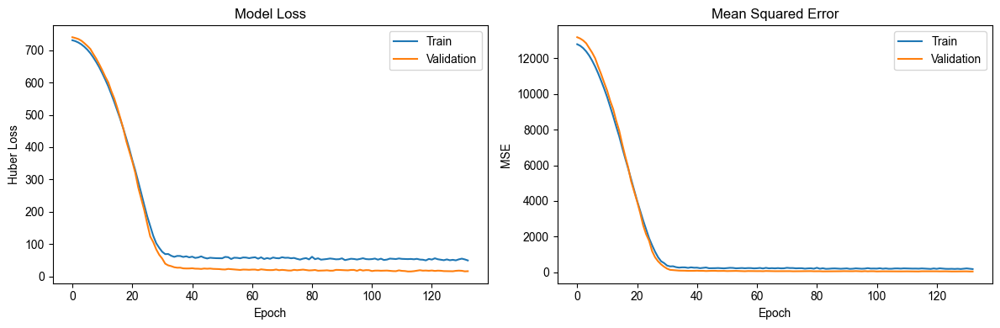

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 11.72
Validation MSE: 37.21
Validation MAE: 3.31


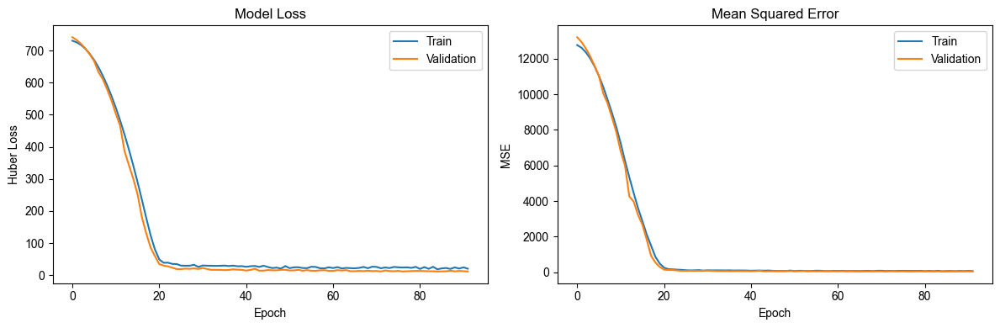

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 13.93
Validation MSE: 39.72
Validation MAE: 3.87


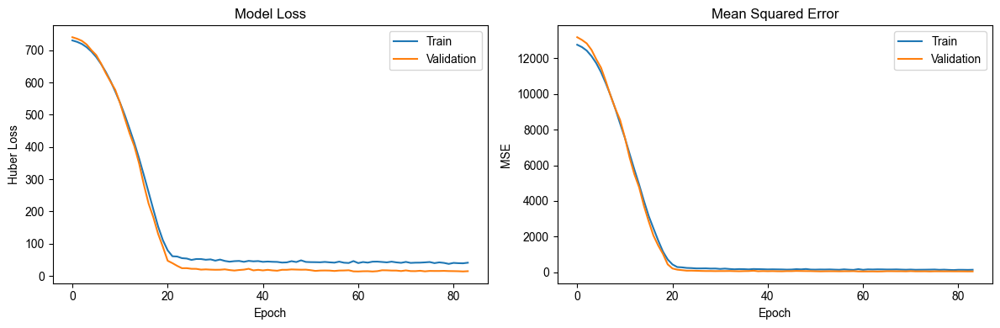

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 18.29
Validation MSE: 55.32
Validation MAE: 4.87


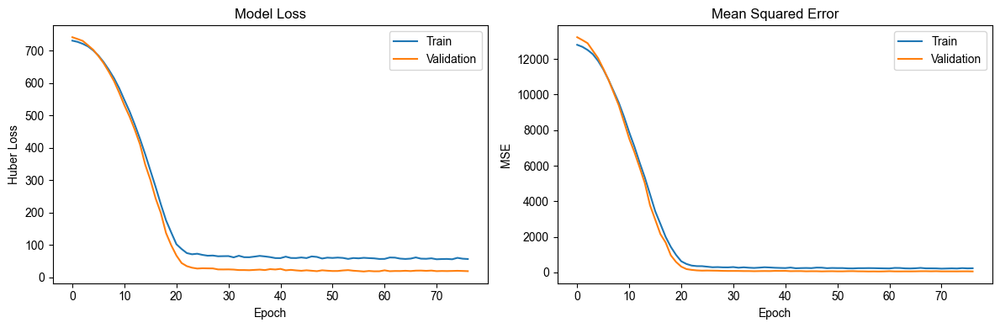

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.422853,5.896305,0.970072
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",5.239048,8.012435,0.944736
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.958892,5.477965,0.974168
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.516690,6.682667,0.961557
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.587700,4.826641,0.979946
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.488032,7.088155,0.956750
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",4.221159,7.035402,0.957392




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.073846,5.430484,0.959982
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.485225,6.791764,0.937404
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.754105,4.808909,0.968618
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.208682,5.398628,0.960450
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.510771,4.515042,0.972337
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.005750,5.435487,0.959908
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.522197,5.797279,0.954393


In [153]:
_, _, _, _ = train_and_validate_FFNN_3d_model(num_neighbors = 7, train_dataset = train_dataset, configs = configs, random_seeds=[42])



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.55
Validation MSE: 39.80
Validation MAE: 3.40


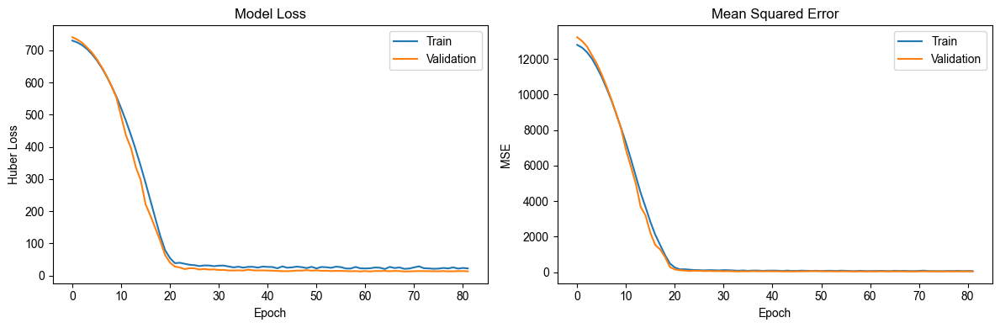

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.90
Validation MSE: 46.13
Validation MAE: 3.61


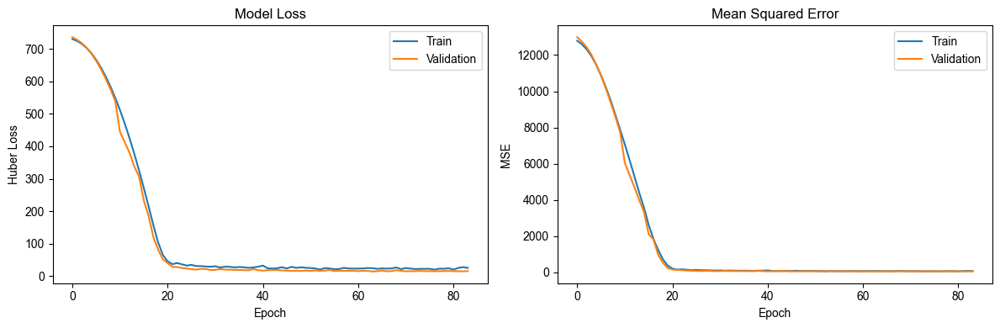

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.34
Validation MSE: 48.75
Validation MAE: 3.30


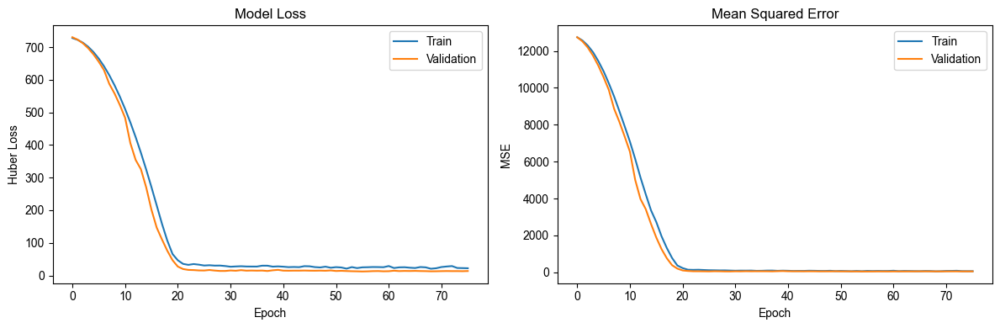

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 15.76
Validation MSE: 136.75
Validation MAE: 3.74


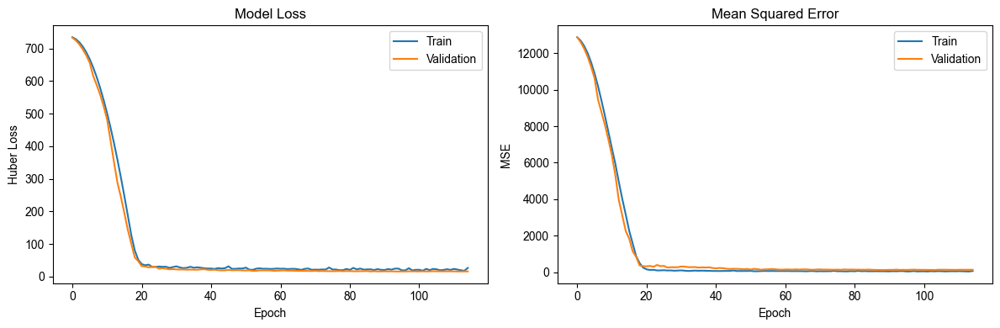

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.68
Validation MSE: 52.85
Validation MAE: 3.49


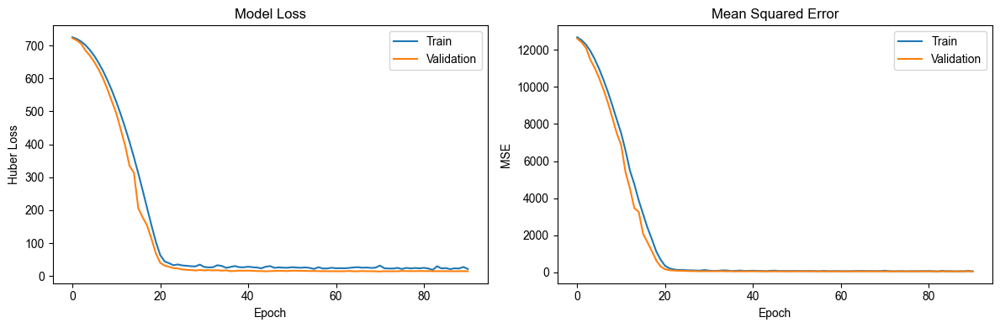

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor7.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.657628,5.415139,0.974757
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.919053,5.667880,0.971824
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.649624,5.320603,0.975728
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.477446,6.302027,0.964777
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.337135,4.657436,0.981836




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.424561,4.774121,0.969071
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.605116,4.585263,0.973332
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.917110,5.728584,0.953686
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.799806,5.132947,0.965274
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.591105,5.637958,0.955548


In [154]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]

train_results_df, train_results_tables, vali_results_df_n7, vali_results_tables_n7 = train_and_validate_FFNN_3d_model(num_neighbors = 7, 
                                                                                                                      train_dataset = train_dataset, 
                                                                                                                      configs = config, 
                                                                                                                      random_seeds=[42, 30, 512, 76, 61])


>>>>> Model information: FFNN 3D model with 7 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0] <<<<<

Performance of the model on training dataset
mae: 2.61 ± 0.22
rmse: 5.47 ± 0.60
r2: 0.97 ± 0.01

Performance of model on validation dataset
mae: 2.67 ± 0.19
rmse: 5.17 ± 0.51
r2: 0.96 ± 0.01

--------Training results plot--------


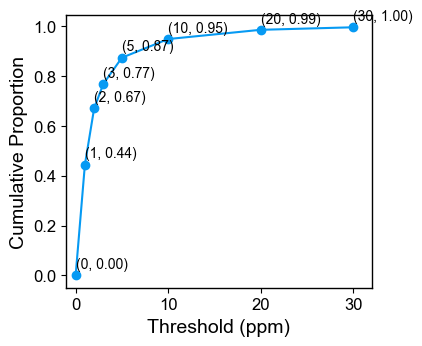


--------Validation results plot--------


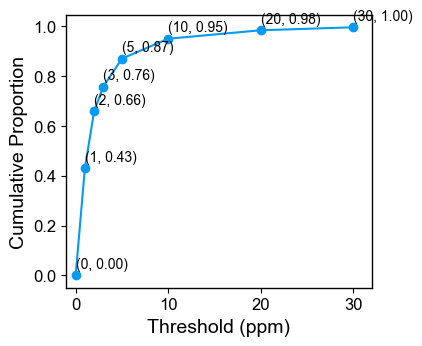


--------Training results scatter plot--------
R2 = 0.97
RMSE = 5.51
MAE = 2.609691414085227


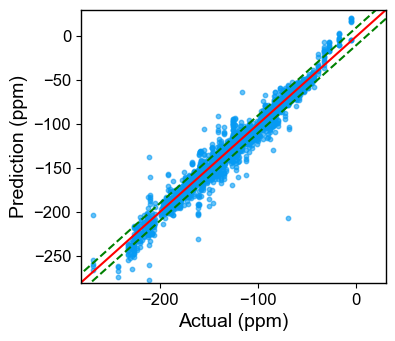


--------Validation results scatter plot--------
R2 = 0.96
RMSE = 5.20
MAE = 2.658112997563038


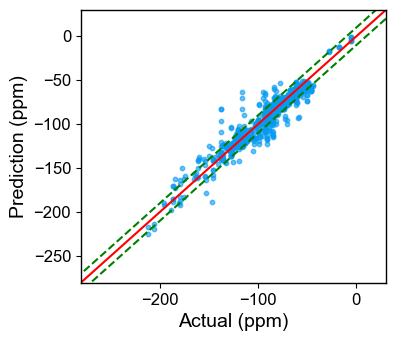

In [155]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n7, vali_results_df_n7,
                                                model_info= 'FFNN 3D model with 7 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0]')

del vali_results_tables_n7, vali_results_df_n7, train_results_tables, train_results_df

## 9.8 Spatially Neighboring atoms = 10



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 16.74
Validation MSE: 51.75
Validation MAE: 4.36


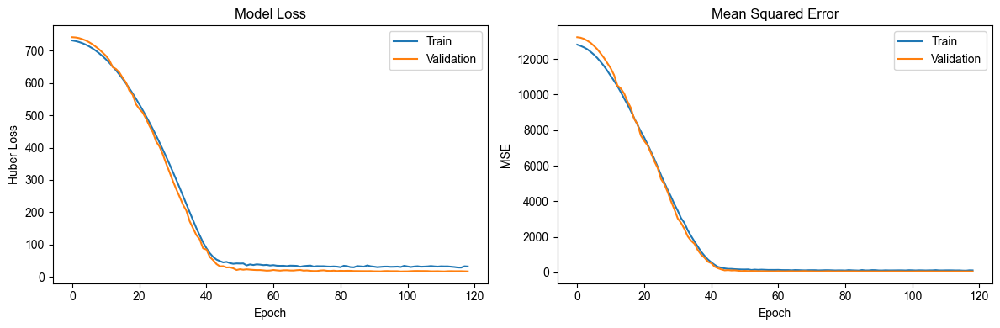

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 24.80
Validation MSE: 83.17
Validation MAE: 6.08


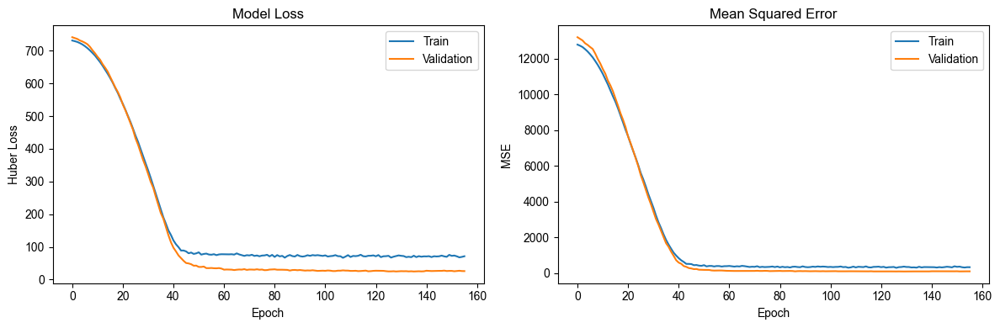

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.30
Validation MSE: 40.71
Validation MAE: 3.67


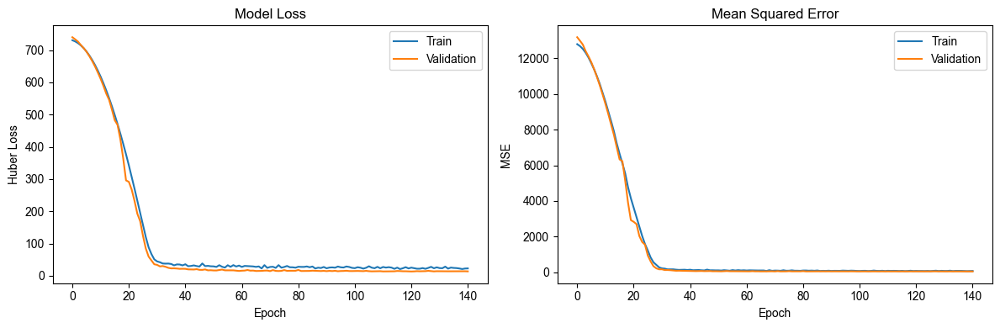

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 20.85
Validation MSE: 64.39
Validation MAE: 5.39


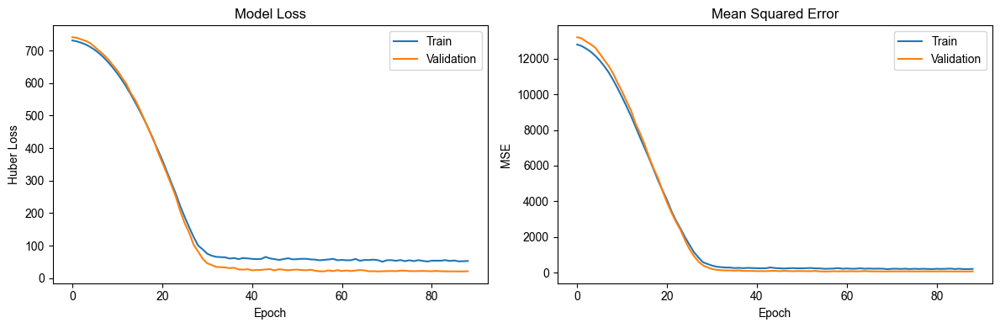

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 10.89
Validation MSE: 31.85
Validation MAE: 3.15


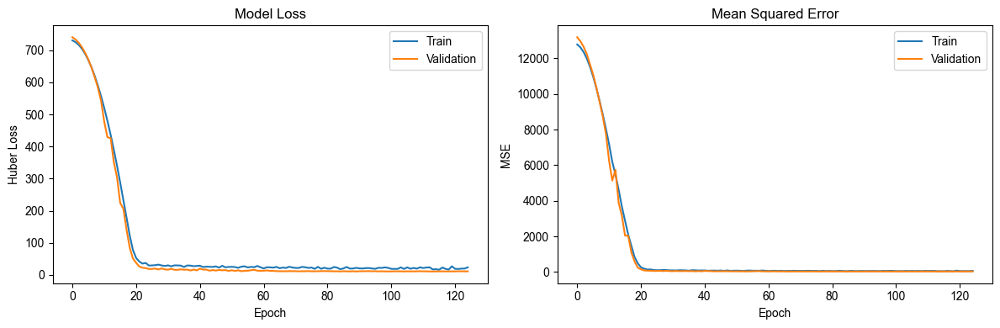

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 14.17
Validation MSE: 40.82
Validation MAE: 3.92


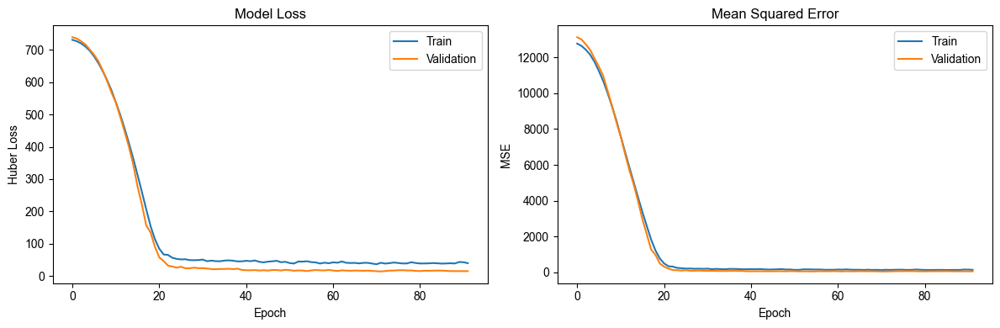

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 16.63
Validation MSE: 48.11
Validation MAE: 4.55


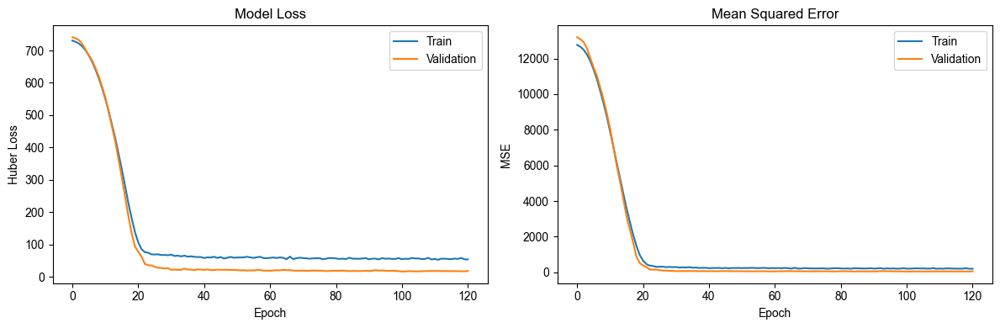

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.511561,6.331102,0.965496
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",5.115749,7.760176,0.948161
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.646639,4.665339,0.981264
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",4.506600,7.373273,0.953201
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.297811,4.572135,0.982005
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.105841,5.553132,0.973454
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.649646,6.072965,0.968252




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.359297,6.320133,0.945795
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.466160,6.510468,0.942481
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",3.073110,5.784148,0.954599
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",4.114267,6.497327,0.942713
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.803524,5.230247,0.962878
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.186137,5.904669,0.952688
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.802145,6.163307,0.948452


In [150]:
_, _, _, _ = train_and_validate_FFNN_3d_model(num_neighbors = 10, train_dataset = train_dataset, configs = configs, random_seeds=[42])



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.33
Validation MSE: 36.59
Validation MAE: 3.46


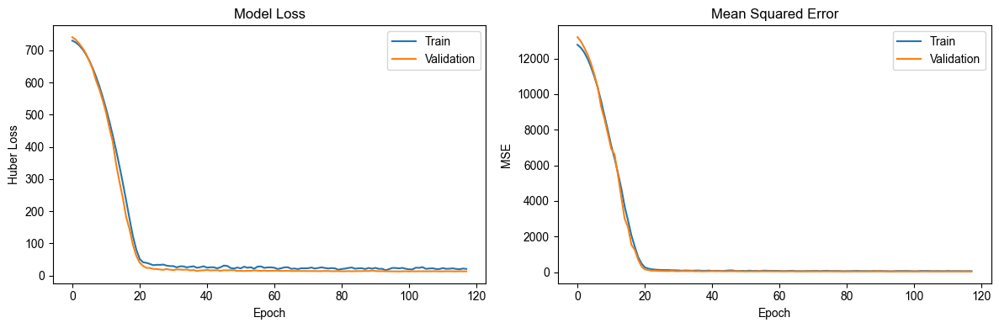

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 727us/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.24
Validation MSE: 43.36
Validation MAE: 3.33


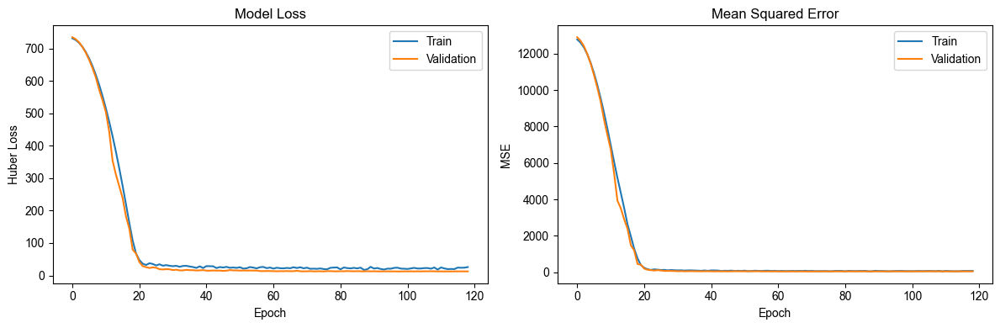

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 11.75
Validation MSE: 51.87
Validation MAE: 3.23


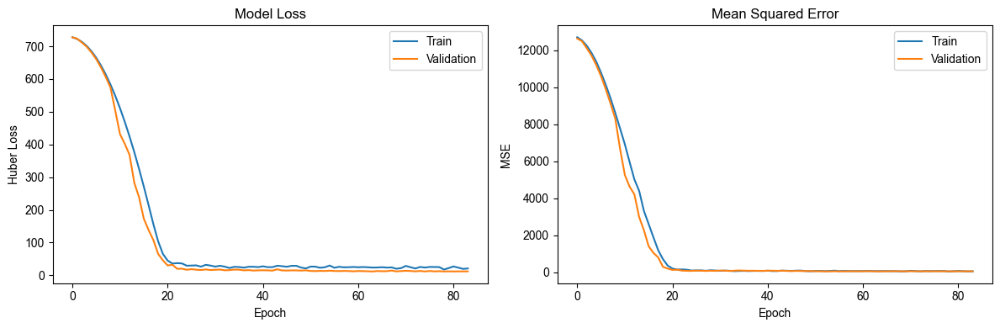

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 691us/step


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.46
Validation MSE: 87.88
Validation MAE: 3.36


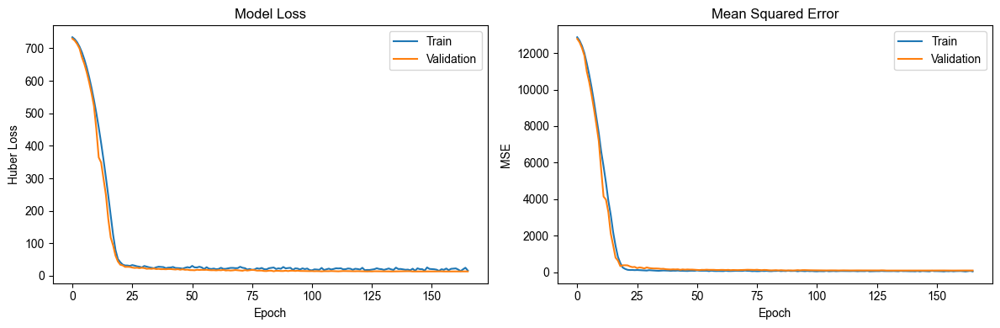

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 693us/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.32
Validation MSE: 54.16
Validation MAE: 3.47


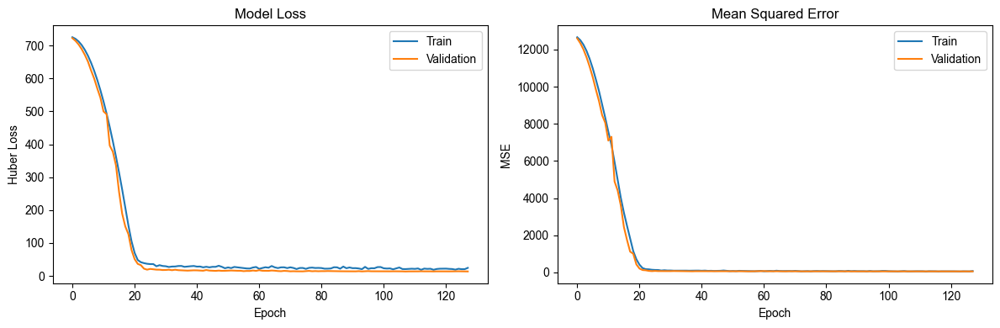

>>>> Model saved to ../artifacts/models/FFNN_model_neighbor10.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step


-----Training results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.506997,4.691078,0.981056
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.341649,4.544499,0.981886
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.578658,5.124188,0.977487
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.058861,5.187646,0.976133
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.069945,4.459289,0.983349




-----Validation results-----



,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.952925,5.595344,0.957515
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.848856,4.827065,0.970445
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.247737,6.684449,0.936941
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.711544,5.368866,0.962009
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.915985,6.080109,0.948302


In [151]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]

train_results_df, train_results_tables, vali_results_df_n10, vali_results_tables_n10 = train_and_validate_FFNN_3d_model(num_neighbors = 10, 
                                                                                                                        train_dataset = train_dataset, 
                                                                                                                        configs = config,
                                                                                                                        random_seeds=[42, 30, 512, 76, 61])


>>>>> Model information: FFNN 3D model with 10 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.1] <<<<<

Performance of the model on training dataset
mae: 2.31 ± 0.24
rmse: 4.80 ± 0.33
r2: 0.98 ± 0.00

Performance of model on validation dataset
mae: 2.94 ± 0.20
rmse: 5.71 ± 0.71
r2: 0.96 ± 0.01

--------Training results plot--------


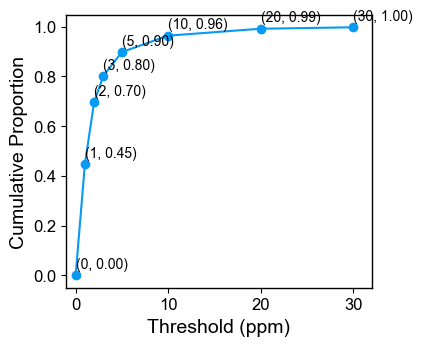


--------Validation results plot--------


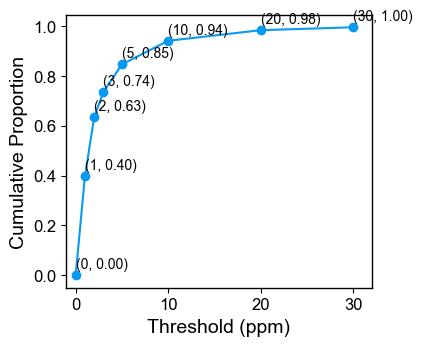


--------Training results scatter plot--------
R2 = 0.98
RMSE = 4.82
MAE = 2.311392604535435


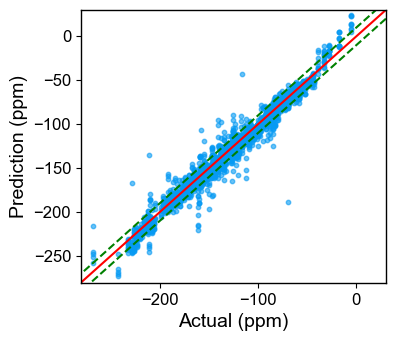


--------Validation results scatter plot--------
R2 = 0.96
RMSE = 5.76
MAE = 2.938806307283175


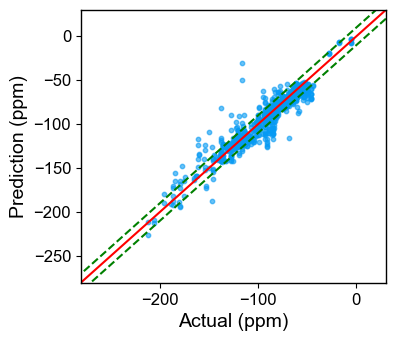

In [152]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, train_results_df, vali_results_tables_n10, vali_results_df_n10,
                                                model_info= 'FFNN 3D model with 10 neighbors, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.1]')

del vali_results_tables_n10, vali_results_df_n10, train_results_tables, train_results_df

## Save best FFNN 3D model on validation results to a csv file 

In [79]:
# vali_results_tables_n5.to_csv(
#     os.path.join("..", "artifacts", "results", "Best_FFNN_3DFeatureSet_neighbors5_valiDataset.csv")
# )

In [ ]:
# HOSE_file = os.path.join('..', 'artifacts', 'results', 'results_validation_dataset_HOSE_based model.csv')

# HOSE_results = pd.read_csv(HOSE_file, index_col=0)
# HOSE_results.head(3)

,actual,prediction,diff,similarity_levels
3_ethers_9,-125.54,-100.215,25.325,3
4_ethers_9,-125.54,-100.215,25.325,3
6_ethers_9,-140.01,-137.000,3.010,6


In [316]:
# results_with_similarity_levels = restuls_table.merge(HOSE_results['similarity_levels'], left_index = True, right_index = True)
# results_with_similarity_levels['similarity_levels'] = results_with_similarity_levels['similarity_levels'].apply(lambda x:x if x < 4 else 4)
# results_with_similarity_levels

,actual,prediction,diff,similarity_levels
3_ethers_9,-125.54,-92.046906,33.493094,3
4_ethers_9,-125.54,-92.906586,32.633414,3
6_ethers_9,-140.01,-134.748230,5.261770,4
7_ethers_9,-140.01,-135.096680,4.913320,4
12_From_Review_301,-74.00,-75.245743,1.245743,4
...,...,...,...,...
12_ether_21,-88.34,-92.328674,3.988674,3
13_ether_21,-88.34,-90.564636,2.224636,3
15_ether_21,-83.72,-83.618660,0.101340,4
16_ether_21,-83.72,-83.631882,0.088118,4


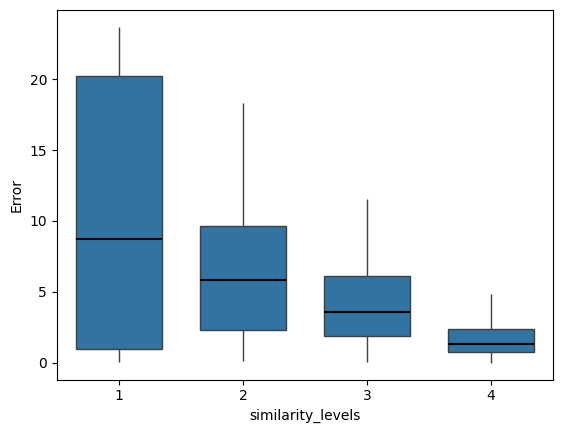

In [ ]:
# # Display error distribution across similarity levels
# grouped = results_with_similarity_levels.groupby('similarity_levels')['diff'].agg(["mean", "std", "min", "max"])
# df_melted = results_with_similarity_levels.melt(id_vars=['similarity_levels'], 
#                           value_vars=['diff'], 
#                           var_name='FFNN', 
#                           value_name='Error')


# df_melted = df_melted[df_melted['similarity_levels'] > 0]
# # Create the boxplot for error distribution across similarity levels
# ax = sns.boxplot(
#     x='similarity_levels', 
#     y='Error', 
#     # hue='FFNN',  # Different colors for different models
#     data=df_melted, 
#     width=0.7, 
#     showcaps=False, 
#     # palette="Set3",  # Use a visually appealing color scheme
#     medianprops={'color':'black', 'linewidth':1.5},
#     showfliers=False
# )

The error are big in each similarity levels, but still show the trend that prediction error increased with the decrease of similarity levels. 

# X. Feed Forward Neural Network with 2D feature sets
## 10.1 Streamline the data processing and FFNN model training

In [156]:
# Same data preprocessing as for the Ridge model. Therefore we don't have to save relevant imputer, scaler, and column names to files
class Define_and_Train_FFNN_Model_2D():
    def __init__(self, num_spheres, dataset):
        self.num_spheres = num_spheres
        self.dataset = dataset
        self.X_scaled, self.y = self.step1_data_generation()
        
        # self.model, self.history = self.step2_create_model(X_scaled, y)
        return 

    def step1_data_generation(self):
        get_2d_descriptors = atomic_features_2D.getAtomicDescriptorsFrom2DNeighbors()
        dataset = get_2d_descriptors.getDescriptorsFromDataset(
            self.dataset, self.num_spheres
        )

        # Drop columns with constant values
        dataset = common.drop_constant_col(dataset)

        # Drop columns with >80% values being NaN
        dataset_dropNaN = common.drop_high_ratio_NaN_cols(dataset)
        
        # drop rows with NaN values in the 'NMR_Peaks' column
        dataset_dropNaN = dataset_dropNaN.dropna(subset=["NMR_Peaks"])
        
        # Convert all columns in df to numeric where possible, keeping non-numeric values unchanged
        dataset_dropNaN = dataset_dropNaN.apply(pd.to_numeric, errors="ignore")
        
        # Drop categorical columns
        dataset_dropCat = common.drop_categorical_columns(dataset_dropNaN)

        # Conver column names to 'string'
        dataset_dropCat.columns = dataset_dropCat.columns.astype(str)
        dataset_dropCat, imputer = common.fill_NaN(dataset_dropCat)
        # Save imputer
        file_path = os.path.join("..", "artifacts", "models", f"imputer_2d_sphere{self.num_spheres}_Ridge.pkl")
        with open(file_path, "wb") as file:
            pickle.dump(imputer, file)

        # Save column names
        columns = dataset_dropCat.columns.tolist()
        file_path = os.path.join(
            "..", "artifacts", "models", f"column_names_2d_sphere{self.num_spheres}_Ridge.pkl"
        )
        with open(file_path, "wb") as f:
            pickle.dump(columns, f)
    

        dataset = dataset_dropCat.copy()
        y_train = dataset["NMR_Peaks"]
        X_train = dataset.drop(["NMR_Peaks"], axis=1)

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)

        # Save the scaler to a file
        file_path = os.path.join("..", "artifacts", "models", f"scaler_2d_sphere{self.num_spheres}_Ridge.pkl")
        with open(file_path, "wb") as file:
            pickle.dump(scaler, file)
        X_train_scaled = pd.DataFrame(X_train_scaled)
        X_train_scaled.columns = X_train.columns
        X_train_scaled.index = X_train.index
        
        return X_train_scaled, y_train


    # Define model architecture
    # Our training dataset have ~ 2000 samples, and ~100 features.
    def step2_create_model(self, X_scaled, y, config):
        model = Sequential([
            # Input layer
            Input(shape=(X_scaled.shape[1],)),
            Dense(config['layers'][0], activation='relu'),
            BatchNormalization(),
            Dropout(config['dropout'][0]),

            Dense(config['layers'][1], activation='relu'),
            BatchNormalization(),
            Dropout(config['dropout'][1]),

            # Hidden layers
            Dense(config['layers'][2], activation='relu'),
            BatchNormalization(),
            Dropout(config['dropout'][2]),
            
            # Output layer - for regression task
            Dense(1),
            Lambda(lambda x:-x) # all 19F NMR values are negative in our dataset
        ])
        
        lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10)
   
        # Early stopping to prevent overfitting
        early_stopping = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True
        )

        # Compile model
        # Use Huber loss for our task, which is less sensitive to outliers. 
        # For small errors ([error] < delta), it behaves like MSE, and for large errors, it behaves like MAE.
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss=tf.keras.losses.Huber(delta=7), 
            metrics=['mean_squared_error', 'mean_absolute_error']
        )

        # Split data into training and validation sets
        X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True)

        # Fit the model
        history = model.fit(
            X_train, y_train,
            epochs=200,
            batch_size=32,
            validation_data=(X_val, y_val),
            callbacks=[early_stopping, lr_scheduler],
            verbose=0
        )

        # Evaluate the model on validation data
        val_loss, val_mse, val_mae = model.evaluate(X_val, y_val, verbose=0)
        print(f"Validation Loss (Huber loss): {val_loss:.2f}")
        print(f"Validation MSE: {val_mse:.2f}")
        print(f"Validation MAE: {val_mae:.2f}")
        
        # Visualize training history
        plt.figure(figsize=(12, 4))
        
        # Plot training & validation loss
        plt.subplot(1, 2, 1)
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title('Model Loss')
        plt.ylabel('Huber Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper right')

        # Plot training & validation mean absolute error
        plt.subplot(1, 2, 2)
        plt.plot(history.history['mean_squared_error'])
        plt.plot(history.history['val_mean_squared_error'])
        plt.title('Mean Squared Error')
        plt.ylabel('MSE')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper right')
        plt.tight_layout()
        plt.show()

        # Save the model
        model_path = os.path.join("..", "artifacts", "models", f"FFNN_model_sphere{self.num_spheres}.h5")
        model.save(model_path)
        print(f">>>> Model saved to {model_path}")
    
        return model, history.history

In [157]:
def test_2D_FFNN_model_on_validation_dataset(
    dataset, num_spheres, FFNN_2D_model_path, scaler_path, imputer_path, columns_path, verbose = True
):
    
    best_model = load_model(FFNN_2D_model_path)

    with open(scaler_path, "rb") as file:
        scaler = pickle.load(file)

    with open(imputer_path, "rb") as file:
        imputer = pickle.load(file)

    with open(columns_path, "rb") as file:
        train_columns = pickle.load(file)

    get_2d_descriptors = atomic_features_2D.getAtomicDescriptorsFrom2DNeighbors()
    content = get_2d_descriptors.getDescriptorsFromDataset(dataset, num_spheres)

    # Convert all columns in df to numeric where possible, keeping non-numeric values unchanged
    content = content.apply(pd.to_numeric, errors="ignore")

    # Conver column names to 'string'
    content.columns = content.columns.astype(str)

    # Delete columns not shown in the train dataset
    content = content[train_columns]

    # Drop rows with NaN values in the 'NMR_Peaks' column
    content = content.dropna(subset=["NMR_Peaks"])
    
    content_imputed = imputer.transform(content)

    content_imputed = pd.DataFrame(
        content_imputed, columns=content.columns, index=content.index
    )

    y = content_imputed["NMR_Peaks"]
    X = content_imputed.drop(["NMR_Peaks"], axis=1)

    X_scaled = scaler.transform(X)

    X_scaled = pd.DataFrame(X_scaled)
    X_scaled.columns = X.columns
    X_scaled.index = X.index

    results_table = common.get_results_table(best_model=best_model, X=X_scaled, y=y)
    if verbose:
        common.plot_prediction_performance(results_table, figure_title=None)
        common.show_results_scatter(results_table, figure_title=None)
    return results_table

In [158]:
def test_2D_FFNN_model_performance(num_spheres, test_fluorinated_compounds):
    base_file_path = os.path.join("..", "artifacts", "models")
    restuls_table = test_2D_FFNN_model_on_validation_dataset(
        dataset=test_fluorinated_compounds,
        num_spheres=num_spheres,
        FFNN_2D_model_path=os.path.join(base_file_path, f"FFNN_model_sphere{num_spheres}.h5"),
        scaler_path=os.path.join(base_file_path, f"scaler_2d_sphere{num_spheres}_Ridge.pkl"),
        imputer_path=os.path.join(base_file_path, f"imputer_2d_sphere{num_spheres}_Ridge.pkl"),
        columns_path=os.path.join(base_file_path, f"column_names_2d_sphere{num_spheres}_Ridge.pkl"),
        verbose = False,
    )
    return restuls_table


In [159]:
def train_and_validate_FFNN_2d_model(num_spheres, train_dataset, configs, random_seeds=[1, 2, 3, 4, 5]):
    '''
    Train and validate 2D FFNN model on the train_dataset, which will be split into training and validation datasets using various random_seeds.
    The model will be trained using different configurations specified in configs.
    All the results will be collected in vali_results and training_results dictionaries,
    and the results tables will be returned as pandas DataFrames.
    Args:
        num_spheres (int): Number of spheres to use in the 2D feature set.
        train_dataset (pd.DataFrame): Training dataset with fluorinated compounds.
        configs (list): List of configurations for the FFNN model.
            example:
            configs = [
                    {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]},
                    {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]},
                    ]

        random_seeds (list): List of random seeds for reproducibility.
    Returns:
        training_results_df (pd.DataFrame): DataFrame with training results.
        train_results_tables (pd.DataFrame): DataFrame with training results tables.
        vali_results_df (pd.DataFrame): DataFrame with validation results.
        vali_results_tables (pd.DataFrame): DataFrame with validation results tables.
    '''
    vali_results = {}
    training_results = {}
    vali_results_tables = pd.DataFrame()
    train_results_tables = pd.DataFrame()
    for random_seed in random_seeds:
        print(f"\n\n>>>>> Random seed: {random_seed} <<<<<\n")
        train_fluorinated_compounds, vali_fluorinated_compounds = split_datasets(
            train_dataset, RANDOM_STATE=random_seed
        )
        # Data processing and get X, y
        FFNN_2d_model = Define_and_Train_FFNN_Model_2D(num_spheres=num_spheres, dataset = train_fluorinated_compounds)
        
        for config in configs:
            print(f"\n>>>>> Config: {config} <<<<<\n")
            # Create and train the model
            model, history = FFNN_2d_model.step2_create_model(FFNN_2d_model.X_scaled, FFNN_2d_model.y, config)
            # training_results[f'random_seed = {random_seed}_config = {str(config)}'] = {
            #         'Huber loss': history['loss'][-1],
            #         'val_Huber loss': history['val_loss'][-1],
            #         'RMSE': np.sqrt(history['mean_squared_error'][-1]),
            #         'val_RMSE': np.sqrt(history['val_mean_squared_error'][-1]),
            #         'MAE': history['mean_absolute_error'][-1],
            #         'val_MAE': history['val_mean_absolute_error'][-1]
            #     }

            vali_results_table = test_2D_FFNN_model_performance(num_spheres = num_spheres, test_fluorinated_compounds = vali_fluorinated_compounds)
            train_results_table = test_2D_FFNN_model_performance(num_spheres = num_spheres, test_fluorinated_compounds = train_fluorinated_compounds)

            vali_results_tables = pd.concat([vali_results_tables, vali_results_table], axis=0)
            train_results_tables = pd.concat([train_results_tables, train_results_table], axis=0)

            vali_mae = mean_absolute_error(vali_results_table['actual'], vali_results_table['prediction'])
            vali_mse = mean_squared_error(vali_results_table['actual'], vali_results_table['prediction'])
            vali_rmse = np.sqrt(vali_mse)
            vali_r2 = r2_score(vali_results_table['actual'], vali_results_table['prediction'])
            vali_results[f'random_seed = {random_seed}_config = {str(config)}'] = {'mae': vali_mae, 'rmse': vali_rmse, 'r2': vali_r2}

            train_mae = mean_absolute_error(train_results_table['actual'], train_results_table['prediction'])
            train_mse = mean_squared_error(train_results_table['actual'], train_results_table['prediction'])
            train_rmse = np.sqrt(train_mse)
            train_r2 = r2_score(train_results_table['actual'], train_results_table['prediction'])
            training_results[f'random_seed = {random_seed}_config = {str(config)}'] = {'mae': train_mae, 'rmse': train_rmse, 'r2': train_r2}

    training_results_df = pd.DataFrame(training_results).T
    vali_results_df = pd.DataFrame(vali_results).T
    print("\n\n-----Training results-----")
    display(training_results_df)

    print("\n\n-----Validation results-----")
    display(vali_results_df)

    try:
        del train_fluorinated_compounds, vali_fluorinated_compounds
        del FFNN_2d_model, model, history, vali_results_table
    except:
        pass
    
    return training_results_df, train_results_tables, vali_results_df, vali_results_tables

## 10.2 Neighboring Spheres = 2



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 18.14
Validation MSE: 55.99
Validation MAE: 4.60


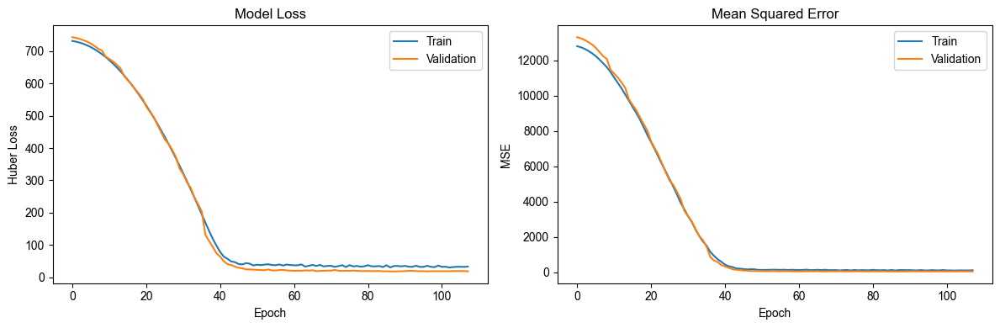

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 27.81
Validation MSE: 93.86
Validation MAE: 6.62


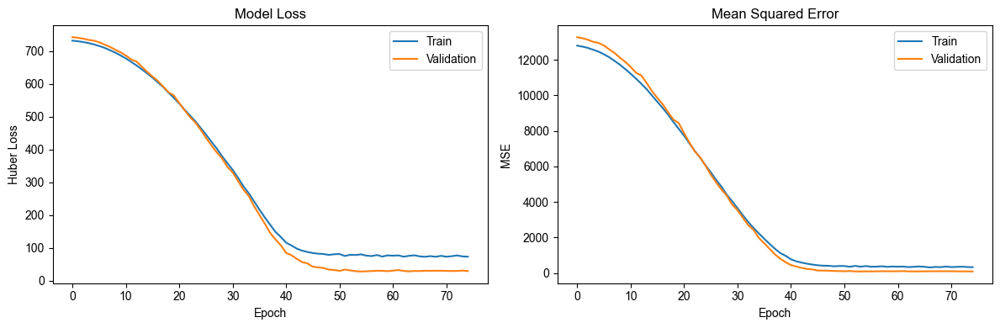

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 16.06
Validation MSE: 55.27
Validation MAE: 4.18


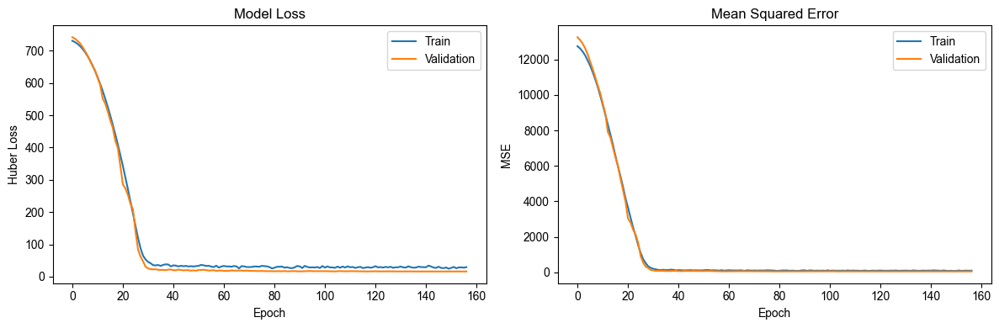

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 19.38
Validation MSE: 57.88
Validation MAE: 4.96


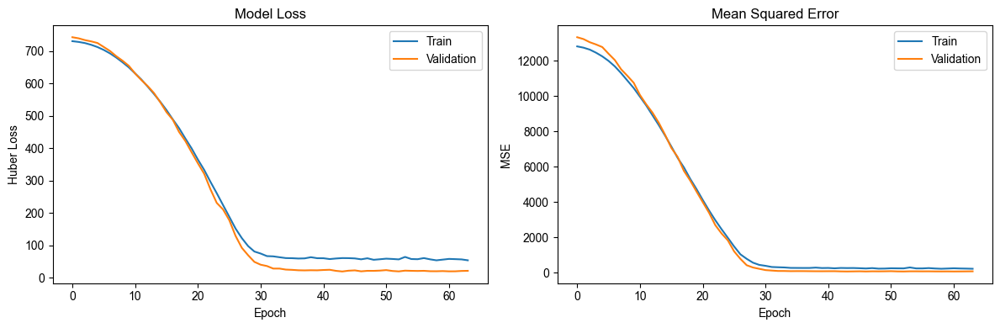

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.94
Validation MSE: 40.12
Validation MAE: 3.62


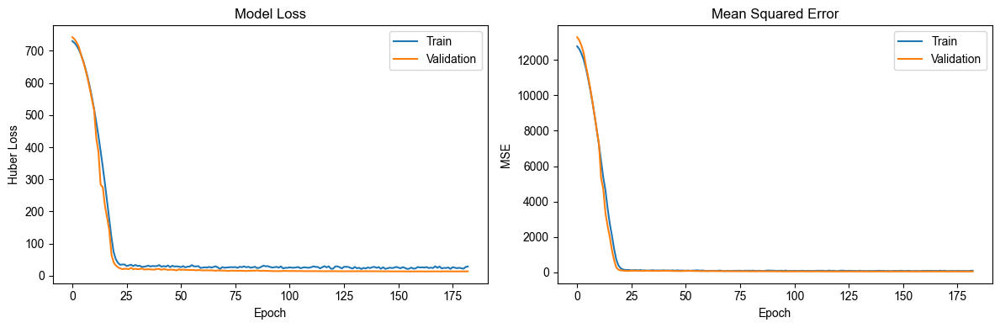

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 15.85
Validation MSE: 50.62
Validation MAE: 4.26


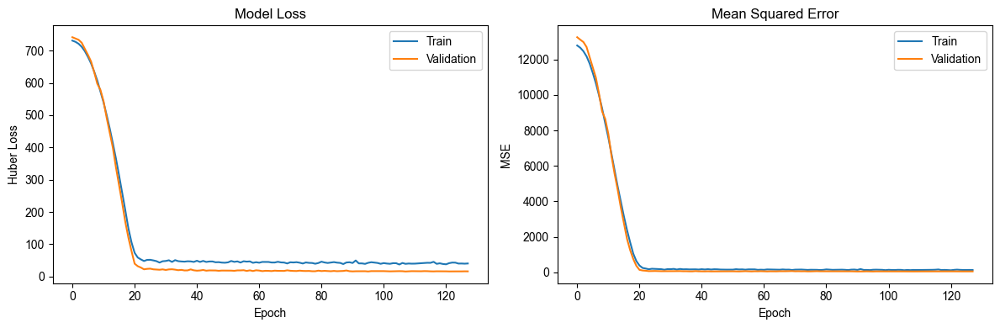

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 19.76
Validation MSE: 65.38
Validation MAE: 4.97


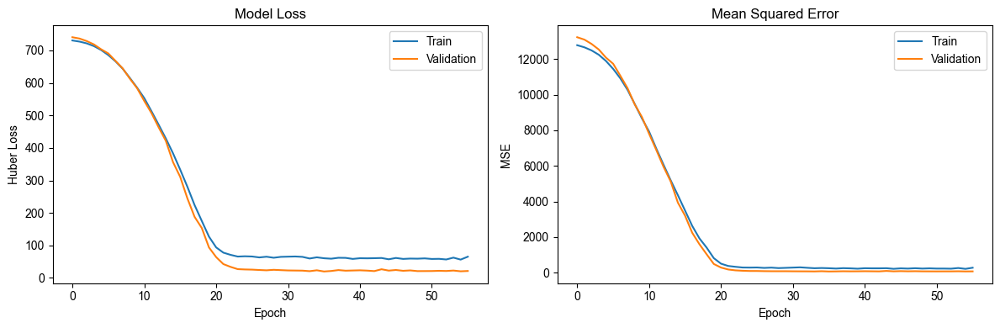

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",4.152161,7.003848,0.957808
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",6.228537,9.421129,0.923657
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",3.556376,6.310909,0.965743
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",4.746053,7.640919,0.949783
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.033119,5.369125,0.975205
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.707460,6.214840,0.966778
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",4.655628,7.588812,0.950465




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.342890,5.794994,0.954429
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.739979,6.467733,0.943234
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",3.144627,5.548855,0.958218
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.572645,5.744910,0.955213
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.951812,5.007609,0.965971
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",3.134966,5.179796,0.963591
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",3.342550,5.498493,0.958973


In [160]:
configs = [
    {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
    {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]},
    {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]},
]
_, _, _, _ = train_and_validate_FFNN_2d_model(num_spheres=2, train_dataset = train_dataset, configs = configs, random_seeds=[42], verbose = False)



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.61
Validation MSE: 41.52
Validation MAE: 3.76


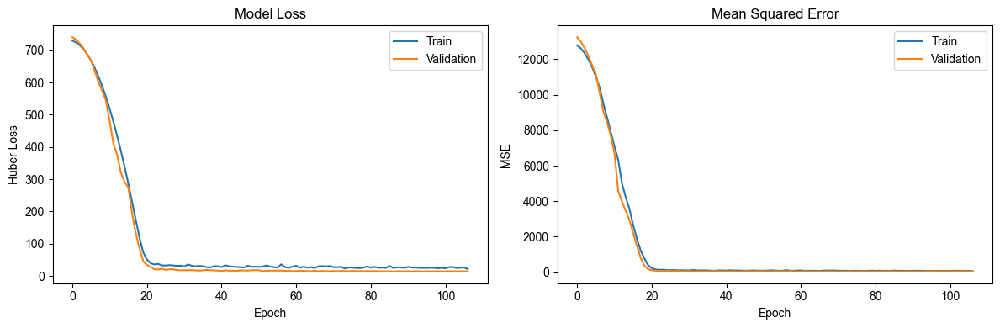

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 13.15
Validation MSE: 43.76
Validation MAE: 3.55


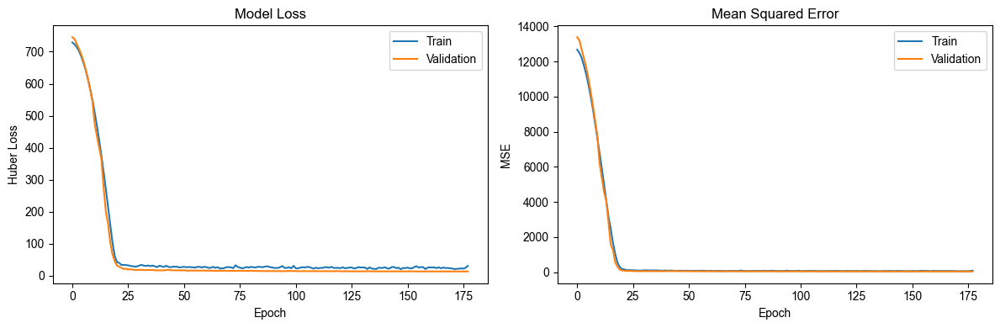

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 10.87
Validation MSE: 32.39
Validation MAE: 3.23


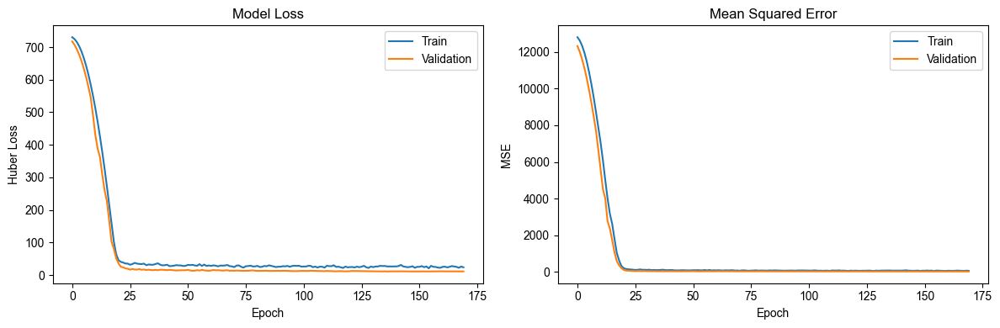

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 12.71
Validation MSE: 46.23
Validation MAE: 3.47


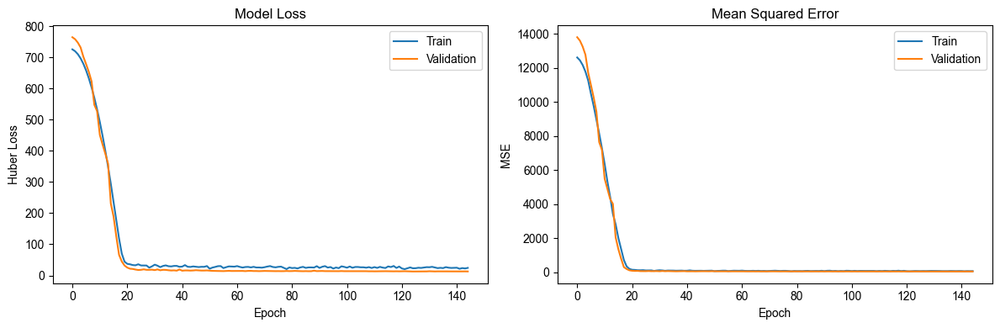

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 14.93
Validation MSE: 48.15
Validation MAE: 3.95


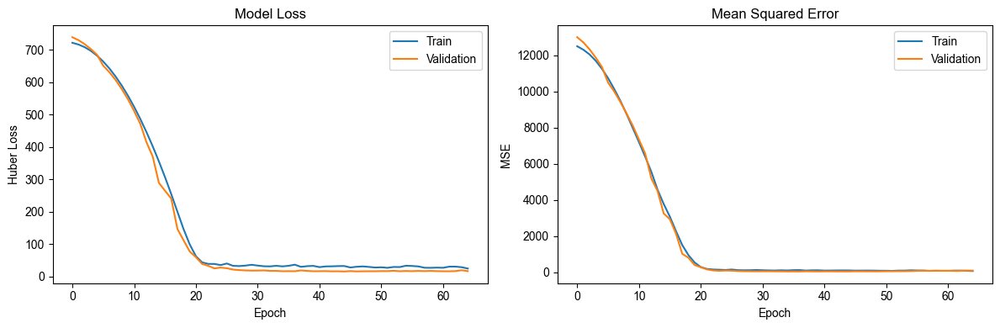

>>>> Model saved to ../artifacts/models/FFNN_model_sphere2.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.193326,5.529735,0.973699
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.987991,5.235812,0.975975
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.964744,5.168901,0.977110
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.065285,5.486520,0.973324
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.789756,6.480650,0.964860




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.038022,5.224954,0.962953
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.030155,5.422560,0.962703
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",4.197875,8.920646,0.887692
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",4.430721,8.743599,0.899237
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",3.408123,6.284843,0.944762


In [161]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]
training_results_df, train_results_tables, vali_results_df_s2, vali_results_tables_s2 = train_and_validate_FFNN_2d_model(num_spheres=2, 
                                                                                                                         train_dataset = train_dataset, 
                                                                                                                         configs = config, 
                                                                                                                         random_seeds=[42, 30, 512, 76, 61], 
                                                                                                                         verbose = False)


>>>>> Model information: FFNN 2D model with 2 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0] <<<<<

Performance of the model on training dataset
mae: 3.20 ± 0.34
rmse: 5.58 ± 0.53
r2: 0.97 ± 0.00

Performance of model on validation dataset
mae: 3.62 ± 0.66
rmse: 6.92 ± 1.79
r2: 0.93 ± 0.04

--------Training results plot--------


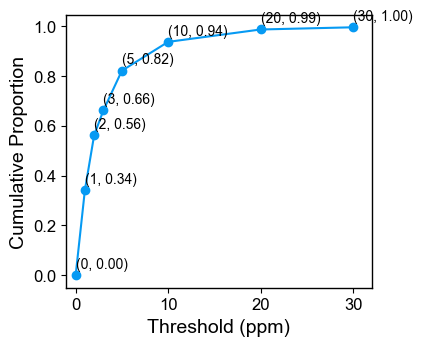


--------Validation results plot--------


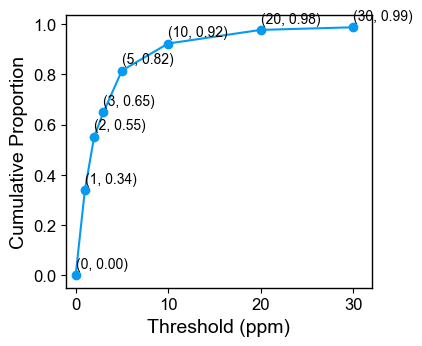


--------Training results scatter plot--------
R2 = 0.97
RMSE = 5.59
MAE = 3.193826680370644


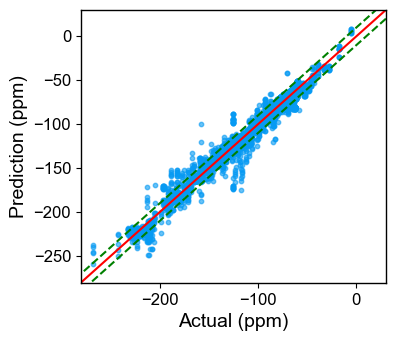


--------Validation results scatter plot--------
R2 = 0.93
RMSE = 7.01
MAE = 3.586768566419891


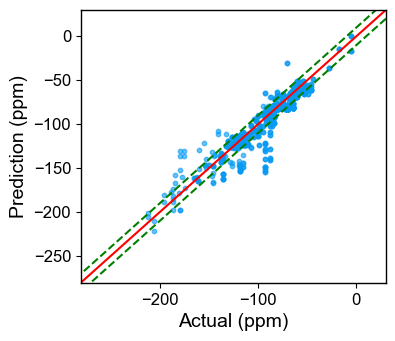

In [162]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, training_results_df, vali_results_tables_s2, vali_results_df_s2,
                                              model_info= 'FFNN 2D model with 2 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0]')

del vali_results_tables_s2, vali_results_df_s2, train_results_tables, training_results_df

# 10.3 Neighboring Spheres = 3



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 17.96
Validation MSE: 98.49
Validation MAE: 4.31


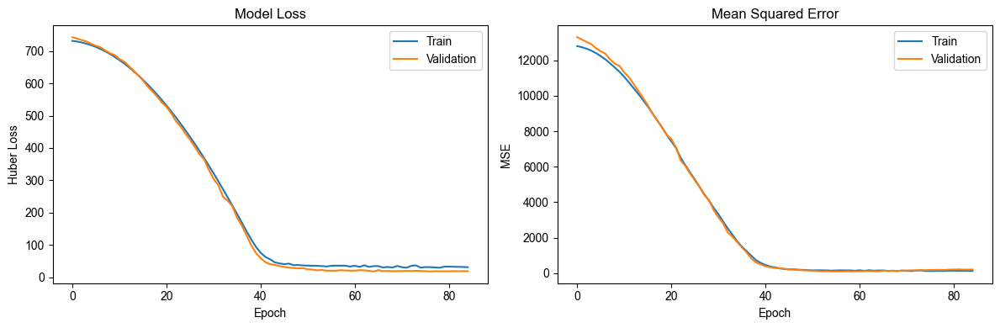

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 20.85
Validation MSE: 103.65
Validation MAE: 5.29


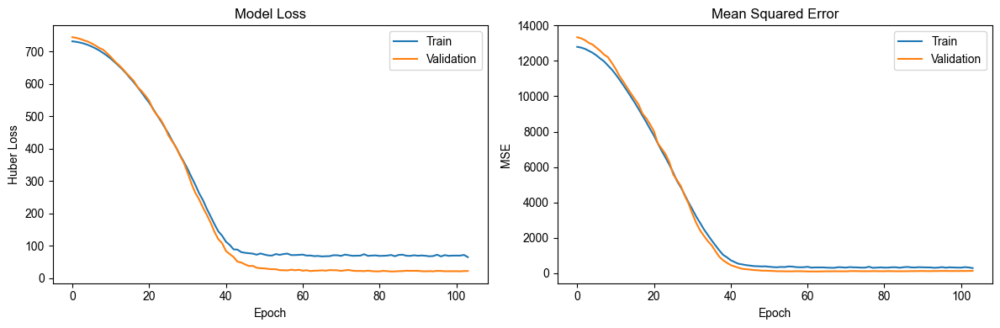

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 9.36
Validation MSE: 28.62
Validation MAE: 2.85


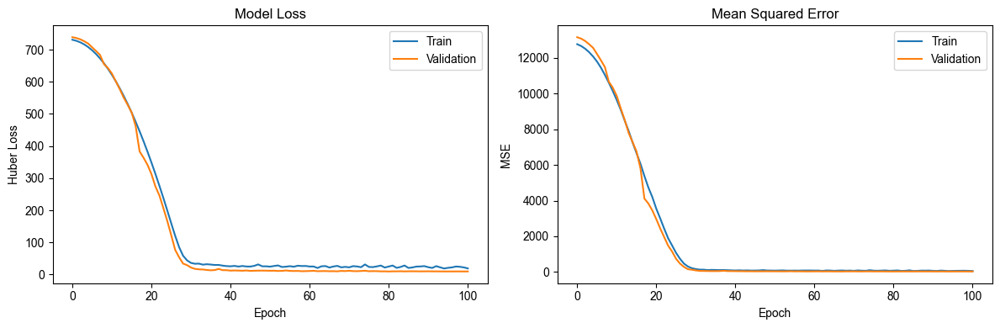

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 11.96
Validation MSE: 38.47
Validation MAE: 3.52


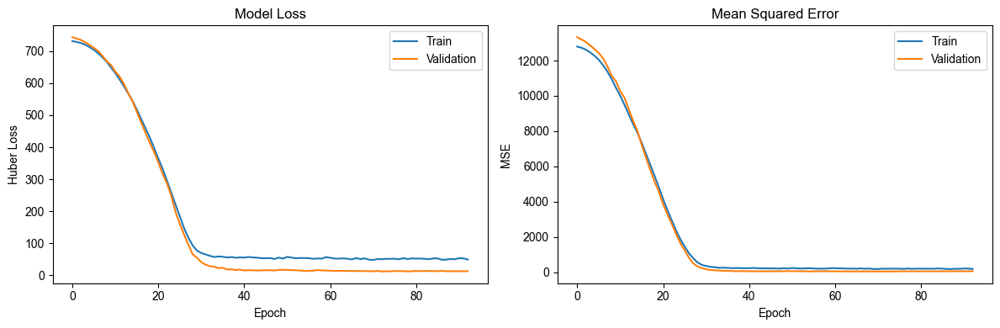

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 7.82
Validation MSE: 21.33
Validation MAE: 2.60


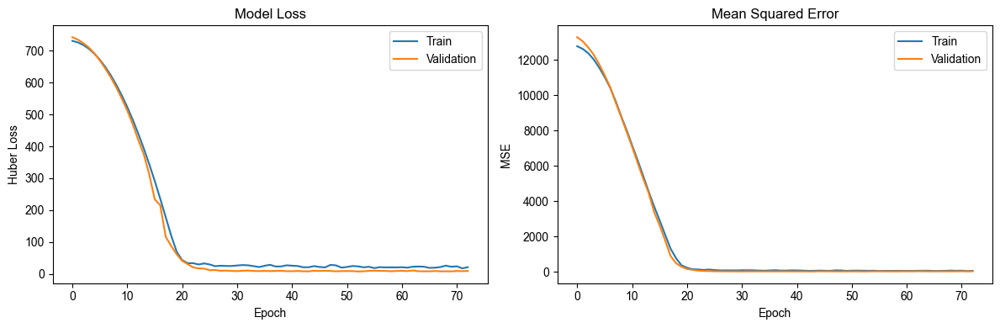

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 9.17
Validation MSE: 25.69
Validation MAE: 2.88


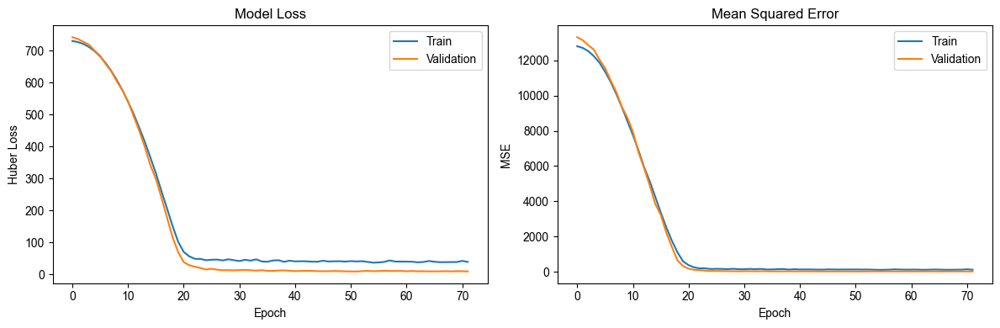

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 917us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 10.72
Validation MSE: 29.88
Validation MAE: 3.41


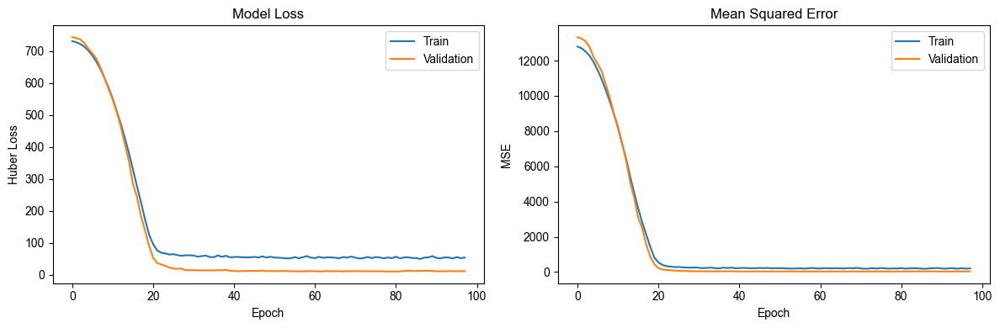

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",3.576756,7.782416,0.947906
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.551451,7.954631,0.945575
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.129525,3.878687,0.987060
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.069576,5.375838,0.975143
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.046219,3.468162,0.989654
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.553330,4.343798,0.983771
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",2.954799,4.730118,0.980756




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.768070,5.543333,0.958301
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",3.768673,6.112361,0.949301
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.218636,4.962136,0.966587
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",2.770389,5.485078,0.959173
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.074755,4.130847,0.976844
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.318096,4.764159,0.969200
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",2.884261,5.382382,0.960687


In [163]:
_, _, _, _ = train_and_validate_FFNN_2d_model(num_spheres=3, train_dataset = train_dataset, configs = configs, random_seeds=[42], verbose = False)



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 8.73
Validation MSE: 41.38
Validation MAE: 2.71


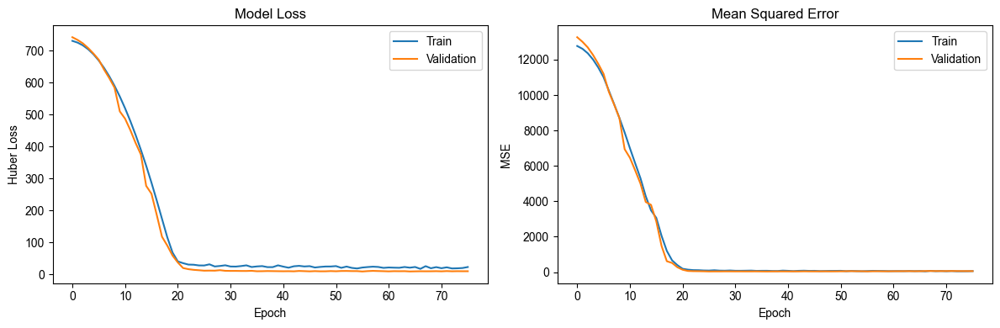

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 8.84
Validation MSE: 30.03
Validation MAE: 2.57


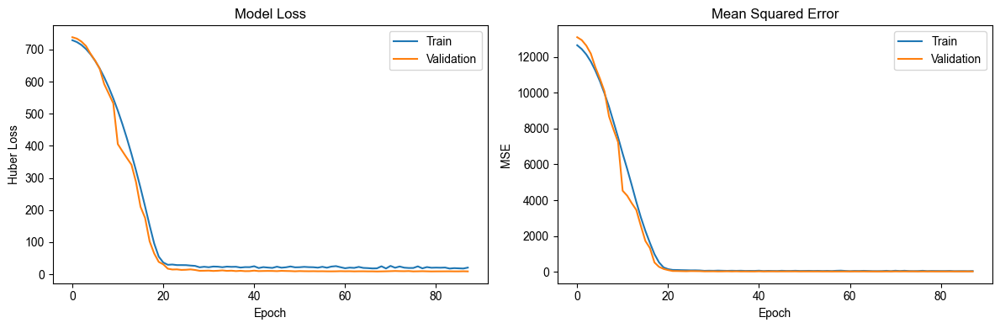

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 5.02
Validation MSE: 13.04
Validation MAE: 1.94


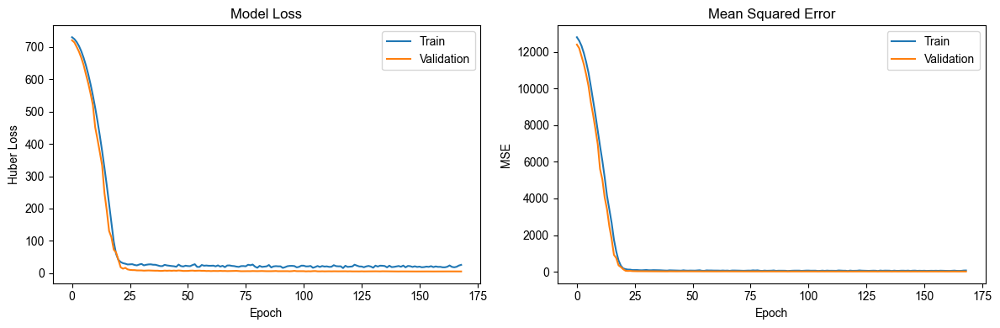

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 7.46
Validation MSE: 23.37
Validation MAE: 2.42


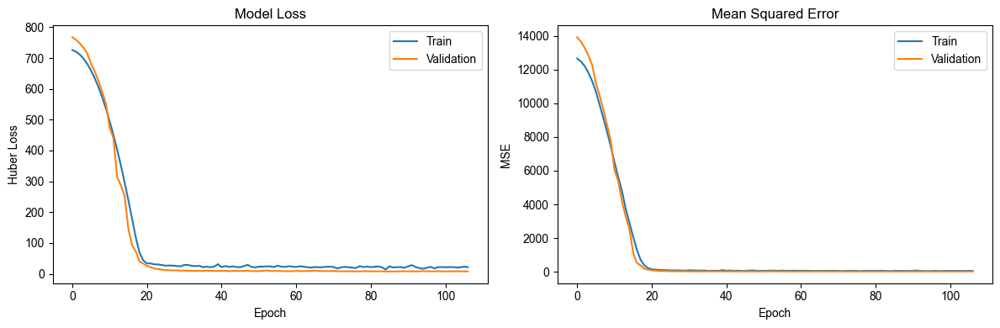

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 9.22
Validation MSE: 55.75
Validation MAE: 2.69


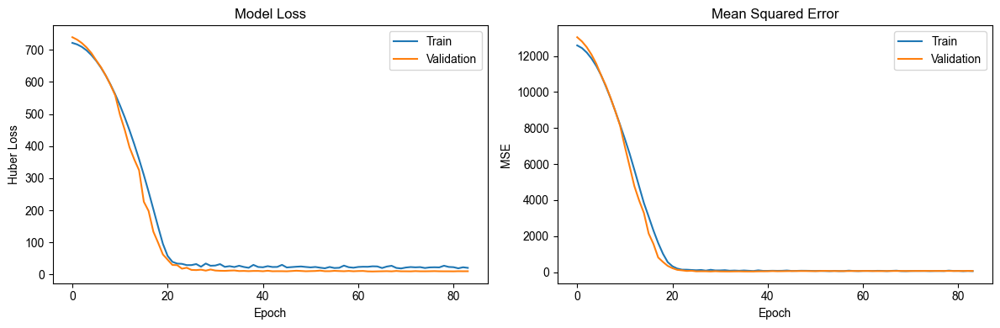

>>>> Model saved to ../artifacts/models/FFNN_model_sphere3.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.970042,3.951457,0.986570
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.899141,3.616898,0.988535
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.452219,2.662702,0.993926
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.801806,3.175616,0.991063
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.952484,4.324242,0.984355




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.088320,4.271873,0.975236
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.011801,3.582518,0.983721
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.371470,4.600966,0.970124
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.955650,5.275716,0.963316
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.116501,4.284765,0.974326


In [164]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]
training_results_df, train_results_tables, vali_results_df_s3, vali_results_tables_s3 = train_and_validate_FFNN_2d_model(num_spheres=3, 
                                                                                                                         train_dataset = train_dataset, 
                                                                                                                         configs = config, 
                                                                                                                         random_seeds=[42, 30, 512, 76, 61], 
                                                                                                                         verbose = False)


>>>>> Model information: FFNN 2D model with 3 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0] <<<<<

Performance of the model on training dataset
mae: 1.82 ± 0.21
rmse: 3.55 ± 0.65
r2: 0.99 ± 0.00

Performance of model on validation dataset
mae: 2.31 ± 0.39
rmse: 4.40 ± 0.61
r2: 0.97 ± 0.01

--------Training results plot--------


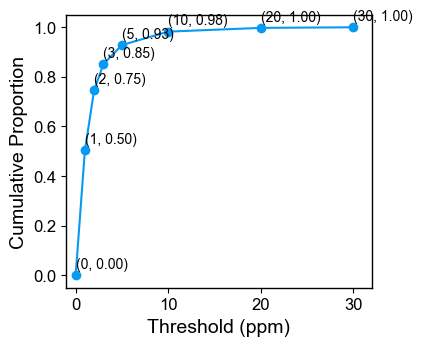


--------Validation results plot--------


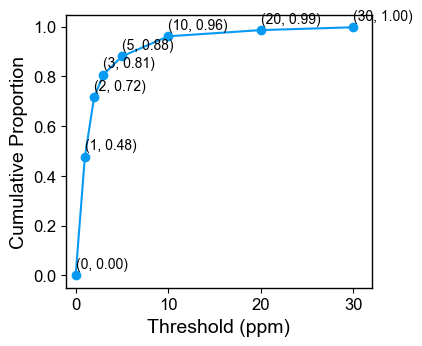


--------Training results scatter plot--------
R2 = 0.99
RMSE = 3.58
MAE = 1.8128722996743603


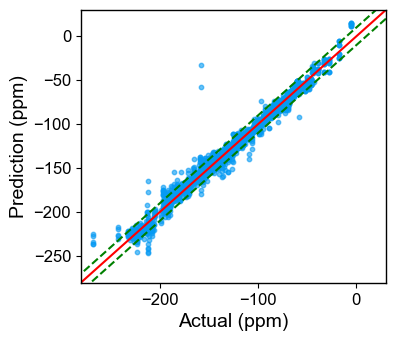


--------Validation results scatter plot--------
R2 = 0.97
RMSE = 4.41
MAE = 2.285336213966242


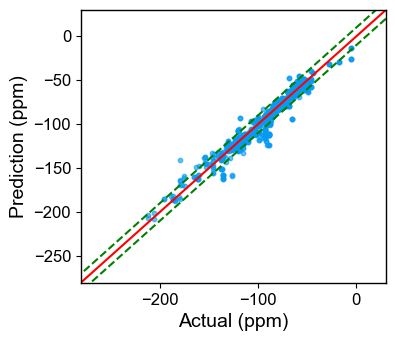

In [165]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, training_results_df, vali_results_tables_s3, vali_results_df_s3,
                                                model_info= 'FFNN 2D model with 3 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0]')

del vali_results_tables_s3, vali_results_df_s3, train_results_tables, training_results_df

# 10.4 Neighboring Spheres = 4



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 8.93
Validation MSE: 25.87
Validation MAE: 2.69


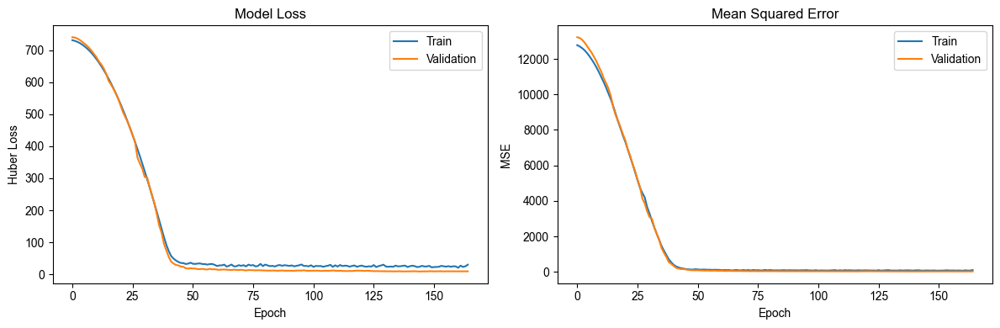

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 15.08
Validation MSE: 48.74
Validation MAE: 4.36


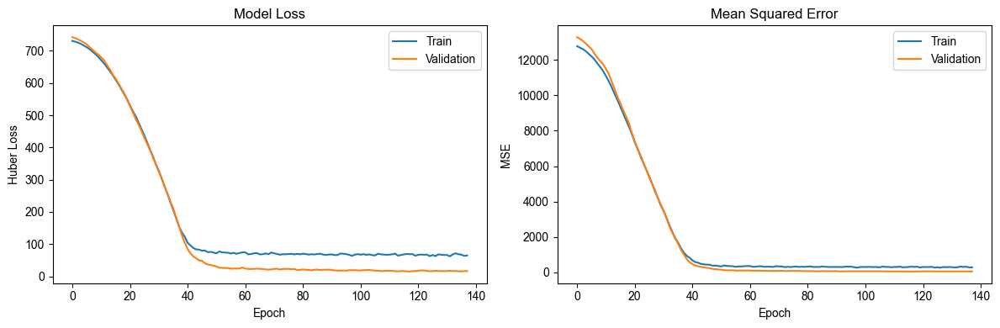

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 8.32
Validation MSE: 58.74
Validation MAE: 2.49


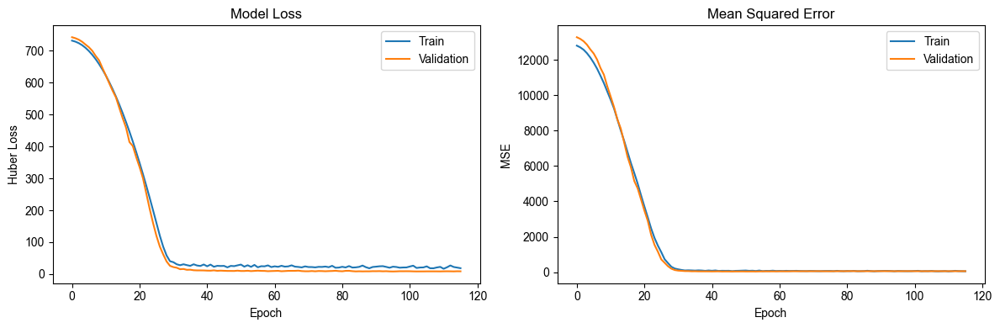

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 12.77
Validation MSE: 37.21
Validation MAE: 3.62


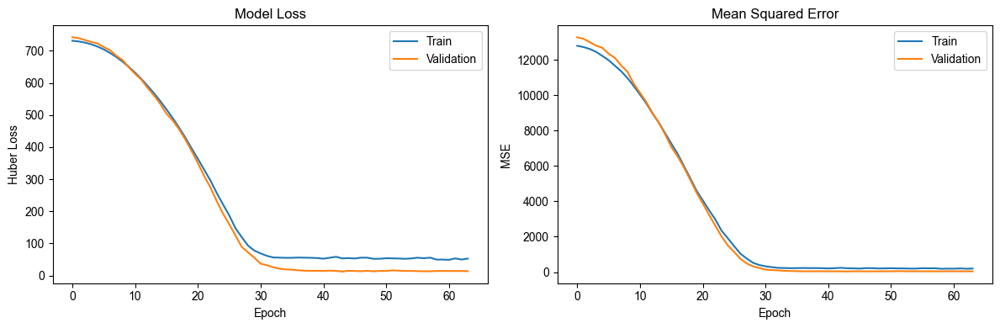

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 7.61
Validation MSE: 34.17
Validation MAE: 2.31


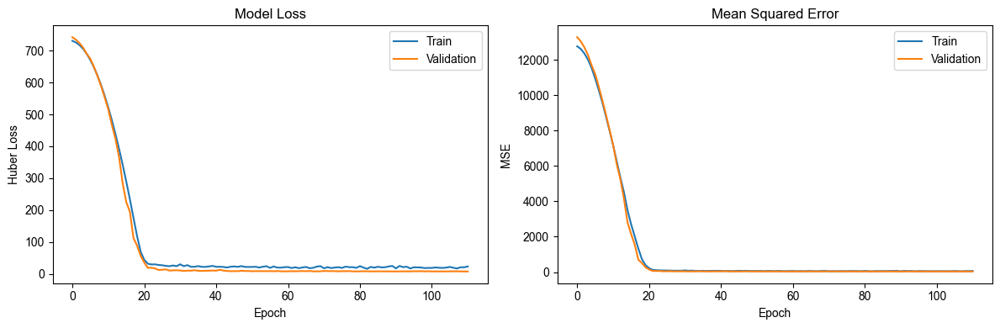

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 8.83
Validation MSE: 28.54
Validation MAE: 2.72


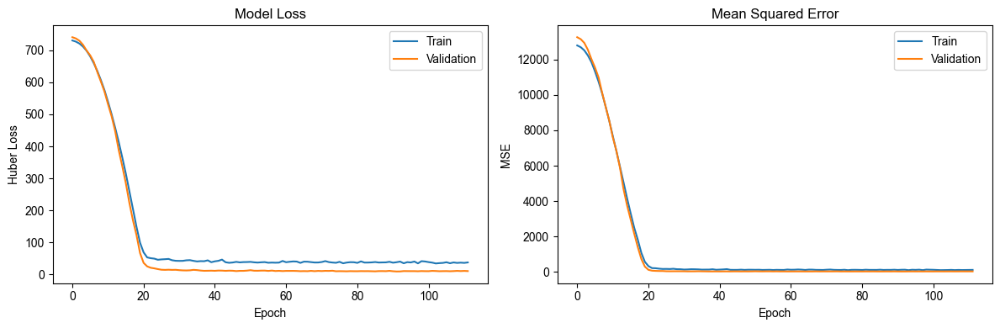

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 10.62
Validation MSE: 31.52
Validation MAE: 3.30


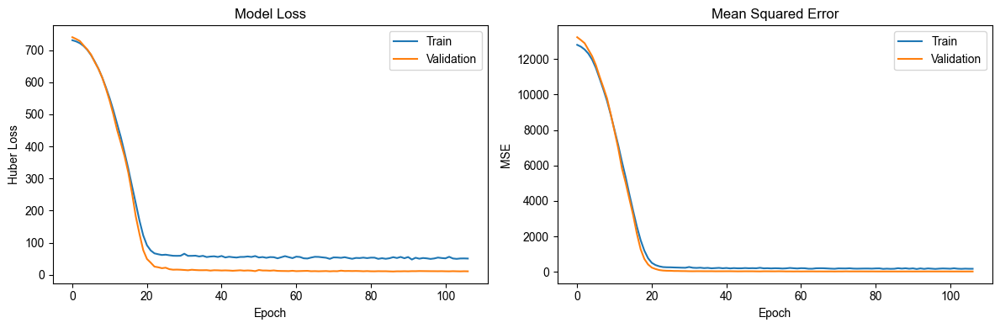

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.044981,3.822687,0.987431
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",3.756481,5.579311,0.973225
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",1.660492,4.117220,0.985420
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",3.187855,5.567862,0.973335
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.400636,3.190217,0.991246
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.003302,3.610228,0.988789
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",2.651206,4.157250,0.985135




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.098717,4.434626,0.973313
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",3.864226,5.795535,0.954420
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",1.945765,3.936631,0.978970
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",2.820169,5.317267,0.961633
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.630998,3.462422,0.983732
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.224816,4.459129,0.973017
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",2.690934,4.799731,0.968738


In [166]:
_, _, _, _ = train_and_validate_FFNN_2d_model(num_spheres=4, train_dataset = train_dataset, configs = configs, random_seeds=[42], verbose = False)



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 8.50
Validation MSE: 42.70
Validation MAE: 2.55


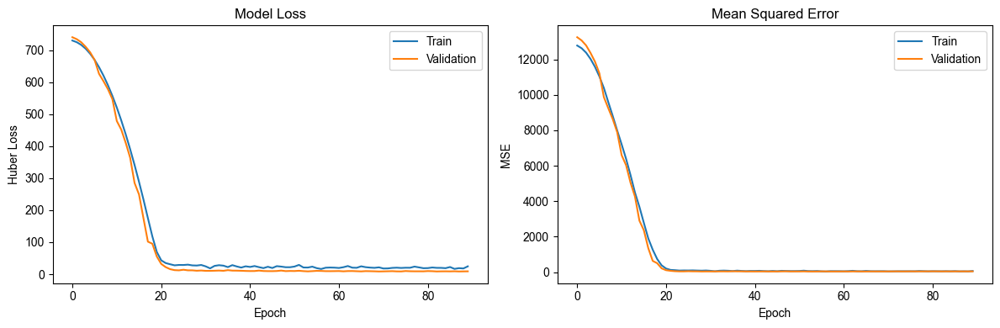

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 6.34
Validation MSE: 18.85
Validation MAE: 2.10


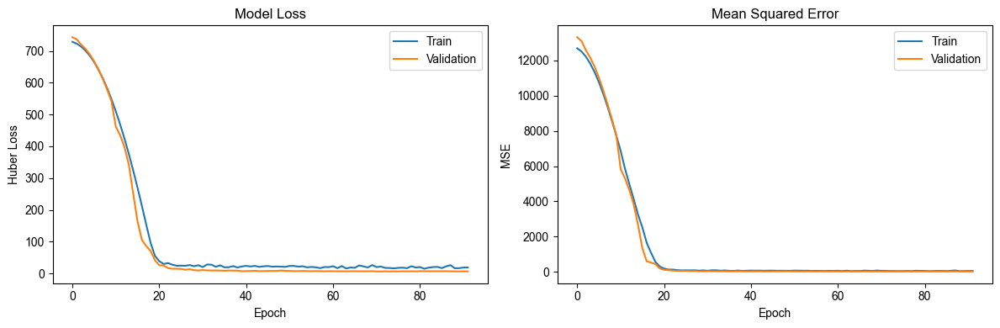

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 4.76
Validation MSE: 15.51
Validation MAE: 1.78


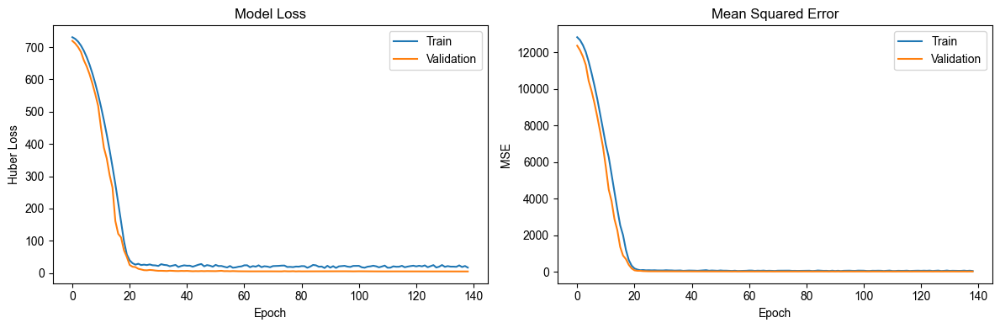

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 7.27
Validation MSE: 19.99
Validation MAE: 2.45


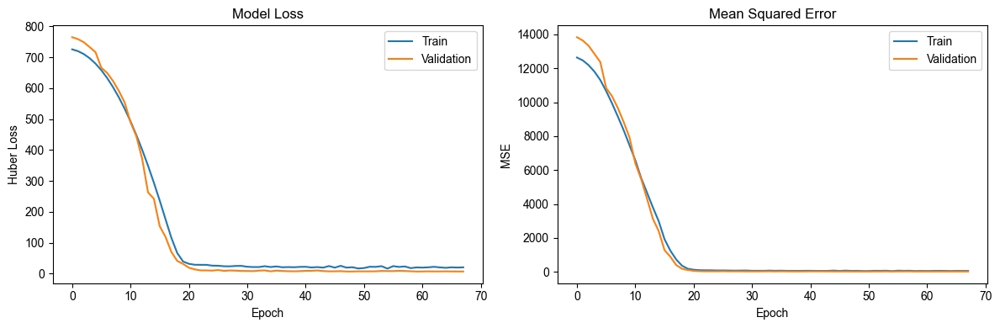

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 6.74
Validation MSE: 39.83
Validation MAE: 2.13


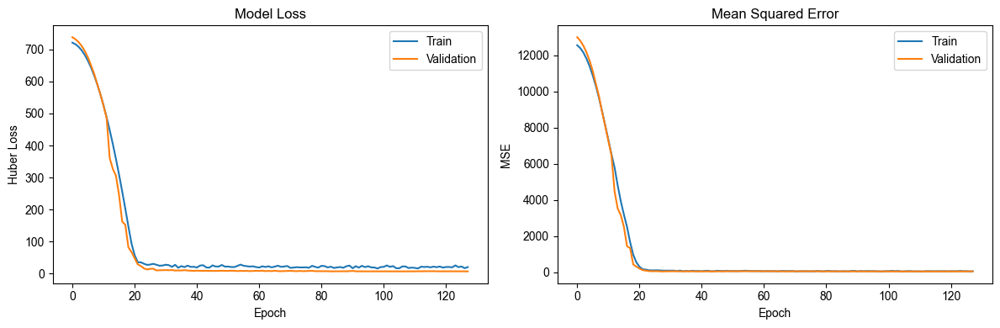

>>>> Model saved to ../artifacts/models/FFNN_model_sphere4.h5
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.623996,3.573995,0.989013
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.472722,2.866473,0.992799
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.287985,2.623352,0.994104
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.897164,3.222320,0.990798
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.343361,3.418895,0.990220




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.881111,3.771567,0.980697
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.923545,3.669542,0.982920
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.169917,4.647317,0.969519
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.970441,5.440698,0.960985
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.883133,4.193301,0.975410


In [167]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]
training_results_df, train_results_tables, vali_results_df_s4, vali_results_tables_s4 = train_and_validate_FFNN_2d_model(num_spheres=4, 
                                                                                                                         train_dataset = train_dataset, 
                                                                                                                         configs = config, 
                                                                                                                         random_seeds=[42, 30, 512, 76, 61], verbose = False)


>>>>> Model information: FFNN 2D model with 4 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0] <<<<<

Performance of the model on training dataset
mae: 1.53 ± 0.25
rmse: 3.14 ± 0.39
r2: 0.99 ± 0.00

Performance of model on validation dataset
mae: 2.17 ± 0.47
rmse: 4.34 ± 0.72
r2: 0.97 ± 0.01

--------Training results plot--------


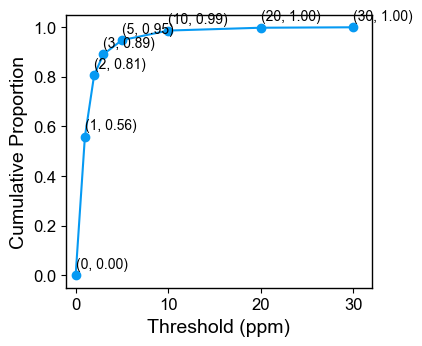


--------Validation results plot--------


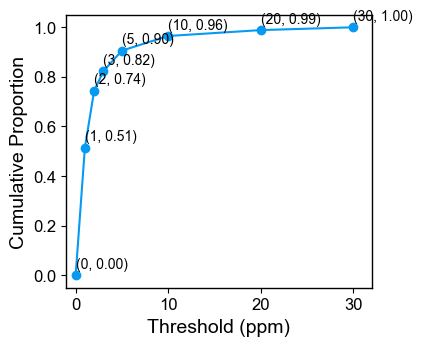


--------Training results scatter plot--------
R2 = 0.99
RMSE = 3.16
MAE = 1.528382427288668


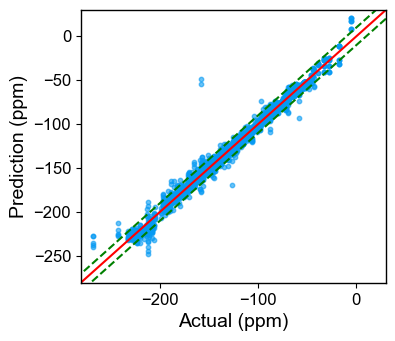


--------Validation results scatter plot--------
R2 = 0.97
RMSE = 4.35
MAE = 2.135227523057383


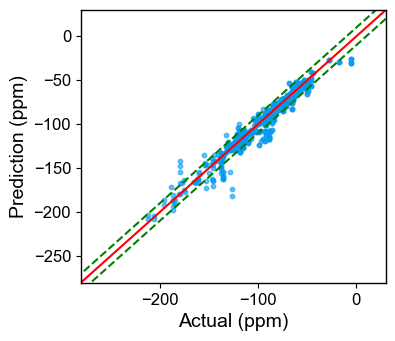

In [168]:
show_model_perfromance_on_both_train_and_vali(train_results_tables, training_results_df, vali_results_tables_s4, vali_results_df_s4,
                                                model_info= 'FFNN 2D model with 4 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0]')

del vali_results_tables_s4, vali_results_df_s4, train_results_tables, training_results_df

# 10.5 Neighboring Spheres = 5



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 8.92
Validation MSE: 24.62
Validation MAE: 2.88


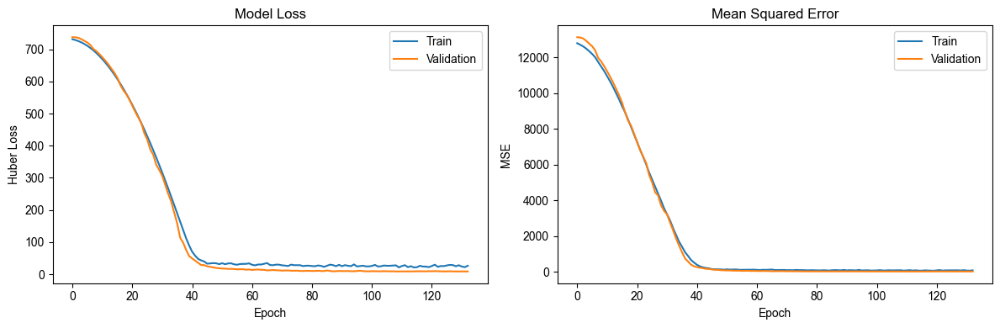

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 679us/step

>>>>> Config: {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 18.29
Validation MSE: 66.61
Validation MAE: 4.85


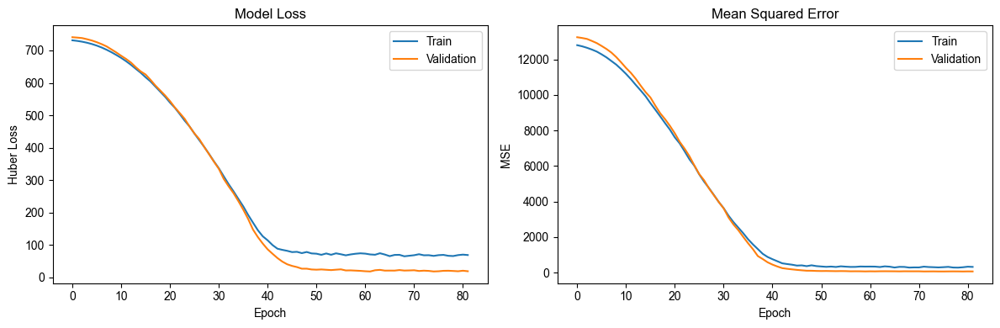

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 682us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 6.48
Validation MSE: 17.20
Validation MAE: 2.22


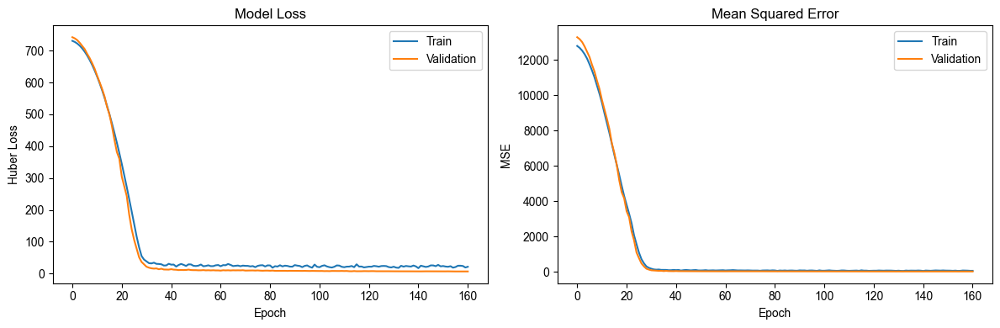

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 689us/step

>>>>> Config: {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 11.07
Validation MSE: 30.98
Validation MAE: 3.39


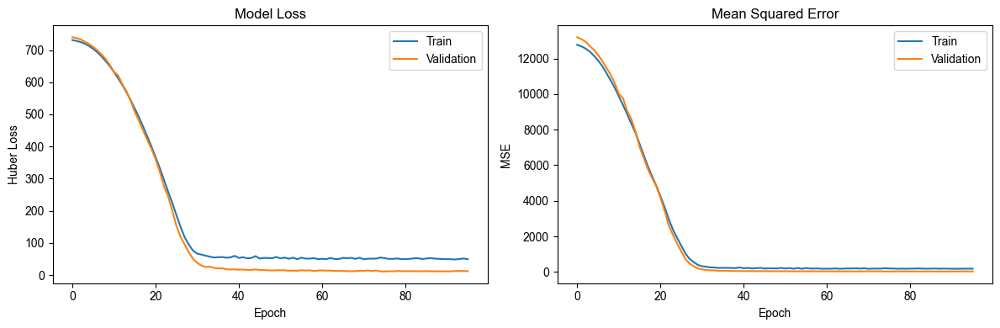

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 7.33
Validation MSE: 34.49
Validation MAE: 2.30


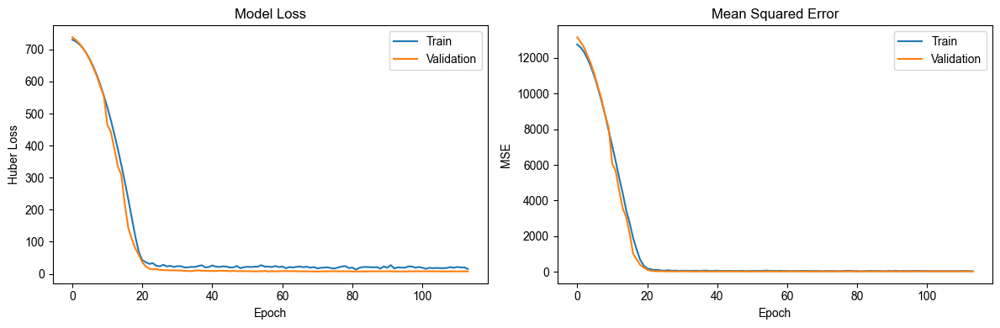

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]} <<<<<

Validation Loss (Huber loss): 9.15
Validation MSE: 37.18
Validation MAE: 2.84


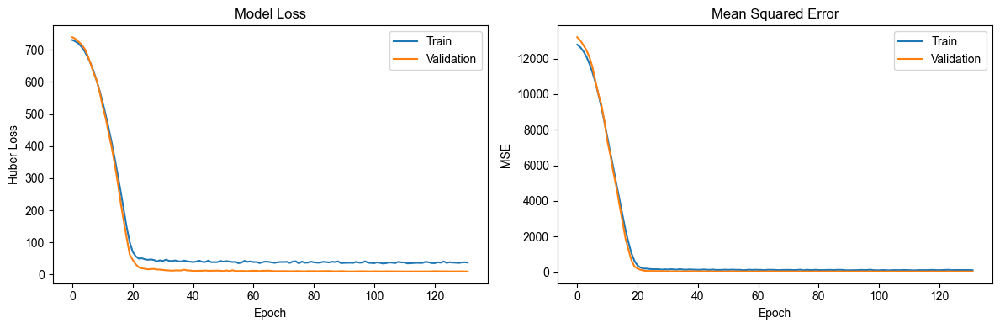

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step

>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]} <<<<<

Validation Loss (Huber loss): 10.19
Validation MSE: 31.29
Validation MAE: 3.23


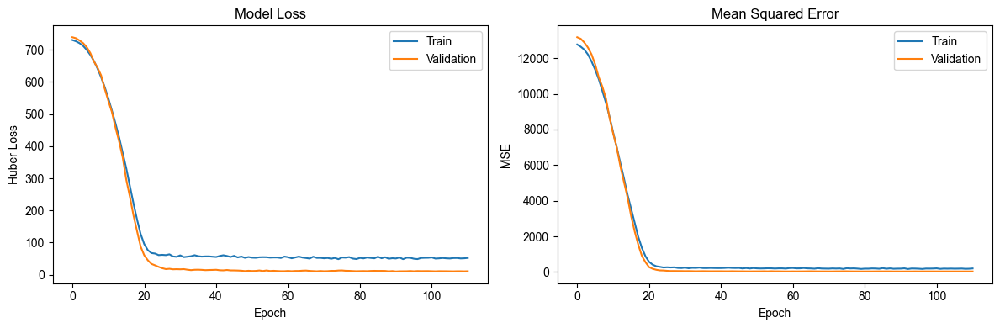

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.286860,3.979945,0.986376
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.395120,7.352413,0.953503
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",1.478715,2.780522,0.993350
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",2.745805,4.445154,0.983004
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.423102,3.266522,0.990822
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",1.947621,3.764586,0.987810
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",2.498410,4.043405,0.985938




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.2, 0.1, 0.0]}",2.651642,4.910205,0.967282
"random_seed = 42_config = {'layers': [32, 16, 8], 'dropout': [0.3, 0.2, 0.1]}",4.028522,6.231934,0.947298
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.2, 0.1, 0.0]}",2.073683,3.746978,0.980948
"random_seed = 42_config = {'layers': [64, 32, 16], 'dropout': [0.3, 0.2, 0.1]}",2.931931,5.097522,0.964738
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.939949,3.807201,0.980330
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.3, 0.2, 0.1]}",2.394586,4.315802,0.974724
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.4, 0.3, 0.2]}",2.872677,4.937545,0.966917


In [169]:
_, _, _, _ = train_and_validate_FFNN_2d_model(num_spheres=5, train_dataset = train_dataset, configs = configs, random_seeds=[42], verbose = False)



>>>>> Random seed: 42 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 6.96
Validation MSE: 38.21
Validation MAE: 2.20


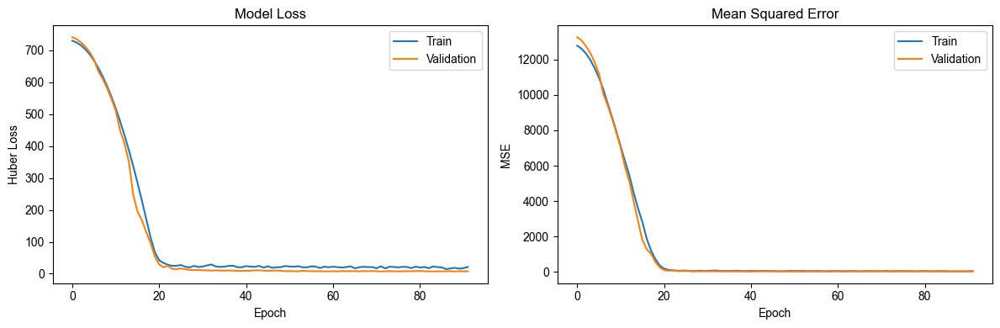

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step


>>>>> Random seed: 30 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 6.47
Validation MSE: 19.27
Validation MAE: 2.04


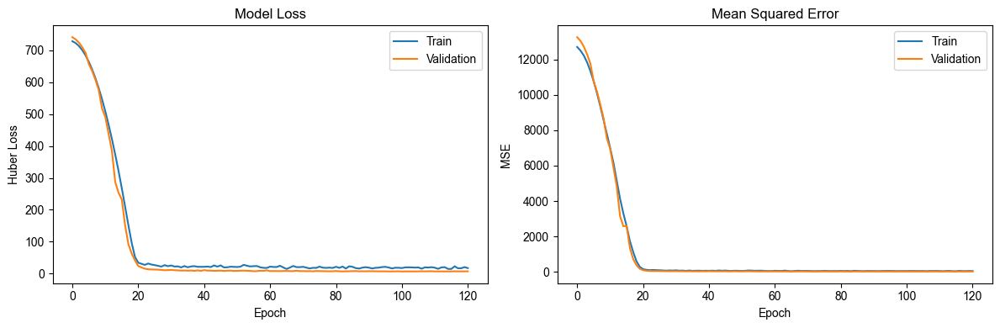

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step


>>>>> Random seed: 512 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 5.15
Validation MSE: 16.48
Validation MAE: 1.85


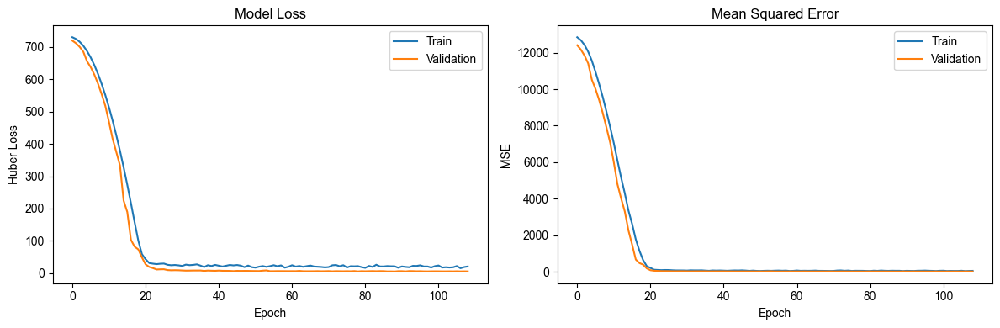

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  


>>>>> Random seed: 76 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 5.87
Validation MSE: 16.41
Validation MAE: 1.95


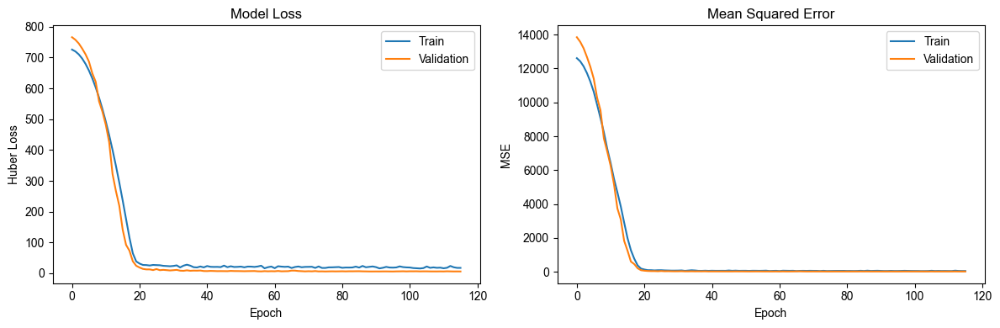

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


73/73 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step


>>>>> Random seed: 61 <<<<<


>>>>> Config: {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]} <<<<<

Validation Loss (Huber loss): 7.29
Validation MSE: 23.01
Validation MAE: 2.32


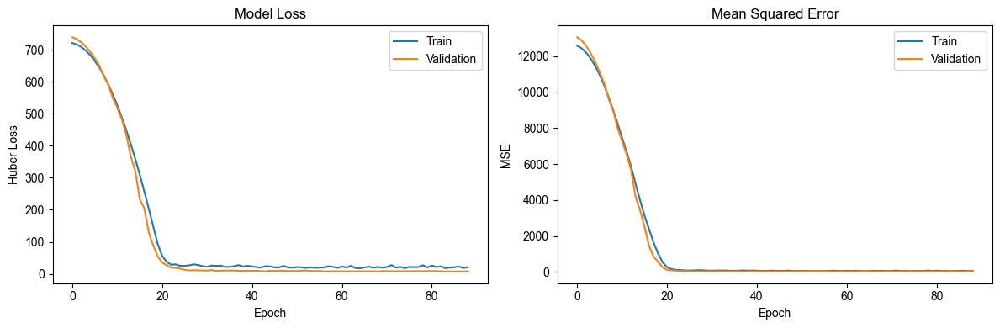

>>>> Model saved to ../artifacts/models/FFNN_model_sphere5.h5


23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


-----Training results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.426769,3.425753,0.989906
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.259905,2.733557,0.993451
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.404736,2.777418,0.993391
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.327424,2.638344,0.993831
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.608490,3.190225,0.991485




-----Validation results-----


,mae,rmse,r2
"random_seed = 42_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.049745,3.766863,0.980745
"random_seed = 30_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",1.968249,3.802202,0.981663
"random_seed = 512_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.375292,4.971432,0.965120
"random_seed = 76_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.701650,5.254991,0.963603
"random_seed = 61_config = {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]}",2.066638,4.311714,0.974002


In [178]:
config = [
    {'layers': [128, 64, 32], 'dropout': [0.2, 0.1, 0.0]},
]
training_results_df_s5, train_results_tables_s5, vali_results_df_s5, vali_results_tables_s5 = train_and_validate_FFNN_2d_model(num_spheres=5, 
                                                                                                                         train_dataset = train_dataset, 
                                                                                                                         configs = config, 
                                                                                                                         random_seeds=[42, 30, 512, 76, 61], verbose = False)


>>>>> Model information: FFNN 2D model with 5 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0] <<<<<

Performance of the model on training dataset
mae: 1.33 ± 0.14
rmse: 2.70 ± 0.41
r2: 0.99 ± 0.00

Performance of model on validation dataset
mae: 2.23 ± 0.30
rmse: 4.42 ± 0.67
r2: 0.97 ± 0.01

--------Training results plot--------


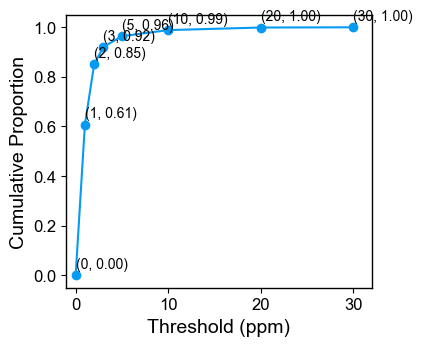


--------Validation results plot--------


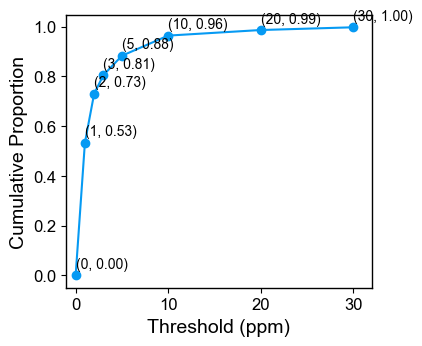


--------Training results scatter plot--------
R2 = 0.99
RMSE = 2.72
MAE = 1.3290454572893997


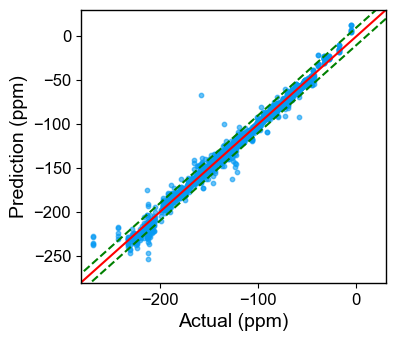


--------Validation results scatter plot--------
R2 = 0.97
RMSE = 4.43
MAE = 2.2138470644774815


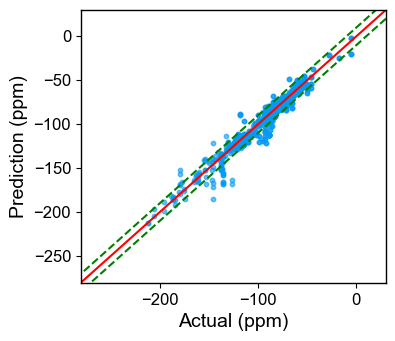

In [ ]:
show_model_perfromance_on_both_train_and_vali(train_results_tables_s5, training_results_df, vali_results_tables_s5, vali_results_df_s5,
                                                model_info= 'FFNN 2D model with 5 spheres, layers = [128, 64, 32], dropout = [0.2, 0.1, 0.0]')

# del vali_results_tables_s5, vali_results_df_s5, train_results_tables, training_results_df

train_results_tables_s5.to_csv(os.path.join("..", "artifacts", "results", "FFNN 2D_s5_Results On Training Dataset with 5 Random Seeds.csv"), index=True)
vali_results_tables_s5.to_csv(os.path.join("..", "artifacts", "results", "FFNN 2D_s5_Results On Validation Dataset with 5 Random Seeds.csv.csv"), index=True)

In [ ]:
# file_path = os.path.join('..', 'artifacts', 'results', 'Best_FFNN_2D_results_on_validation_dataset.csv')
# vali_results_tables_s3.to_csv(file_path)

In [240]:
# HOSE_file = os.path.join('..', 'artifacts', 'results', 'results_validation_dataset_HOSE_based model.csv')

# HOSE_results = pd.read_csv(HOSE_file, index_col=0)
# HOSE_results.head(3)

,actual,prediction,diff,similarity_levels
3_ethers_9,-125.54,-100.215,25.325,3
4_ethers_9,-125.54,-100.215,25.325,3
6_ethers_9,-140.01,-137.000,3.010,6


In [241]:
# results_with_similarity_levels = results_table_FFNN_2D_sphere4.merge(HOSE_results['similarity_levels'], left_index = True, right_index = True)
# results_with_similarity_levels

,actual,prediction,diff,similarity_levels
3_ethers_9,-125.54,-121.498840,4.041160,3
4_ethers_9,-125.54,-121.498840,4.041160,3
6_ethers_9,-140.01,-139.402512,0.607488,6
7_ethers_9,-140.01,-139.402512,0.607488,6
12_From_Review_301,-74.00,-75.771111,1.771111,4
...,...,...,...,...
12_ether_21,-88.34,-94.290878,5.950878,3
13_ether_21,-88.34,-94.290878,5.950878,3
15_ether_21,-83.72,-81.788254,1.931746,4
16_ether_21,-83.72,-81.788254,1.931746,4


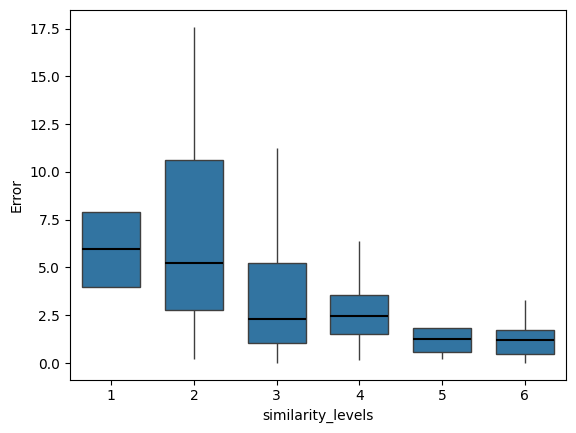

In [ ]:
# # Display error distribution across similarity levels
# grouped = results_with_similarity_levels.groupby('similarity_levels')['diff'].agg(["mean", "std", "min", "max"])
# df_melted = results_with_similarity_levels.melt(id_vars=['similarity_levels'], 
#                           value_vars=['diff'], 
#                           var_name='FFNN', 
#                           value_name='Error')


# df_melted = df_melted[df_melted['similarity_levels'] > 0]
# # Create the boxplot for error distribution across similarity levels
# ax = sns.boxplot(
#     x='similarity_levels', 
#     y='Error', 
#     # hue='FFNN',  # Different colors for different models
#     data=df_melted, 
#     width=0.7, 
#     showcaps=False, 
#     # palette="Set3",  # Use a visually appealing color scheme
#     medianprops={'color':'black', 'linewidth':1.5},
#     showfliers=False
# )